In [4]:
!pip install vit-keras

In [3]:
!python.exe -m pip install --upgrade pip

   ---------------------------------------- 0.0/1.8 MB ? eta -:--:--
   ---------------------------------------- 0.0/1.8 MB ? eta -:--:--
   ----------- ---------------------------- 0.5/1.8 MB 4.2 MB/s eta 0:00:01
   ---------------------------------- ----- 1.6/1.8 MB 4.0 MB/s eta 0:00:01
   ---------------------------------------- 1.8/1.8 MB 3.7 MB/s  0:00:00
  Attempting uninstall: pip
    Found existing installation: pip 26.1.2
    Uninstalling pip-26.1.2:
      Successfully uninstalled pip-26.1.2


In [5]:
!pip install transformers tensorflow

In [6]:
from transformers import TFViTModel

model = TFViTModel.from_pretrained(
    "google/vit-base-patch16-224"
)

print("ViT loaded successfully")

Some weights of the PyTorch model were not used when initializing the TF 2.0 model TFViTModel: ['classifier.weight', 'classifier.bias']
- This IS expected if you are initializing TFViTModel from a PyTorch model trained on another task or with another architecture (e.g. initializing a TFBertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing TFViTModel from a PyTorch model that you expect to be exactly identical (e.g. initializing a TFBertForSequenceClassification model from a BertForSequenceClassification model).
Some weights or buffers of the TF 2.0 model TFViTModel were not initialized from the PyTorch model and are newly initialized: ['vit.pooler.dense.weight', 'vit.pooler.dense.bias']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


ViT loaded successfully


# Imports

In [8]:
import os
import glob
import cv2
import random
import warnings

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

import tensorflow as tf
from tensorflow.keras import layers, models
from tensorflow.keras.callbacks import (
    EarlyStopping,
    ReduceLROnPlateau,
    ModelCheckpoint
)

from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import (
    confusion_matrix,
    classification_report,
    roc_curve,
    auc
)

# Hugging Face Vision Transformer
from transformers import TFViTForImageClassification

# Suppress warnings
warnings.filterwarnings("ignore")
os.environ["TF_CPP_MIN_LOG_LEVEL"] = "3"

# Reproducibility
SEED = 42

random.seed(SEED)
np.random.seed(SEED)
tf.random.set_seed(SEED)

# Optional: enable deterministic operations
try:
    tf.config.experimental.enable_op_determinism()
except:
    pass

print("TensorFlow Version:", tf.__version__)
print("Environment Ready")



TensorFlow Version: 2.19.0
Environment Ready


# 3) DATASET PATHS

In [9]:
DATA_DIR = {
    "Calculus": r"E:\Dr. Atef Ismail\Khaled Dental\Paper2\archive (10)\Calculus",

    "Caries-Gingivitus":
    r"E:\Dr. Atef Ismail\Khaled Dental\Paper2\archive (10)\Caries_Gingivitus",

    "Gingivitis":
    r"E:\Dr. Atef Ismail\Khaled Dental\Paper2\archive (10)\Gingivitis",

    "Mouth Ulcer":
    r"E:\Dr. Atef Ismail\Khaled Dental\Paper2\archive (10)\Mouth Ulcer",

    "Tooth Discoloration":
    r"E:\Dr. Atef Ismail\Khaled Dental\Paper2\archive (10)\Tooth Discoloration",

    "Hypodontia":
    r"E:\Dr. Atef Ismail\Khaled Dental\Paper2\archive (10)\hypodontia"
}

# 4) READ DATASET RECURSIVELY

In [22]:
image_paths = []
labels = []

extensions = ("*.jpg", "*.jpeg", "*.png", "*.bmp")

for class_name, folder_path in DATA_DIR.items():

    for ext in extensions:

        files = glob.glob(
            os.path.join(folder_path, "**", ext),
            recursive=True
        )

        image_paths.extend(files)

        labels.extend([class_name] * len(files))

print("Total Images:", len(image_paths))

Total Images: 10764


In [23]:
label_encoder = LabelEncoder()

df["label_encoded"] = label_encoder.fit_transform(df["label"])

class_names = list(label_encoder.classes_)

num_classes = len(class_names)

print(class_names)

KeyError: 'label'

In [38]:
# ============================================================
# DENTAL DATASET PREPARATION
# 70% TRAIN / 15% VALIDATION / 15% TEST
# STRATIFIED SPLITTING
# ============================================================

import os
import glob
import random
import hashlib
import pandas as pd
import numpy as np

from pathlib import Path
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder


# ============================================================
# 1. CONFIGURATION
# ============================================================

DATA_DIR = {

    "Calculus":
        r"E:\Dr. Atef Ismail\Khaled Dental\Paper2\archive (10)\Calculus",

    "Caries-Gingivitis":
        r"E:\Dr. Atef Ismail\Khaled Dental\Paper2\archive (10)\Caries_Gingivitus",

    "Gingivitis":
        r"E:\Dr. Atef Ismail\Khaled Dental\Paper2\archive (10)\Gingivitis",

    "Hypodontia":
        r"E:\Dr. Atef Ismail\Khaled Dental\Paper2\archive (10)\hypodontia",

    "Mouth Ulcer":
        r"E:\Dr. Atef Ismail\Khaled Dental\Paper2\archive (10)\Mouth Ulcer",

    "Tooth Discoloration":
        r"E:\Dr. Atef Ismail\Khaled Dental\Paper2\archive (10)\Tooth Discoloration"
}


# ============================================================
# 2. SPLIT CONFIGURATION
# ============================================================

TRAIN_RATIO = 0.70
VAL_RATIO   = 0.15
TEST_RATIO  = 0.15

RANDOM_STATE = 42

IMAGE_EXTENSIONS = (
    ".jpg",
    ".jpeg",
    ".png",
    ".bmp",
    ".tif",
    ".tiff",
    ".webp"
)


# ============================================================
# 3. REPRODUCIBILITY
# ============================================================

random.seed(RANDOM_STATE)
np.random.seed(RANDOM_STATE)


# ============================================================
# 4. COLLECT ALL IMAGES
# ============================================================

records = []

print("=" * 90)
print("ORIGINAL DATASET DISTRIBUTION")
print("=" * 90)

for class_name, folder in DATA_DIR.items():

    folder = Path(folder)

    if not folder.exists():

        print(
            f"ERROR: Folder does not exist:\n{folder}"
        )

        continue

    class_files = []

    for file in folder.rglob("*"):

        if (
            file.is_file()
            and file.suffix.lower() in IMAGE_EXTENSIONS
        ):

            class_files.append(file)

    print(
        f"{class_name:25s}: "
        f"{len(class_files):6d} images"
    )

    for image_path in sorted(class_files):

        records.append({

            "image_path":
                str(image_path),

            "filename":
                image_path.name,

            "class":
                class_name
        })


# ============================================================
# 5. CREATE DATAFRAME
# ============================================================

df = pd.DataFrame(records)

print("-" * 90)

print(
    f"{'TOTAL':25s}: "
    f"{len(df):6d} images"
)


# ============================================================
# 6. REMOVE DUPLICATE FILEPATHS
# ============================================================

before = len(df)

df = df.drop_duplicates(
    subset=["image_path"]
).reset_index(drop=True)

after = len(df)

print(
    f"\nDuplicate file paths removed: "
    f"{before - after}"
)

print(
    f"Final dataset size: {after}"
)


# ============================================================
# 7. LABEL ENCODING
# ============================================================

label_encoder = LabelEncoder()

df["label_encoded"] = (
    label_encoder.fit_transform(
        df["class"]
    )
)

class_names = list(
    label_encoder.classes_
)

num_classes = len(class_names)


print("\n" + "=" * 90)
print("CLASS ENCODING")
print("=" * 90)

for idx, class_name in enumerate(class_names):

    print(
        f"{idx}: {class_name}"
    )

print(
    f"\nNumber of classes: {num_classes}"
)


# ============================================================
# 8. FIRST SPLIT
# ============================================================
# 70% TRAIN
# 30% TEMPORARY
# ============================================================

train_df, temp_df = train_test_split(

    df,

    test_size=(
        VAL_RATIO + TEST_RATIO
    ),

    stratify=df["label_encoded"],

    random_state=RANDOM_STATE
)


# ============================================================
# 9. SECOND SPLIT
# ============================================================
# 15% VALIDATION
# 15% TEST
# ============================================================

val_df, test_df = train_test_split(

    temp_df,

    test_size=0.5,

    stratify=temp_df["label_encoded"],

    random_state=RANDOM_STATE
)


# ============================================================
# 10. RESET INDICES
# ============================================================

train_df = train_df.reset_index(drop=True)

val_df = val_df.reset_index(drop=True)

test_df = test_df.reset_index(drop=True)


# ============================================================
# 11. ADD SPLIT INFORMATION
# ============================================================

train_df["split"] = "Training"

val_df["split"] = "Validation"

test_df["split"] = "Test"


# ============================================================
# 12. VERIFY DATASET SIZES
# ============================================================

print("\n" + "=" * 90)
print("DATASET SPLIT")
print("=" * 90)

print(
    f"Training images   : {len(train_df):6d}"
)

print(
    f"Validation images : {len(val_df):6d}"
)

print(
    f"Test images       : {len(test_df):6d}"
)

print("-" * 90)

print(
    f"Total images      : "
    f"{len(train_df) + len(val_df) + len(test_df):6d}"
)


# ============================================================
# 13. VERIFY NO IMAGE OVERLAP
# ============================================================

train_paths = set(
    train_df["image_path"]
)

val_paths = set(
    val_df["image_path"]
)

test_paths = set(
    test_df["image_path"]
)


train_val_overlap = (
    train_paths & val_paths
)

train_test_overlap = (
    train_paths & test_paths
)

val_test_overlap = (
    val_paths & test_paths
)


print("\n" + "=" * 90)
print("DATA LEAKAGE CHECK")
print("=" * 90)

print(
    "Train ∩ Validation :",
    len(train_val_overlap)
)

print(
    "Train ∩ Test       :",
    len(train_test_overlap)
)

print(
    "Validation ∩ Test  :",
    len(val_test_overlap)
)


if (
    len(train_val_overlap) == 0
    and
    len(train_test_overlap) == 0
    and
    len(val_test_overlap) == 0
):

    print(
        "\n✓ No image-path overlap detected."
    )

else:

    print(
        "\nWARNING: Dataset overlap detected!"
    )


# ============================================================
# 14. CLASS-WISE DISTRIBUTION TABLE
# ============================================================

distribution = []


for class_id, class_name in enumerate(class_names):

    original_count = len(
        df[
            df["label_encoded"]
            == class_id
        ]
    )

    training_count = len(
        train_df[
            train_df["label_encoded"]
            == class_id
        ]
    )

    validation_count = len(
        val_df[
            val_df["label_encoded"]
            == class_id
        ]
    )

    test_count = len(
        test_df[
            test_df["label_encoded"]
            == class_id
        ]
    )

    distribution.append({

        "Class ID":
            class_id,

        "Class":
            class_name,

        "Original Samples":
            original_count,

        "Training Samples":
            training_count,

        "Validation Samples":
            validation_count,

        "Test Samples":
            test_count,

        "Total After Split":
            (
                training_count
                +
                validation_count
                +
                test_count
            )
    })


distribution_df = pd.DataFrame(
    distribution
)


# ============================================================
# 15. TOTAL ROW
# ============================================================

total_row = pd.DataFrame([{

    "Class ID":
        "",

    "Class":
        "Total",

    "Original Samples":
        distribution_df[
            "Original Samples"
        ].sum(),

    "Training Samples":
        distribution_df[
            "Training Samples"
        ].sum(),

    "Validation Samples":
        distribution_df[
            "Validation Samples"
        ].sum(),

    "Test Samples":
        distribution_df[
            "Test Samples"
        ].sum(),

    "Total After Split":
        distribution_df[
            "Total After Split"
        ].sum()
}])


distribution_df = pd.concat(

    [
        distribution_df,
        total_row
    ],

    ignore_index=True
)


# ============================================================
# 16. DISPLAY TABLE
# ============================================================

print("\n" + "=" * 120)

print(
    "CLASS-WISE DISTRIBUTION "
    "OF THE DENTAL DATASET"
)

print("=" * 120)

print(
    distribution_df.to_string(
        index=False
    )
)


# ============================================================
# 17. SAVE TABLE
# ============================================================

distribution_df.to_csv(

    "Dataset_Distribution.csv",

    index=False,

    encoding="utf-8-sig"
)

print(
    "\n✓ Table saved:"
    " Dataset_Distribution.csv"
)

ORIGINAL DATASET DISTRIBUTION
Calculus                 :   1296 images
Caries-Gingivitis        :   1493 images
Gingivitis               :   2349 images
Hypodontia               :   1251 images
Mouth Ulcer              :   2541 images
Tooth Discoloration      :   1834 images
------------------------------------------------------------------------------------------
TOTAL                    :  10764 images

Duplicate file paths removed: 0
Final dataset size: 10764

CLASS ENCODING
0: Calculus
1: Caries-Gingivitis
2: Gingivitis
3: Hypodontia
4: Mouth Ulcer
5: Tooth Discoloration

Number of classes: 6

DATASET SPLIT
Training images   :   7534
Validation images :   1615
Test images       :   1615
------------------------------------------------------------------------------------------
Total images      :  10764

DATA LEAKAGE CHECK
Train ∩ Validation : 0
Train ∩ Test       : 0
Validation ∩ Test  : 0

✓ No image-path overlap detected.

CLASS-WISE DISTRIBUTION OF THE DENTAL DATASET
Class ID   

In [26]:
df = pd.DataFrame({
    "image_path": image_paths,
    "label": labels
})

df.head()

,image_path,label
0,E:\Dr. Atef Ismail\Khaled Dental\Paper2\archiv...,Calculus
1,E:\Dr. Atef Ismail\Khaled Dental\Paper2\archiv...,Calculus
2,E:\Dr. Atef Ismail\Khaled Dental\Paper2\archiv...,Calculus
3,E:\Dr. Atef Ismail\Khaled Dental\Paper2\archiv...,Calculus
4,E:\Dr. Atef Ismail\Khaled Dental\Paper2\archiv...,Calculus


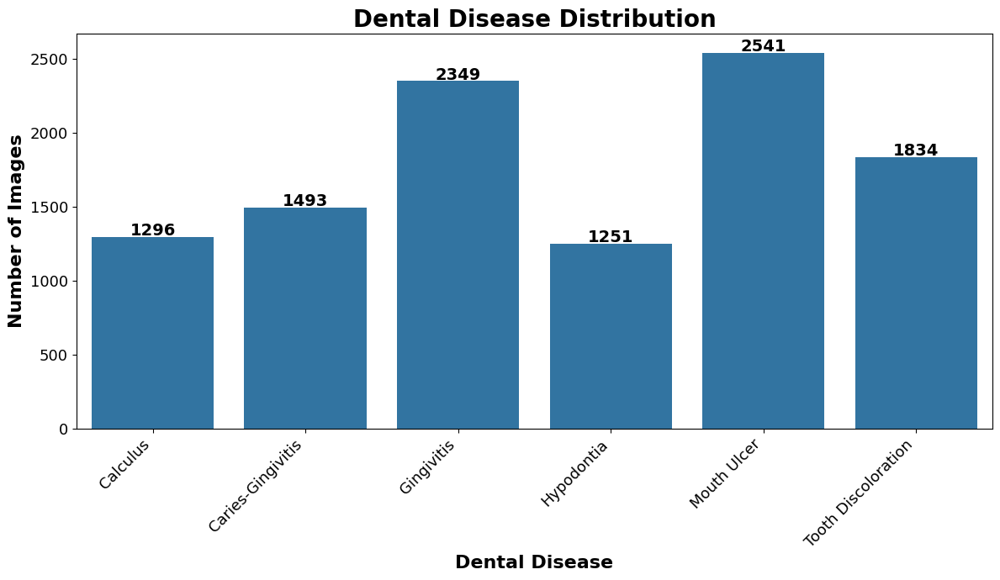

In [27]:
import matplotlib.pyplot as plt
import seaborn as sns

plt.figure(figsize=(12, 7))

ax = sns.countplot(data=df, x="label")

# Add values above bars
for bar in ax.patches:
    ax.text(
        bar.get_x() + bar.get_width() / 2,
        bar.get_height() + 10,
        f"{int(bar.get_height())}",
        ha="center",
        fontsize=14,
        fontweight="bold"
    )

plt.title("Dental Disease Distribution", fontsize=20, fontweight="bold")
plt.xlabel("Dental Disease", fontsize=16, fontweight="bold")
plt.ylabel("Number of Images", fontsize=16, fontweight="bold")

plt.xticks(rotation=45, ha="right", fontsize=13)
plt.yticks(fontsize=13)

plt.tight_layout()

# Save at 600 DPI
plt.savefig(
    "Dental_Disease_Distribution.png",
    dpi=600,
    bbox_inches="tight"
)

plt.show()

In [28]:
label_encoder = LabelEncoder()

df["label_encoded"] = label_encoder.fit_transform(df["label"])

class_names = list(label_encoder.classes_)

num_classes = len(class_names)

print(class_names)

['Calculus', 'Caries-Gingivitis', 'Gingivitis', 'Hypodontia', 'Mouth Ulcer', 'Tooth Discoloration']


In [29]:
train_df, val_df = train_test_split(
    df,
    test_size=0.2,
    stratify=df["label_encoded"],
    random_state=42
)

In [30]:
# ============================================================
# DENTAL DATASET CLASS DISTRIBUTION AND STRATIFIED SPLITTING
# ============================================================
#
# Dataset structure:
#
# archive (10)/
# ├── Calculus/
# ├── Caries_Gingivitus/
# ├── Gingivitis/
# ├── hypodontia/
# ├── Mouth Ulcer/
# └── Tooth Discoloration/
#
# This code:
# 1. Reads images directly from class folders
# 2. Counts original images
# 3. Performs stratified 70/15/15 split
# 4. Creates train/validation/test folders
# 5. Checks for filename overlap
# 6. Generates class-wise distribution table
# 7. Saves CSV files
# ============================================================

import os
import shutil
import random
import pandas as pd
import numpy as np

from pathlib import Path
from sklearn.model_selection import train_test_split


# ============================================================
# 1. CONFIGURATION
# ============================================================

DATA_DIR = {

    "Calculus":
        r"E:\Dr. Atef Ismail\Khaled Dental\Paper2\archive (10)\Calculus",

    "Caries-Gingivitis":
        r"E:\Dr. Atef Ismail\Khaled Dental\Paper2\archive (10)\Caries_Gingivitus",

    "Gingivitis":
        r"E:\Dr. Atef Ismail\Khaled Dental\Paper2\archive (10)\Gingivitis",

    "Hypodontia":
        r"E:\Dr. Atef Ismail\Khaled Dental\Paper2\archive (10)\hypodontia",

    "Mouth Ulcer":
        r"E:\Dr. Atef Ismail\Khaled Dental\Paper2\archive (10)\Mouth Ulcer",

    "Tooth Discoloration":
        r"E:\Dr. Atef Ismail\Khaled Dental\Paper2\archive (10)\Tooth Discoloration"
}


# ============================================================
# 2. SPLIT RATIOS
# ============================================================

TRAIN_RATIO = 0.70
VAL_RATIO = 0.15
TEST_RATIO = 0.15

RANDOM_STATE = 42

IMAGE_EXTENSIONS = {

    ".jpg",
    ".jpeg",
    ".png",
    ".bmp",
    ".tif",
    ".tiff",
    ".webp"
}


# ============================================================
# 3. OUTPUT DIRECTORY
# ============================================================

OUTPUT_DIR = Path(
    r"E:\Dr. Atef Ismail\Khaled Dental\Paper2\Dental_Stratified_Split"
)

TRAIN_DIR = OUTPUT_DIR / "train"
VAL_DIR = OUTPUT_DIR / "validation"
TEST_DIR = OUTPUT_DIR / "test"


# ============================================================
# 4. RANDOM SEED
# ============================================================

random.seed(RANDOM_STATE)
np.random.seed(RANDOM_STATE)


# ============================================================
# 5. CHECK DATASET FOLDERS
# ============================================================

print("=" * 80)
print("CHECKING DATASET FOLDERS")
print("=" * 80)

for class_name, folder in DATA_DIR.items():

    if not os.path.exists(folder):

        print(
            f"ERROR: Folder does not exist: {folder}"
        )

    else:

        print(
            f"✓ {class_name}: {folder}"
        )


# ============================================================
# 6. COLLECT IMAGES
# ============================================================

def get_images(folder):

    folder = Path(folder)

    images = []

    for file in folder.iterdir():

        if file.is_file():

            if file.suffix.lower() in IMAGE_EXTENSIONS:

                images.append(file)

    return sorted(images)


# ============================================================
# 7. BUILD DATAFRAME
# ============================================================

records = []

print("\n" + "=" * 80)
print("ORIGINAL DATASET DISTRIBUTION")
print("=" * 80)

for class_name, folder in DATA_DIR.items():

    images = get_images(folder)

    print(
        f"{class_name:25s}: "
        f"{len(images):6d} images"
    )

    for image_path in images:

        records.append({

            "filepath": str(image_path),

            "filename": image_path.name,

            "class": class_name

        })


df = pd.DataFrame(records)


# ============================================================
# 8. ORIGINAL DATASET SUMMARY
# ============================================================

print("\n" + "=" * 80)
print("ORIGINAL DATASET SUMMARY")
print("=" * 80)

original_counts = (
    df["class"]
    .value_counts()
    .sort_index()
)

for class_name in DATA_DIR.keys():

    count = original_counts.get(
        class_name,
        0
    )

    print(
        f"{class_name:25s}: {count:6d}"
    )

print("-" * 80)

print(
    f"{'TOTAL':25s}: "
    f"{len(df):6d}"
)


# ============================================================
# 9. STRATIFIED TRAIN/TEST SPLIT
# ============================================================
#
# First:
# 70% training
# 30% temporary
#
# Then:
# temporary -> 50% validation + 50% test
#
# Final:
# 70% train
# 15% validation
# 15% test
# ============================================================

train_df, temp_df = train_test_split(

    df,

    test_size=(VAL_RATIO + TEST_RATIO),

    stratify=df["class"],

    random_state=RANDOM_STATE
)


# ============================================================
# 10. VALIDATION / TEST SPLIT
# ============================================================

val_df, test_df = train_test_split(

    temp_df,

    test_size=0.5,

    stratify=temp_df["class"],

    random_state=RANDOM_STATE
)


# ============================================================
# 11. ADD SPLIT COLUMN
# ============================================================

train_df = train_df.copy()
val_df = val_df.copy()
test_df = test_df.copy()

train_df["split"] = "Training"
val_df["split"] = "Validation"
test_df["split"] = "Test"


# ============================================================
# 12. COMBINE SPLITS
# ============================================================

all_split_df = pd.concat(

    [
        train_df,
        val_df,
        test_df
    ],

    ignore_index=True
)


# ============================================================
# 13. PRINT SPLIT SIZES
# ============================================================

print("\n" + "=" * 80)
print("DATASET SPLIT")
print("=" * 80)

print(
    f"Training images   : {len(train_df):6d}"
)

print(
    f"Validation images : {len(val_df):6d}"
)

print(
    f"Test images       : {len(test_df):6d}"
)

print("-" * 80)

print(
    f"Total images      : {len(all_split_df):6d}"
)


# ============================================================
# 14. CLASS-WISE DISTRIBUTION
# ============================================================

distribution = []

for class_id, class_name in enumerate(DATA_DIR.keys()):

    original = len(
        df[
            df["class"] == class_name
        ]
    )

    training = len(
        train_df[
            train_df["class"] == class_name
        ]
    )

    validation = len(
        val_df[
            val_df["class"] == class_name
        ]
    )

    test = len(
        test_df[
            test_df["class"] == class_name
        ]
    )

    total_after_split = (
        training +
        validation +
        test
    )

    distribution.append({

        "Class ID": class_id,

        "Class": class_name,

        "Original Samples": original,

        "Training Samples": training,

        "Validation Samples": validation,

        "Test Samples": test,

        "Total After Split": total_after_split
    })


distribution_df = pd.DataFrame(
    distribution
)


# ============================================================
# 15. ADD TOTAL ROW
# ============================================================

total_row = {

    "Class ID": "",

    "Class": "Total",

    "Original Samples":
        distribution_df[
            "Original Samples"
        ].sum(),

    "Training Samples":
        distribution_df[
            "Training Samples"
        ].sum(),

    "Validation Samples":
        distribution_df[
            "Validation Samples"
        ].sum(),

    "Test Samples":
        distribution_df[
            "Test Samples"
        ].sum(),

    "Total After Split":
        distribution_df[
            "Total After Split"
        ].sum()
}


distribution_df = pd.concat(

    [
        distribution_df,

        pd.DataFrame([total_row])
    ],

    ignore_index=True
)


# ============================================================
# 16. DISPLAY MANUSCRIPT TABLE
# ============================================================

print("\n" + "=" * 100)
print(
    "TABLE X. CLASS-WISE DISTRIBUTION OF THE DENTAL DATASET"
)
print("=" * 100)

print(
    distribution_df.to_string(
        index=False
    )
)


# ============================================================
# 17. VERIFY DISTRIBUTION
# ============================================================

print("\n" + "=" * 80)
print("DATA CONSISTENCY CHECK")
print("=" * 80)

for _, row in distribution_df.iloc[:-1].iterrows():

    original = int(
        row["Original Samples"]
    )

    after_split = int(
        row["Total After Split"]
    )

    if original == after_split:

        print(
            f"✓ {row['Class']}: "
            f"{original} = {after_split}"
        )

    else:

        print(
            f"✗ ERROR {row['Class']}: "
            f"{original} != {after_split}"
        )


# ============================================================
# 18. VERIFY GLOBAL COUNTS
# ============================================================

original_total = len(df)

train_total = len(train_df)

val_total = len(val_df)

test_total = len(test_df)

split_total = (
    train_total +
    val_total +
    test_total
)

print("\n" + "=" * 80)
print("OVERALL TOTALS")
print("=" * 80)

print(
    f"Original dataset : {original_total}"
)

print(
    f"Training        : {train_total}"
)

print(
    f"Validation      : {val_total}"
)

print(
    f"Test            : {test_total}"
)

print(
    f"After split     : {split_total}"
)


if original_total == split_total:

    print(
        "\n✓ Dataset split is completely consistent."
    )

else:

    print(
        "\n✗ ERROR: Dataset totals do not match."
    )


# ============================================================
# 19. CHECK DUPLICATE FILENAMES
# ============================================================

train_files = set(
    train_df["filename"]
)

val_files = set(
    val_df["filename"]
)

test_files = set(
    test_df["filename"]
)


train_val_overlap = (
    train_files &
    val_files
)

train_test_overlap = (
    train_files &
    test_files
)

val_test_overlap = (
    val_files &
    test_files
)


print("\n" + "=" * 80)
print("DATA LEAKAGE / OVERLAP CHECK")
print("=" * 80)

print(
    f"Train ∩ Validation : "
    f"{len(train_val_overlap)}"
)

print(
    f"Train ∩ Test       : "
    f"{len(train_test_overlap)}"
)

print(
    f"Validation ∩ Test  : "
    f"{len(val_test_overlap)}"
)


if (

    len(train_val_overlap) == 0
    and
    len(train_test_overlap) == 0
    and
    len(val_test_overlap) == 0

):

    print(
        "\n✓ No filename overlap detected."
    )

else:

    print(
        "\n⚠ Potential data leakage detected."
    )


# ============================================================
# 20. CREATE OUTPUT DIRECTORIES
# ============================================================

print("\n" + "=" * 80)
print("CREATING TRAIN / VALIDATION / TEST DIRECTORIES")
print("=" * 80)


for split_dir in [

    TRAIN_DIR,
    VAL_DIR,
    TEST_DIR

]:

    split_dir.mkdir(
        parents=True,
        exist_ok=True
    )


for class_name in DATA_DIR.keys():

    (
        TRAIN_DIR / class_name
    ).mkdir(
        parents=True,
        exist_ok=True
    )

    (
        VAL_DIR / class_name
    ).mkdir(
        parents=True,
        exist_ok=True
    )

    (
        TEST_DIR / class_name
    ).mkdir(
        parents=True,
        exist_ok=True
    )


# ============================================================
# 21. COPY IMAGES
# ============================================================

def copy_split_images(

    split_df,
    destination_root,
    split_name

):

    print(
        f"\nCopying {split_name} images..."
    )

    for _, row in split_df.iterrows():

        source = Path(
            row["filepath"]
        )

        destination = (

            destination_root
            /
            row["class"]
            /
            row["filename"]

        )

        shutil.copy2(
            source,
            destination
        )


copy_split_images(

    train_df,

    TRAIN_DIR,

    "Training"

)

copy_split_images(

    val_df,

    VAL_DIR,

    "Validation"

)

copy_split_images(

    test_df,

    TEST_DIR,

    "Test"
)


# ============================================================
# 22. SAVE DATAFRAME FILES
# ============================================================

OUTPUT_DIR.mkdir(
    parents=True,
    exist_ok=True
)

train_df.to_csv(

    OUTPUT_DIR /
    "training_images.csv",

    index=False
)

val_df.to_csv(

    OUTPUT_DIR /
    "validation_images.csv",

    index=False
)

test_df.to_csv(

    OUTPUT_DIR /
    "test_images.csv",

    index=False
)

all_split_df.to_csv(

    OUTPUT_DIR /
    "all_dataset_splits.csv",

    index=False
)


# ============================================================
# 23. SAVE TABLE X
# ============================================================

table_x_path = (

    OUTPUT_DIR /
    "Table_X_Dataset_Distribution.csv"

)

distribution_df.to_csv(

    table_x_path,

    index=False
)


# ============================================================
# 24. FINAL OUTPUT
# ============================================================

print("\n" + "=" * 100)
print("TABLE X. CLASS-WISE DISTRIBUTION OF THE DENTAL DATASET")
print("=" * 100)

print(
    distribution_df.to_string(
        index=False
    )
)

print("\n" + "=" * 100)
print("FILES SAVED")
print("=" * 100)

print(
    "Training CSV     :",
    OUTPUT_DIR / "training_images.csv"
)

print(
    "Validation CSV   :",
    OUTPUT_DIR / "validation_images.csv"
)

print(
    "Test CSV         :",
    OUTPUT_DIR / "test_images.csv"
)

print(
    "All splits CSV   :",
    OUTPUT_DIR / "all_dataset_splits.csv"
)

print(
    "Table X CSV      :",
    table_x_path
)

print("\n" + "=" * 100)
print("COMPLETED SUCCESSFULLY")
print("=" * 100)

CHECKING DATASET FOLDERS
✓ Calculus: E:\Dr. Atef Ismail\Khaled Dental\Paper2\archive (10)\Calculus
✓ Caries-Gingivitis: E:\Dr. Atef Ismail\Khaled Dental\Paper2\archive (10)\Caries_Gingivitus
✓ Gingivitis: E:\Dr. Atef Ismail\Khaled Dental\Paper2\archive (10)\Gingivitis
✓ Hypodontia: E:\Dr. Atef Ismail\Khaled Dental\Paper2\archive (10)\hypodontia
✓ Mouth Ulcer: E:\Dr. Atef Ismail\Khaled Dental\Paper2\archive (10)\Mouth Ulcer
✓ Tooth Discoloration: E:\Dr. Atef Ismail\Khaled Dental\Paper2\archive (10)\Tooth Discoloration

ORIGINAL DATASET DISTRIBUTION
Calculus                 :   1296 images
Caries-Gingivitis        :   1493 images
Gingivitis               :   2349 images
Hypodontia               :   1251 images
Mouth Ulcer              :   2541 images
Tooth Discoloration      :   1834 images

ORIGINAL DATASET SUMMARY
Calculus                 :   1296
Caries-Gingivitis        :   1493
Gingivitis               :   2349
Hypodontia               :   1251
Mouth Ulcer              :   2541
Toot

In [31]:
IMG_SIZE = 224
BATCH_SIZE = 16

def load_image(path, label):

    image = tf.io.read_file(path)

    image = tf.image.decode_jpeg(image, channels=3)

    image = tf.image.resize(image, [IMG_SIZE, IMG_SIZE])

    image = tf.cast(image, tf.float32) / 255.0

    return image, label

In [32]:
augmentation = tf.keras.Sequential([

    layers.RandomFlip("horizontal"),

    layers.RandomRotation(0.1),

    layers.RandomZoom(0.1),

    layers.RandomContrast(0.1)

])

In [33]:
# ============================================================
# TENSORFLOW DATA PIPELINES
# TRAIN / VALIDATION / TEST
# ============================================================

import tensorflow as tf

AUTOTUNE = tf.data.AUTOTUNE

# ============================================================
# 1. CLASS MAPPING
# ============================================================

class_names = [
    "Calculus",
    "Caries-Gingivitis",
    "Gingivitis",
    "Hypodontia",
    "Mouth Ulcer",
    "Tooth Discoloration"
]

class_to_id = {
    name: i for i, name in enumerate(class_names)
}

# Convert class names to integer labels
train_df["label"] = train_df["class"].map(class_to_id)
val_df["label"] = val_df["class"].map(class_to_id)
test_df["label"] = test_df["class"].map(class_to_id)


# ============================================================
# 2. CHECK LABELS
# ============================================================

print("=" * 70)
print("CLASS MAPPING")
print("=" * 70)

for name, label in class_to_id.items():
    print(f"{label}: {name}")

print("=" * 70)


# ============================================================
# 3. DATASET CREATION FUNCTION
# ============================================================

def create_dataset(dataframe, training=False):

    dataset = tf.data.Dataset.from_tensor_slices(
        (
            dataframe["filepath"].values,
            dataframe["label"].values
        )
    )

    # Shuffle training data only
    if training:
        dataset = dataset.shuffle(
            buffer_size=len(dataframe),
            seed=42,
            reshuffle_each_iteration=True
        )

    # Load images
    dataset = dataset.map(
        load_image,
        num_parallel_calls=AUTOTUNE
    )

    # Augmentation for training only
    if training:
        dataset = dataset.map(
            lambda x, y: (
                augmentation(x, training=True),
                y
            ),
            num_parallel_calls=AUTOTUNE
        )

    # Batch
    dataset = dataset.batch(BATCH_SIZE)

    # Prefetch
    dataset = dataset.prefetch(AUTOTUNE)

    return dataset


# ============================================================
# 4. CREATE DATASETS
# ============================================================

train_ds = create_dataset(
    train_df,
    training=True
)

val_ds = create_dataset(
    val_df,
    training=False
)

test_ds = create_dataset(
    test_df,
    training=False
)


# ============================================================
# 5. DATASET SUMMARY
# ============================================================

print("=" * 70)
print("TENSORFLOW DATASET SUMMARY")
print("=" * 70)

print(f"Training images    : {len(train_df):,}")
print(f"Validation images  : {len(val_df):,}")
print(f"Test images        : {len(test_df):,}")

print("-" * 70)

print(
    f"Training batches   : "
    f"{tf.data.experimental.cardinality(train_ds).numpy():,}"
)

print(
    f"Validation batches : "
    f"{tf.data.experimental.cardinality(val_ds).numpy():,}"
)

print(
    f"Test batches       : "
    f"{tf.data.experimental.cardinality(test_ds).numpy():,}"
)

print("=" * 70)

CLASS MAPPING
0: Calculus
1: Caries-Gingivitis
2: Gingivitis
3: Hypodontia
4: Mouth Ulcer
5: Tooth Discoloration
TENSORFLOW DATASET SUMMARY
Training images    : 7,534
Validation images  : 1,615
Test images        : 1,615
----------------------------------------------------------------------
Training batches   : 471
Validation batches : 101
Test batches       : 101


In [22]:
print("Training columns:")
print(train_df.columns.tolist())

print("\nValidation columns:")
print(val_df.columns.tolist())

print("\nTest columns:")
print(test_df.columns.tolist())

print("\nTraining data:")
print(train_df.head())

Training columns:
['filepath', 'filename', 'class', 'split']

Validation columns:
['filepath', 'filename', 'class', 'split']

Test columns:
['filepath', 'filename', 'class', 'split']

Training data:
                                                filepath  \
10698  E:\Dr. Atef Ismail\Khaled Dental\Paper2\archiv...   
2812   E:\Dr. Atef Ismail\Khaled Dental\Paper2\archiv...   
1144   E:\Dr. Atef Ismail\Khaled Dental\Paper2\archiv...   
1094   E:\Dr. Atef Ismail\Khaled Dental\Paper2\archiv...   
9596   E:\Dr. Atef Ismail\Khaled Dental\Paper2\archiv...   

                              filename                class     split  
10698  Tooth_Discoloration_0_9676.jpeg  Tooth Discoloration  Training  
2812                        (1019).jpg           Gingivitis  Training  
1144                         (862).jpg             Calculus  Training  
1094                         (817).jpg             Calculus  Training  
9596    Tooth_Discoloration_0_423.jpeg  Tooth Discoloration  Training  


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


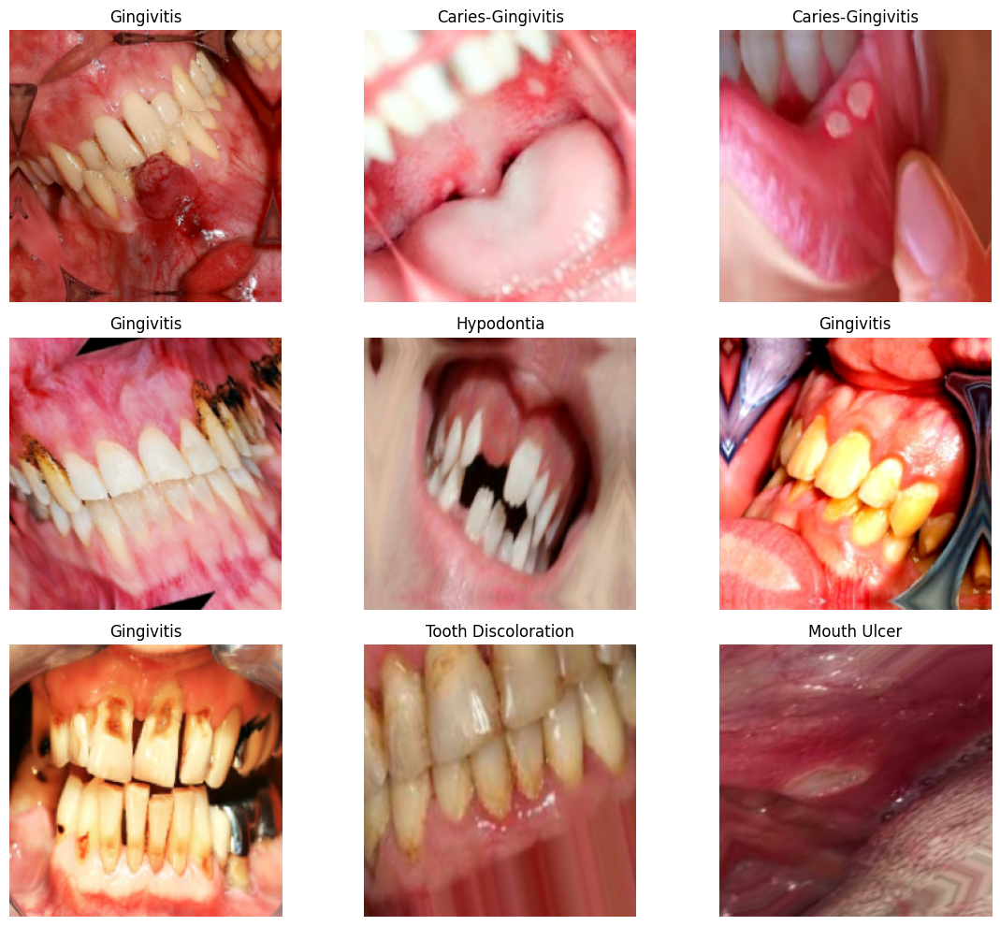

In [13]:
plt.figure(figsize=(12,10))

for images, labels in train_ds.take(1):

    for i in range(9):

        plt.subplot(3,3,i+1)

        plt.imshow(images[i])

        plt.title(class_names[labels[i]])

        plt.axis("off")

plt.tight_layout()

plt.show()

In [14]:
class CrossAttentionFusion(layers.Layer):

    def __init__(self, embed_dim=256):

        super().__init__()

        self.query = layers.Dense(embed_dim)

        self.key = layers.Dense(embed_dim)

        self.value = layers.Dense(embed_dim)

        self.softmax = layers.Softmax(axis=-1)

    def call(self, cnn_feat, vit_feat):

        q = self.query(cnn_feat)

        k = self.key(vit_feat)

        v = self.value(vit_feat)

        attention = tf.matmul(q, k, transpose_b=True)

        attention = self.softmax(attention)

        fusion = tf.matmul(attention, v)

        return fusion

In [15]:
class ViTLayer(tf.keras.layers.Layer):

    def __init__(self, **kwargs):
        super().__init__(**kwargs)

        self.vit = TFViTModel.from_pretrained(
            "google/vit-base-patch16-224"
        )

        self.vit.trainable = False

    def call(self, inputs):
        # NHWC -> NCHW (IMPORTANT FIX)
        pixel_values = tf.transpose(inputs, perm=[0, 3, 1, 2])
        pixel_values = tf.cast(pixel_values, tf.float32)

        outputs = self.vit(
            pixel_values=pixel_values,
            training=False
        )

        cls_token = outputs.last_hidden_state[:, 0, :]
        return cls_token

In [16]:
# =========================================================
# CUSTOM VIT LAYER
# =========================================================

class ViTLayer(tf.keras.layers.Layer):

    def __init__(self, **kwargs):
        super().__init__(**kwargs)

        self.vit = TFViTModel.from_pretrained(
            "google/vit-base-patch16-224"
        )

        self.vit.trainable = False

    def call(self, inputs):
        # NHWC -> NCHW (IMPORTANT FIX)
        pixel_values = tf.transpose(inputs, perm=[0, 3, 1, 2])
        pixel_values = tf.cast(pixel_values, tf.float32)

        outputs = self.vit(
            pixel_values=pixel_values,
            training=False
        )

        cls_token = outputs.last_hidden_state[:, 0, :]
        return cls_token


# =========================================================
# CROSS ATTENTION FUSION
# =========================================================

class CrossAttentionFusion(layers.Layer):

    def __init__(self, embed_dim=256, num_heads=4):

        super(CrossAttentionFusion, self).__init__()

        self.attention = layers.MultiHeadAttention(
            num_heads=num_heads,
            key_dim=embed_dim
        )

        self.norm = layers.LayerNormalization()

    def call(self, cnn_features, vit_features):

        attention_output = self.attention(
            query=cnn_features,
            key=vit_features,
            value=vit_features
        )

        return self.norm(
            cnn_features + attention_output
        )


# =========================================================
# BUILD MODEL
# =========================================================

def build_hybrid_model(num_classes):

    inputs = layers.Input(
        shape=(224, 224, 3)
    )

    # =====================================================
    # CNN BRANCH
    # =====================================================

    cnn_backbone = tf.keras.applications.MobileNetV2(
        input_shape=(224, 224, 3),
        include_top=False,
        weights="imagenet"
    )

    cnn_backbone.trainable = False

    cnn_features = cnn_backbone(inputs)

    cnn_gap = layers.GlobalAveragePooling2D()(cnn_features)

    cnn_gap = layers.Dense(
        256,
        activation="relu"
    )(cnn_gap)

    cnn_gap = layers.Reshape((1, 256))(cnn_gap)

    # =====================================================
    # ViT BRANCH
    # =====================================================

    vit_features = ViTLayer()(inputs)

    vit_features = layers.Dense(
        256,
        activation="relu"
    )(vit_features)

    vit_features = layers.Dropout(0.3)(vit_features)

    vit_features = layers.Reshape((1, 256))(vit_features)

    # =====================================================
    # FUSION
    # =====================================================

    fusion = CrossAttentionFusion()(
        cnn_gap,
        vit_features
    )

    fusion = layers.Flatten()(fusion)

    # =====================================================
    # CLASSIFIER
    # =====================================================

    x = layers.Dense(
        256,
        activation="relu",
        kernel_regularizer=tf.keras.regularizers.l2(0.001)
    )(fusion)

    x = layers.Dropout(0.4)(x)

    x = layers.Dense(
        128,
        activation="relu"
    )(x)

    x = layers.Dropout(0.3)(x)

    outputs = layers.Dense(
        num_classes,
        activation="softmax"
    )(x)

    model = models.Model(
        inputs,
        outputs
    )

    return model

In [17]:
from transformers import TFViTModel

model = build_hybrid_model(num_classes)

model.summary()

Some weights of the PyTorch model were not used when initializing the TF 2.0 model TFViTModel: ['classifier.weight', 'classifier.bias']
- This IS expected if you are initializing TFViTModel from a PyTorch model trained on another task or with another architecture (e.g. initializing a TFBertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing TFViTModel from a PyTorch model that you expect to be exactly identical (e.g. initializing a TFBertForSequenceClassification model from a BertForSequenceClassification model).
Some weights or buffers of the TF 2.0 model TFViTModel were not initialized from the PyTorch model and are newly initialized: ['vit.pooler.dense.weight', 'vit.pooler.dense.bias']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_1       │ (None, 224, 224,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ mobilenetv2_1.00_2… │ (None, 7, 7,      │  2,257,984 │ input_layer_1[0]… │
│ (Functional)        │ 1280)             │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ vi_t_layer          │ (None, 768)       │          0 │ input_layer_1[0]… │
│ (ViTLayer)          │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ global_average_poo… │ (None, 1280)      │          0 │ mobilenetv2_1.00… │
│ (GlobalAveragePool… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_1 (Dense)     │ (None, 256)       │    196,864 │ vi_t_layer[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense (Dense)       │ (None, 256)       │    327,936 │ global_average_p… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout (Dropout)   │ (None, 256)       │          0 │ dense_1[0][0]     │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ reshape (Reshape)   │ (None, 1, 256)    │          0 │ dense[0][0]       │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ reshape_1 (Reshape) │ (None, 1, 256)    │          0 │ dropout[0][0]     │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ cross_attention_fu… │ (None, 1, 256)    │  1,052,416 │ reshape[0][0],    │
│ (CrossAttentionFus… │                   │            │ reshape_1[0][0]   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ flatten (Flatten)   │ (None, 256)       │          0 │ cross_attention_… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_2 (Dense)     │ (None, 256)       │     65,792 │ flatten[0][0]     │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_2 (Dropout) │ (None, 256)       │          0 │ dense_2[0][0]     │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_3 (Dense)     │ (None, 128)       │     32,896 │ dropout_2[0][0]   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_3 (Dropout) │ (None, 128)       │          0 │ dense_3[0][0]     │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_4 (Dense)     │ (None, 6)         │        774 │ dropout_3[0][0]   │
└─────────────────────┴───────────────────┴────────────┴───────────────────┘

 Total params: 3,934,662 (15.01 MB)

 Trainable params: 1,676,678 (6.40 MB)

 Non-trainable params: 2,257,984 (8.61 MB)

In [18]:
model.compile(
    optimizer=tf.keras.optimizers.Adam(1e-4),
    loss='sparse_categorical_crossentropy',
    metrics=['accuracy']
)

In [19]:
callbacks = [

    EarlyStopping(
        patience=5,
        restore_best_weights=True
    ),

    ReduceLROnPlateau(
        factor=0.3,
        patience=2,
        min_lr=1e-6
    ),

    ModelCheckpoint(
        "best_hybrid_model.keras",
        save_best_only=True
    )
]

In [20]:
history = model.fit(
    train_ds,
    validation_data=val_ds,
    epochs=30,
    callbacks=callbacks
)

Epoch 1/30
471/471 ━━━━━━━━━━━━━━━━━━━━ 2076s 4s/step - accuracy: 0.5681 - loss: 1.3821 - val_accuracy: 0.7387 - val_loss: 0.9145 - learning_rate: 1.0000e-04
Epoch 2/30
471/471 ━━━━━━━━━━━━━━━━━━━━ 1595s 3s/step - accuracy: 0.6894 - loss: 1.0232 - val_accuracy: 0.7443 - val_loss: 0.8457 - learning_rate: 1.0000e-04
Epoch 3/30
471/471 ━━━━━━━━━━━━━━━━━━━━ 1619s 3s/step - accuracy: 0.7275 - loss: 0.9306 - val_accuracy: 0.7858 - val_loss: 0.7899 - learning_rate: 1.0000e-04
Epoch 4/30
471/471 ━━━━━━━━━━━━━━━━━━━━ 1693s 4s/step - accuracy: 0.7530 - loss: 0.8580 - val_accuracy: 0.7876 - val_loss: 0.7614 - learning_rate: 1.0000e-04
Epoch 5/30
471/471 ━━━━━━━━━━━━━━━━━━━━ 1619s 3s/step - accuracy: 0.7664 - loss: 0.8069 - val_accuracy: 0.7926 - val_loss: 0.7254 - learning_rate: 1.0000e-04
Epoch 6/30
471/471 ━━━━━━━━━━━━━━━━━━━━ 1640s 3s/step - accuracy: 0.7725 - loss: 0.7837 - val_accuracy: 0.7969 - val_loss: 0.7418 - learning_rate: 1.0000e-04
Epoch 7/30
471/471 ━━━━━━━━━━━━━━━━━━━━ 1615s 3s/ste

AttributeError: 'dict' object has no attribute 'history'

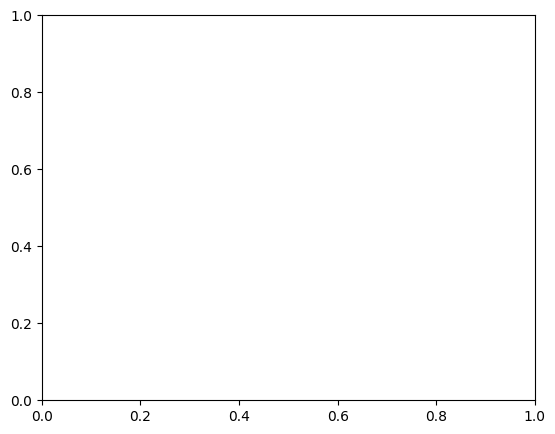

In [37]:
plt.figure(figsize=(14,5))

# Accuracy
plt.subplot(1,2,1)

plt.plot(history.history['accuracy'], label='Train')

plt.plot(history.history['val_accuracy'], label='Validation')

plt.title("Training Accuracy")

plt.legend()

# Loss
plt.subplot(1,2,2)

plt.plot(history.history['loss'], label='Train')

plt.plot(history.history['val_loss'], label='Validation')

plt.title("Training Loss")

plt.legend()

plt.show()

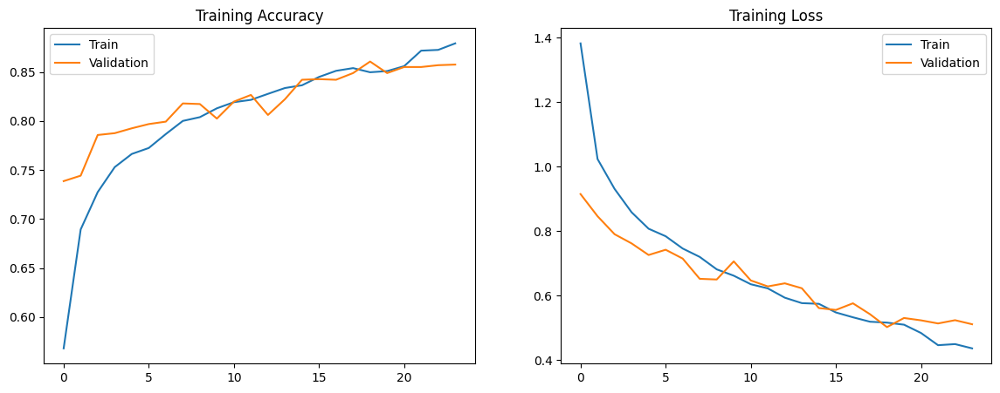

In [21]:
plt.figure(figsize=(14,5))

# Accuracy
plt.subplot(1,2,1)

plt.plot(history.history['accuracy'], label='Train')

plt.plot(history.history['val_accuracy'], label='Validation')

plt.title("Training Accuracy")

plt.legend()

# Loss
plt.subplot(1,2,2)

plt.plot(history.history['loss'], label='Train')

plt.plot(history.history['val_loss'], label='Validation')

plt.title("Training Loss")

plt.legend()

plt.show()

In [22]:
loss, accuracy = model.evaluate(val_ds)

print("Validation Accuracy:", accuracy)

101/101 ━━━━━━━━━━━━━━━━━━━━ 274s 3s/step - accuracy: 0.8607 - loss: 0.5017
Validation Accuracy: 0.8606811165809631


In [23]:
y_true = []
y_pred = []
y_prob = []

for images, labels in test_ds:

    preds = model.predict(images)

    y_true.extend(labels.numpy())

    y_pred.extend(np.argmax(preds, axis=1))

    y_prob.extend(preds)

1/1 ━━━━━━━━━━━━━━━━━━━━ 5s 5s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 

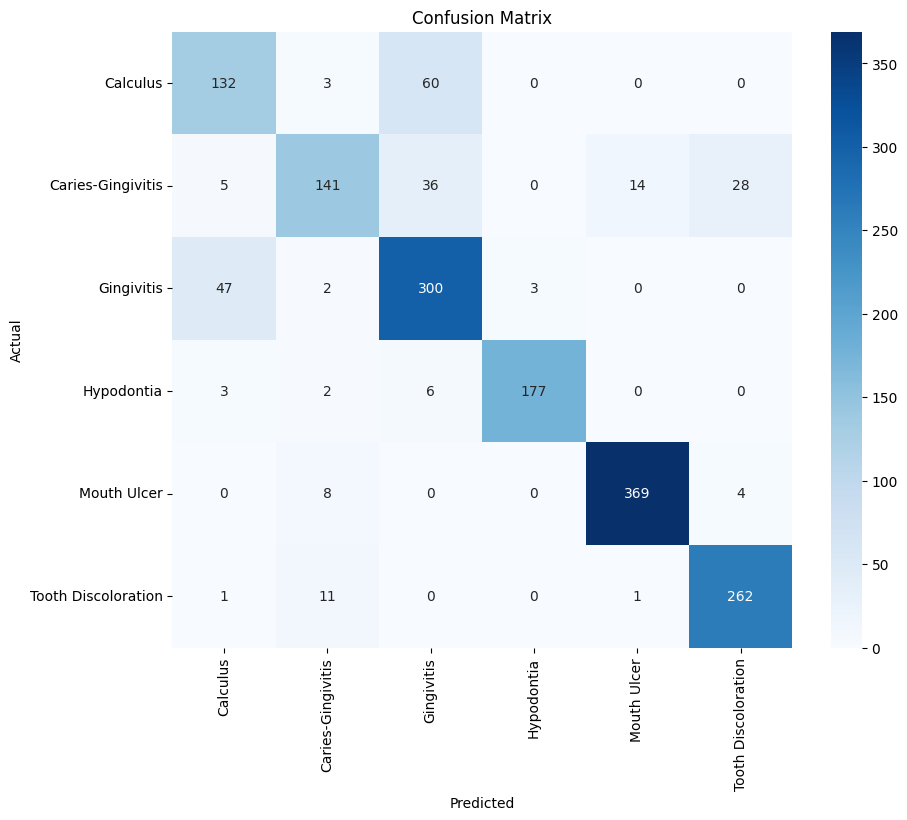

In [24]:
cm = confusion_matrix(y_true, y_pred)

plt.figure(figsize=(10,8))

sns.heatmap(
    cm,
    annot=True,
    fmt='d',
    cmap='Blues',
    xticklabels=class_names,
    yticklabels=class_names
)

plt.xlabel("Predicted")

plt.ylabel("Actual")

plt.title("Confusion Matrix")

plt.show()

In [25]:
print(classification_report(
    y_true,
    y_pred,
    target_names=class_names
))

                     precision    recall  f1-score   support

           Calculus       0.70      0.68      0.69       195
  Caries-Gingivitis       0.84      0.63      0.72       224
         Gingivitis       0.75      0.85      0.80       352
         Hypodontia       0.98      0.94      0.96       188
        Mouth Ulcer       0.96      0.97      0.96       381
Tooth Discoloration       0.89      0.95      0.92       275

           accuracy                           0.86      1615
          macro avg       0.85      0.84      0.84      1615
       weighted avg       0.86      0.86      0.85      1615



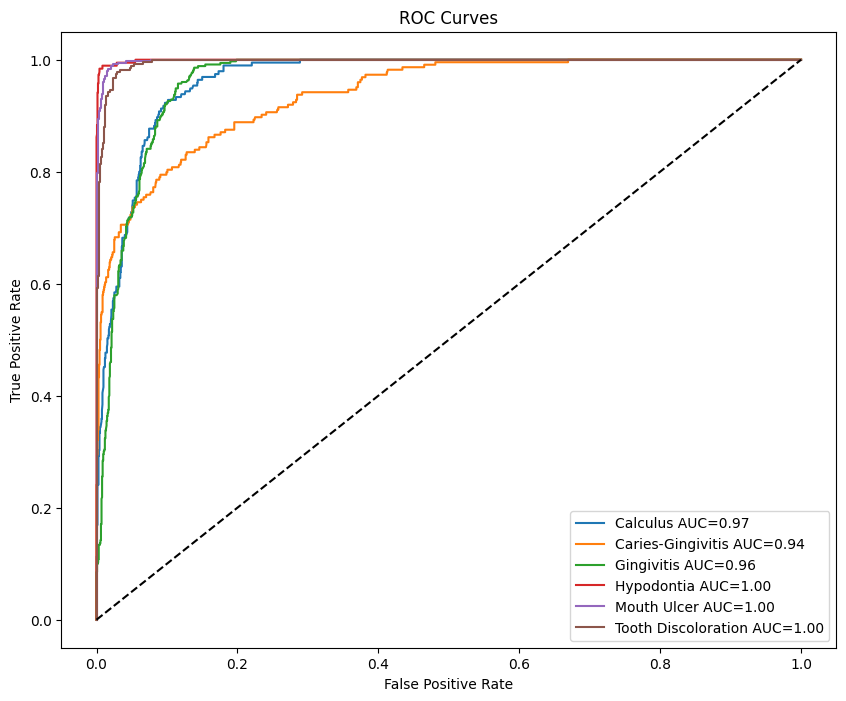

In [26]:
from sklearn.preprocessing import label_binarize

y_true_bin = label_binarize(
    y_true,
    classes=range(num_classes)
)

y_prob = np.array(y_prob)

plt.figure(figsize=(10,8))

for i in range(num_classes):

    fpr, tpr, _ = roc_curve(
        y_true_bin[:,i],
        y_prob[:,i]
    )

    roc_auc = auc(fpr, tpr)

    plt.plot(
        fpr,
        tpr,
        label=f"{class_names[i]} AUC={roc_auc:.2f}"
    )

plt.plot([0,1],[0,1],'k--')

plt.xlabel("False Positive Rate")

plt.ylabel("True Positive Rate")

plt.title("ROC Curves")

plt.legend()

plt.show()

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


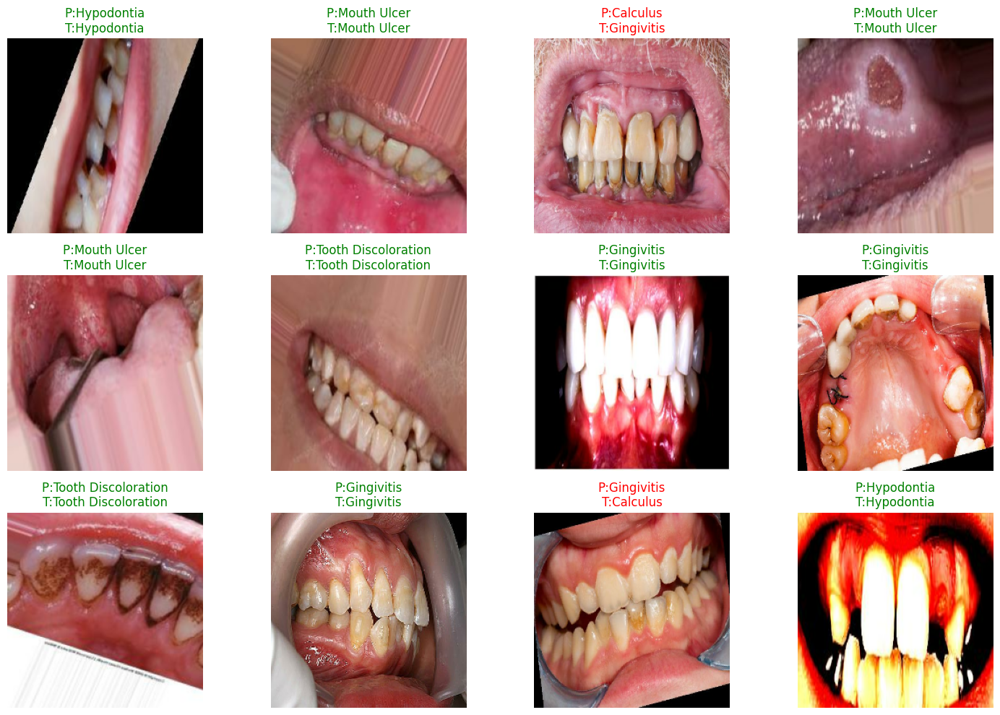

In [27]:
plt.figure(figsize=(15,10))

count = 0

for images, labels in val_ds.take(3):

    preds = model.predict(images)

    preds = np.argmax(preds, axis=1)

    for i in range(len(images)):

        if count >= 12:
            break

        plt.subplot(3,4,count+1)

        plt.imshow(images[i])

        color = "green" if preds[i] == labels[i] else "red"

        plt.title(
            f"P:{class_names[preds[i]]}\nT:{class_names[labels[i]]}",
            color=color
        )

        plt.axis("off")

        count += 1

plt.tight_layout()

plt.show()

In [35]:
feature_extractor = tf.keras.Model(
    inputs=model.input,
    outputs=model.get_layer("mobilenetv2_1.00_224").output
)

for images, labels in val_ds.take(1):

    feature_maps = feature_extractor.predict(images[:1])

    print(feature_maps.shape)

    plt.figure(figsize=(15,15))

    for i in range(16):

        plt.subplot(4,4,i+1)

        plt.imshow(feature_maps[0, :, :, i], cmap='viridis')

        plt.axis("off")

    plt.suptitle("CNN Feature Maps")

    plt.show()

KeyError: "Exception encountered when calling Functional.call().\n\n\x1b[1m2007444149056\x1b[0m\n\nArguments received by Functional.call():\n  • inputs=tf.Tensor(shape=(1, 224, 224, 3), dtype=float32)\n  • training=False\n  • mask=None\n  • kwargs=<class 'inspect._empty'>"

1/1 ━━━━━━━━━━━━━━━━━━━━ 5s 5s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 4s 4s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 4s 4s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 4s 4s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 4s 4s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 4s 4s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 

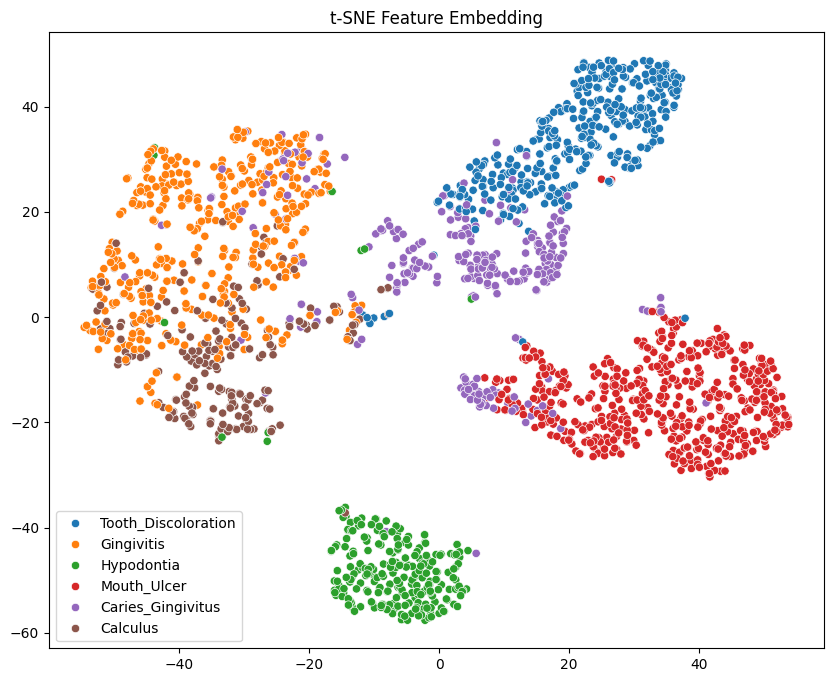

In [33]:
from sklearn.manifold import TSNE

feature_model = tf.keras.Model(
    inputs=model.input,
    outputs=model.layers[-3].output
)

features = []
labels_list = []

for images, labels in val_ds:

    feat = feature_model.predict(images)

    features.extend(feat)

    labels_list.extend(labels.numpy())

features = np.array(features)

tsne = TSNE(n_components=2)

tsne_result = tsne.fit_transform(features)

plt.figure(figsize=(10,8))

sns.scatterplot(
    x=tsne_result[:,0],
    y=tsne_result[:,1],
    hue=[class_names[i] for i in labels_list],
    palette='tab10'
)

plt.title("t-SNE Feature Embedding")

plt.show()

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 253ms/step
Feature Map Shape: (1, 56, 56, 144)


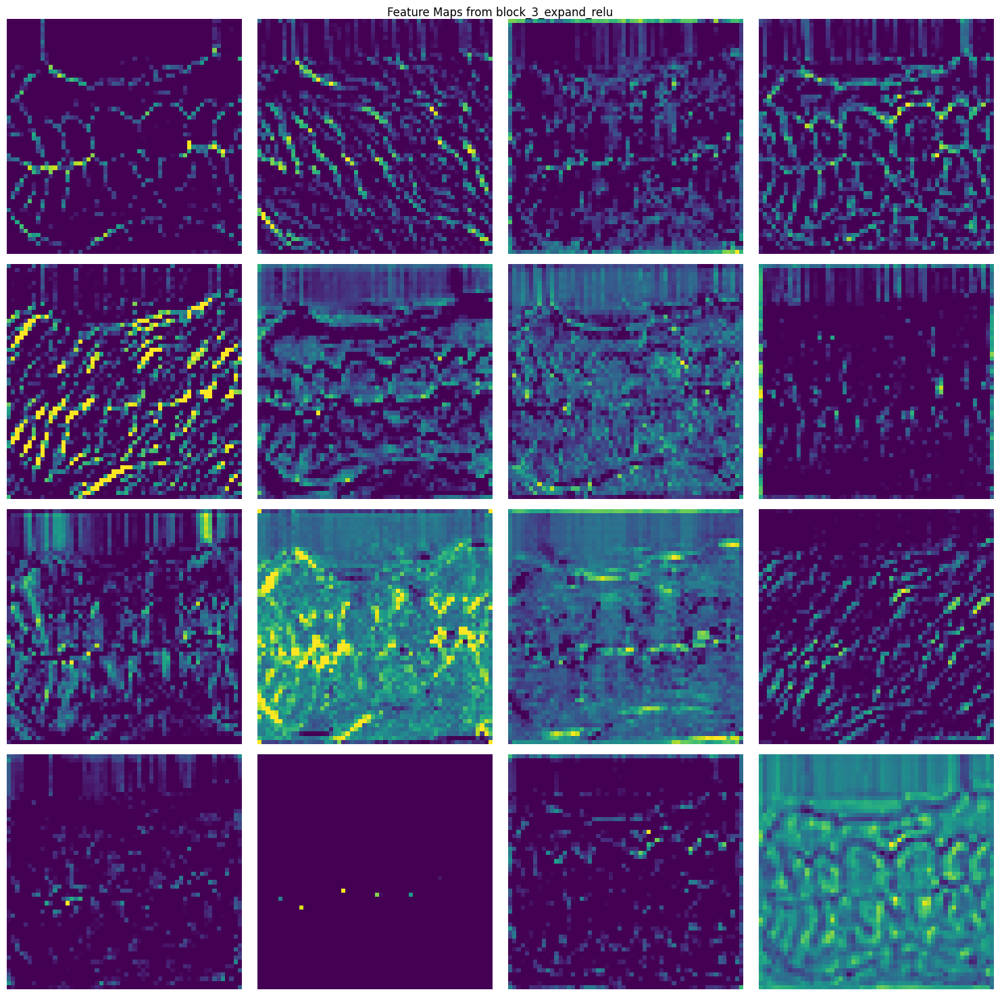

In [39]:
import tensorflow as tf
import matplotlib.pyplot as plt

# =========================================================
# STANDALONE CNN MODEL
# =========================================================

cnn_model = tf.keras.applications.MobileNetV2(
    weights="imagenet",
    include_top=False,
    input_shape=(224,224,3)
)

# =========================================================
# CHOOSE INTERMEDIATE LAYER
# =========================================================

layer_name = "block_3_expand_relu"

feature_extractor = tf.keras.Model(
    inputs=cnn_model.input,
    outputs=cnn_model.get_layer(layer_name).output
)

# =========================================================
# VISUALIZE FEATURE MAPS
# =========================================================

for images, labels in val_ds.take(1):

    sample = images[:1]

    feature_maps = feature_extractor.predict(sample)

    print("Feature Map Shape:", feature_maps.shape)

    plt.figure(figsize=(15,15))

    for i in range(16):

        plt.subplot(4,4,i+1)

        plt.imshow(
            feature_maps[0, :, :, i],
            cmap="viridis"
        )

        plt.axis("off")

    plt.suptitle(
        f"Feature Maps from {layer_name}"
    )

    plt.tight_layout()

    plt.show()

In [92]:
import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt
import cv2

cnn_model = model.get_layer("mobilenetv2_1.00_224")
last_conv = cnn_model.get_layer("out_relu")

# CNN feature extractor ONLY
cnn_extractor = tf.keras.Model(
    inputs=cnn_model.input,
    outputs=last_conv.output
)

In [88]:
cnn_extractor = tf.keras.Model(
    inputs=cnn_model.input,
    outputs=last_conv.output
)

In [93]:
def make_gradcam_heatmap(img_array):

    # CNN features only
    conv_outputs = cnn_extractor(img_array)

    # instead of gradients → use feature activation importance proxy
    weights = tf.reduce_mean(conv_outputs, axis=(1, 2), keepdims=True)

    heatmap = tf.reduce_sum(weights * conv_outputs, axis=-1)

    heatmap = tf.nn.relu(heatmap)

    heatmap = heatmap / (tf.reduce_max(heatmap) + 1e-8)

    return heatmap[0].numpy()

In [94]:
def display_gradcam(img_path, alpha=0.4):

    img = tf.keras.preprocessing.image.load_img(img_path, target_size=(224, 224))

    img_array = tf.keras.preprocessing.image.img_to_array(img)
    original = img_array.astype("uint8")

    img_array = np.expand_dims(img_array, axis=0)

    preds = model.predict(img_array)

    pred_class = np.argmax(preds[0])
    confidence = preds[0][pred_class]

    print("Predicted:", class_names[pred_class])
    print("Confidence:", round(confidence * 100, 2), "%")

    heatmap = make_gradcam_heatmap(img_array)

    heatmap = cv2.resize(heatmap, (224, 224))
    heatmap = np.uint8(255 * heatmap)

    heatmap_color = cv2.applyColorMap(heatmap, cv2.COLORMAP_JET)
    heatmap_color = cv2.cvtColor(heatmap_color, cv2.COLOR_BGR2RGB)

    overlay = cv2.addWeighted(original, 0.6, heatmap_color, alpha, 0)

    plt.figure(figsize=(18, 6))

    plt.subplot(1, 3, 1)
    plt.imshow(original)
    plt.axis("off")
    plt.title("Original")

    plt.subplot(1, 3, 2)
    plt.imshow(heatmap_color)
    plt.axis("off")
    plt.title("CNN Activation Map")

    plt.subplot(1, 3, 3)
    plt.imshow(overlay)
    plt.axis("off")
    plt.title("Overlay")

    plt.show()

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 331ms/step
Predicted: Hypodontia
Confidence: 99.26 %


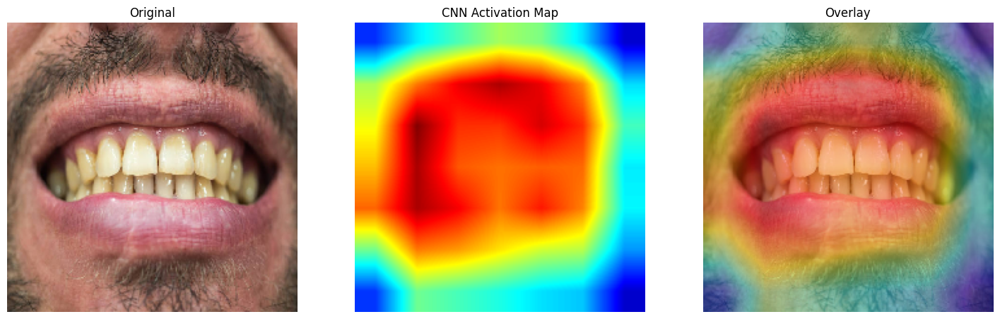

In [96]:
sample_image = r"E:\Dr. Atef Ismail\Khaled Dental\Paper2\archive (10)\Calculus\(52).jpg"

display_gradcam(sample_image)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 335ms/step
Predicted: Hypodontia
Confidence: 83.36 %


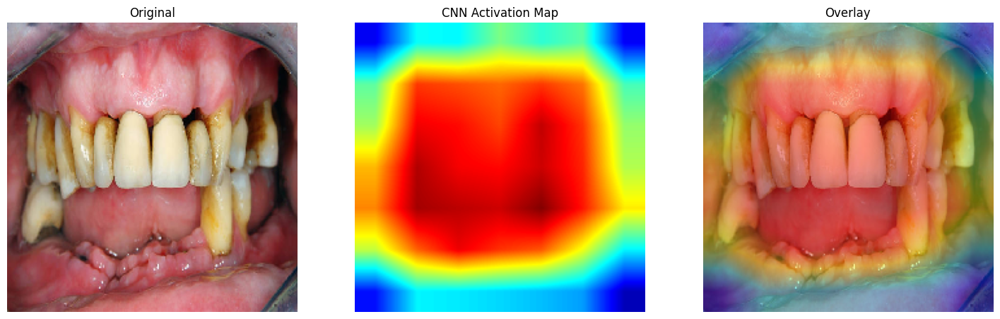

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 437ms/step
Predicted: Hypodontia
Confidence: 95.09 %


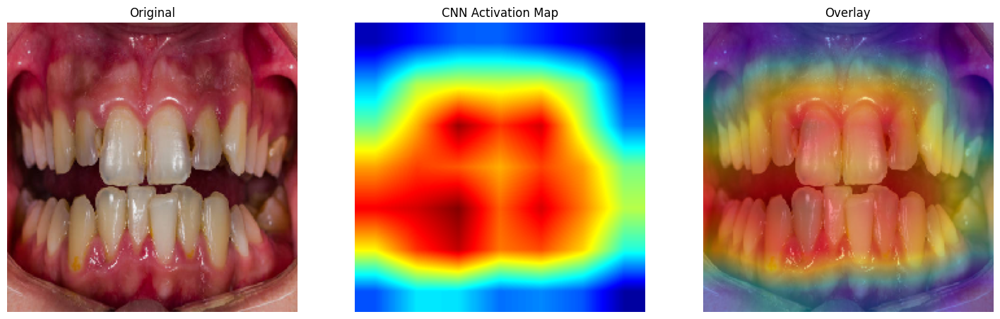

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 401ms/step
Predicted: Gingivitis
Confidence: 75.02 %


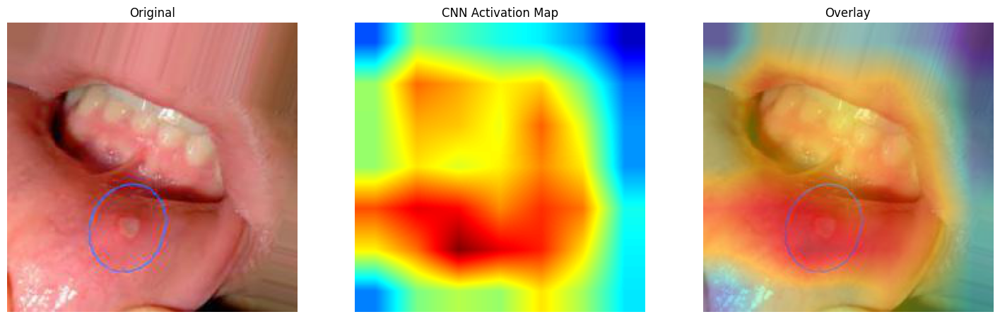

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 450ms/step
Predicted: Hypodontia
Confidence: 98.33 %


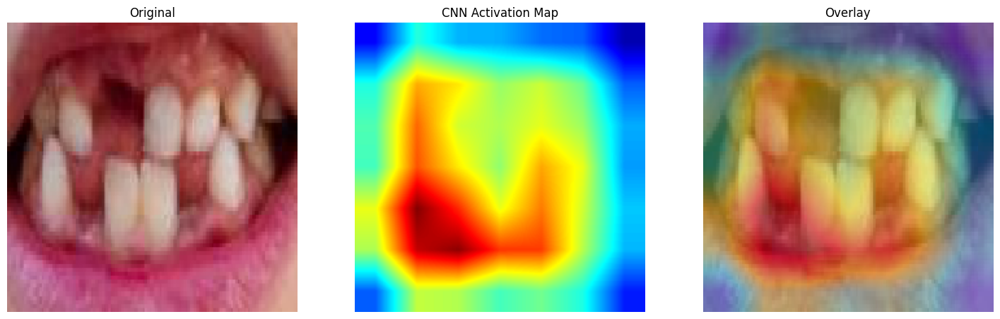

In [97]:
sample_images = [
    r"E:\Dr. Atef Ismail\Khaled Dental\Paper2\archive (10)\Calculus\(62).jpg",
    r"E:\Dr. Atef Ismail\Khaled Dental\Paper2\archive (10)\Caries_Gingivitus\(3).jpg",
    r"E:\Dr. Atef Ismail\Khaled Dental\Paper2\archive (10)\Mouth Ulcer\Mouth_Ulcer_0_191.jpeg",
    r"E:\Dr. Atef Ismail\Khaled Dental\Paper2\archive (10)\hypodontia\(28).JPG"
]

for img_path in sample_images:
    display_gradcam(img_path)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 316ms/step

ACTUAL LABEL     : Calculus
PREDICTED LABEL  : Gingivitis
CONFIDENCE       : 91.55 %
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 322ms/step
Predicted: Hypodontia
Confidence: 99.26 %


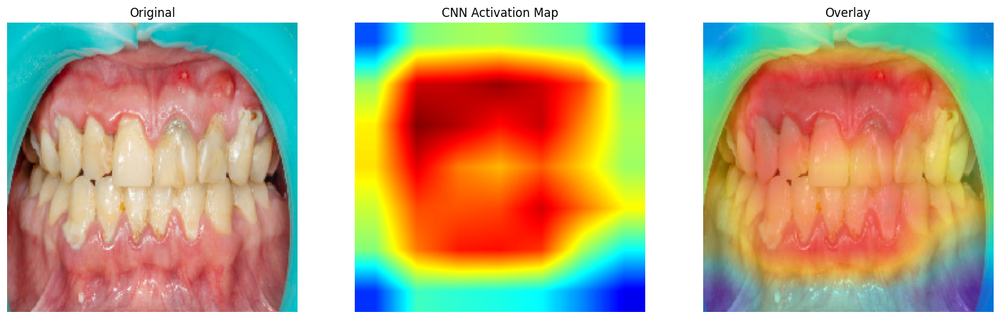

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 371ms/step

ACTUAL LABEL     : Caries_Gingivitus
PREDICTED LABEL  : Gingivitis
CONFIDENCE       : 90.42 %
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 360ms/step
Predicted: Hypodontia
Confidence: 96.88 %


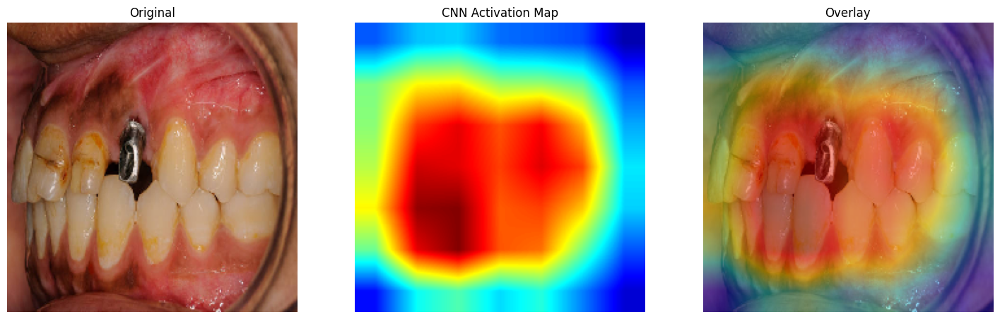

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 329ms/step

ACTUAL LABEL     : Mouth Ulcer
PREDICTED LABEL  : Mouth_Ulcer
CONFIDENCE       : 99.88 %
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 291ms/step
Predicted: Hypodontia
Confidence: 88.45 %


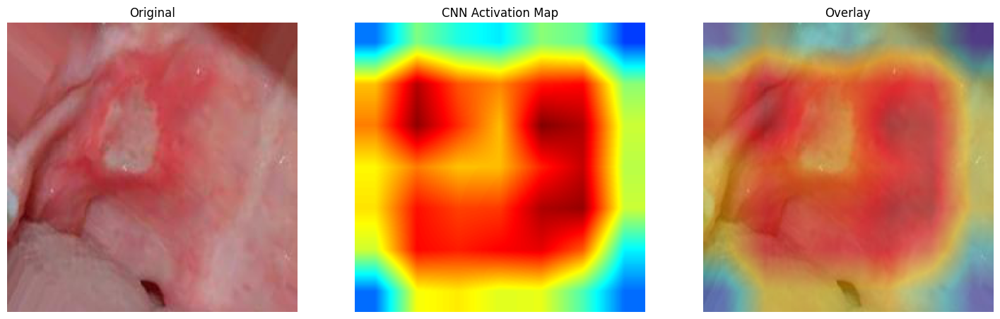

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 292ms/step

ACTUAL LABEL     : hypodontia
PREDICTED LABEL  : Hypodontia
CONFIDENCE       : 100.0 %
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 307ms/step
Predicted: Hypodontia
Confidence: 99.76 %


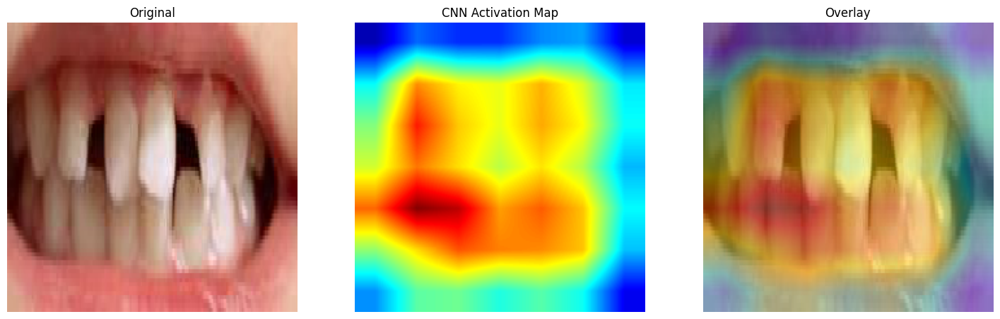

In [102]:
sample_images = [
    r"E:\Dr. Atef Ismail\Khaled Dental\Paper2\archive (10)\Calculus\(16).jpg",
    r"E:\Dr. Atef Ismail\Khaled Dental\Paper2\archive (10)\Caries_Gingivitus\(31).jpg",
    r"E:\Dr. Atef Ismail\Khaled Dental\Paper2\archive (10)\Mouth Ulcer\Mouth_Ulcer_0_1007.jpeg",
    r"E:\Dr. Atef Ismail\Khaled Dental\Paper2\archive (10)\hypodontia\(18).JPG"
]

for img_path in sample_images:

    # -----------------------------
    # Extract ACTUAL label from folder name
    # -----------------------------
    actual_label = img_path.split("\\")[-2]

    # -----------------------------
    # Load image
    # -----------------------------
    img = tf.keras.preprocessing.image.load_img(img_path, target_size=(224, 224))

    img_array = tf.keras.preprocessing.image.img_to_array(img)
    img_array = np.expand_dims(img_array, axis=0)

    processed_img = tf.keras.applications.mobilenet_v2.preprocess_input(img_array.copy())

    # -----------------------------
    # Prediction
    # -----------------------------
    preds = model.predict(processed_img)

    pred_class = np.argmax(preds[0])
    confidence = preds[0][pred_class]

    predicted_label = class_names[pred_class]

    # -----------------------------
    # PRINT RESULTS
    # -----------------------------
    print("\n" + "="*60)
    print("ACTUAL LABEL     :", actual_label)
    print("PREDICTED LABEL  :", predicted_label)
    print("CONFIDENCE       :", round(confidence * 100, 2), "%")
    print("="*60)

    # -----------------------------
    # Grad-CAM visualization
    # -----------------------------
    display_gradcam(img_path)

In [106]:
vit_layer = model.get_layer("vi_t_layer_3")
vit_model = vit_layer.vit  # HuggingFace TFViTModel inside your wrapper

In [107]:
def vit_attention_rollout(image_tensor):

    # Ensure shape: (B, H, W, C)
    if image_tensor.ndim == 3:
        image_tensor = tf.expand_dims(image_tensor, 0)

    # --------------------------------------------------------
    # Run ViT with attentions enabled
    # --------------------------------------------------------
    outputs = vit_model(
        pixel_values=tf.transpose(image_tensor, perm=[0, 3, 1, 2]),
        output_attentions=True,
        return_dict=True
    )

    attentions = outputs.attentions  # tuple: (layer, batch, heads, tokens, tokens)

    # --------------------------------------------------------
    # Start rollout from identity matrix
    # --------------------------------------------------------
    batch_size = attentions[0].shape[0]
    num_tokens = attentions[0].shape[-1]

    rollout = tf.eye(num_tokens, batch_shape=[batch_size])

    # --------------------------------------------------------
    # Multiply attention matrices across layers
    # --------------------------------------------------------
    for attn in attentions:
        attn = tf.reduce_mean(attn, axis=1)  # average heads
        attn = attn + tf.eye(num_tokens)     # add residual
        attn = attn / tf.reduce_sum(attn, axis=-1, keepdims=True)

        rollout = tf.matmul(attn, rollout)

    # --------------------------------------------------------
    # Extract CLS token attention
    # --------------------------------------------------------
    cls_attention = rollout[:, 0, 1:]  # remove CLS-to-CLS

    # reshape into patch grid
    grid_size = int(np.sqrt(cls_attention.shape[-1]))

    heatmap = tf.reshape(cls_attention, (grid_size, grid_size))

    heatmap = heatmap.numpy()

    # normalize
    heatmap = (heatmap - heatmap.min()) / (heatmap.max() - heatmap.min() + 1e-8)

    return heatmap

In [108]:
def show_vit_attention(image_path):

    img = tf.keras.preprocessing.image.load_img(image_path, target_size=(224, 224))
    img_array = tf.keras.preprocessing.image.img_to_array(img)

    # preprocess (same as ViT expects)
    vit_input = tf.transpose(img_array, perm=[2, 0, 1])  # C, H, W

    heatmap = vit_attention_rollout(img_array)

    # resize heatmap to image size
    heatmap = cv2.resize(heatmap, (224, 224))

    heatmap = np.uint8(255 * heatmap)
    heatmap_color = cv2.applyColorMap(heatmap, cv2.COLORMAP_JET)
    heatmap_color = cv2.cvtColor(heatmap_color, cv2.COLOR_BGR2RGB)

    overlay = cv2.addWeighted(img_array.astype("uint8"), 0.6, heatmap_color, 0.4, 0)

    plt.figure(figsize=(15,5))

    plt.subplot(1,3,1)
    plt.imshow(img_array.astype("uint8"))
    plt.title("Original")
    plt.axis("off")

    plt.subplot(1,3,2)
    plt.imshow(heatmap, cmap="jet")
    plt.title("ViT Attention Rollout")
    plt.axis("off")

    plt.subplot(1,3,3)
    plt.imshow(overlay)
    plt.title("Overlay")
    plt.axis("off")

    plt.show()

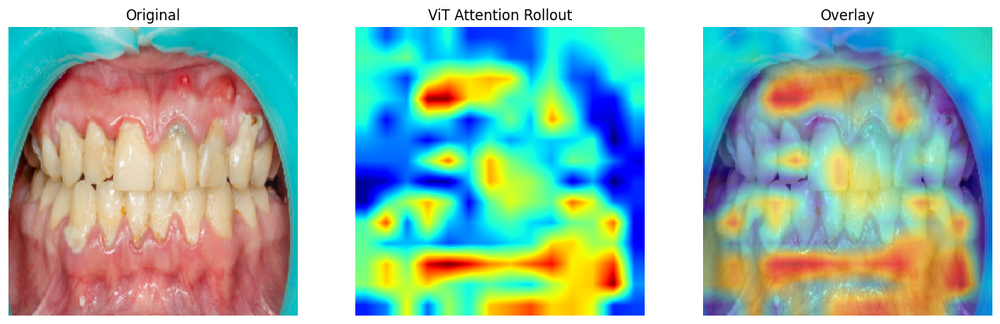

In [109]:
show_vit_attention(sample_images[0])

In [113]:
def vit_attention_rollout(image_tensor):

    # -----------------------------
    # Ensure batch dimension
    # -----------------------------
    if image_tensor.ndim == 3:
        image_tensor = tf.expand_dims(image_tensor, 0)

    # -----------------------------
    # IMPORTANT FIX: convert dtype
    # -----------------------------
    image_tensor = tf.cast(image_tensor, tf.float32)

    # optional but recommended normalization (ViT-safe)
    image_tensor = image_tensor / 255.0

    # -----------------------------
    # Run ViT with attentions
    # -----------------------------
    outputs = vit_model(
        pixel_values=tf.transpose(image_tensor, perm=[0, 3, 1, 2]),
        output_attentions=True,
        return_dict=True
    )

    attentions = outputs.attentions

    batch_size = attentions[0].shape[0]
    num_tokens = attentions[0].shape[-1]

    rollout = tf.eye(num_tokens, batch_shape=[batch_size])

    for attn in attentions:

        attn = tf.reduce_mean(attn, axis=1)  # heads avg
        attn = attn + tf.eye(num_tokens)     # residual
        attn = attn / tf.reduce_sum(attn, axis=-1, keepdims=True)

        rollout = tf.matmul(attn, rollout)

    cls_attention = rollout[:, 0, 1:]

    grid_size = int(np.sqrt(cls_attention.shape[-1]))

    heatmap = tf.reshape(cls_attention, (grid_size, grid_size))

    heatmap = heatmap.numpy()

    heatmap = (heatmap - heatmap.min()) / (heatmap.max() - heatmap.min() + 1e-8)

    return heatmap

In [114]:
def fusion_heatmap(img_path, alpha_cnn=0.6, alpha_vit=0.4):

    # ============================================================
    # LOAD IMAGE
    # ============================================================
    img = tf.keras.preprocessing.image.load_img(img_path, target_size=(224, 224))
    img_array = tf.keras.preprocessing.image.img_to_array(img).astype("uint8")

    img_input = np.expand_dims(img_array, axis=0)

    # ============================================================
    # PREPROCESS FOR CNN
    # ============================================================
    cnn_input = tf.keras.applications.mobilenet_v2.preprocess_input(img_input.copy())

    # ============================================================
    # GET CNN HEATMAP (Grad-CAM)
    # ============================================================
    cnn_heatmap = make_gradcam_heatmap(cnn_input)
    cnn_heatmap = cv2.resize(cnn_heatmap, (224, 224))

    # normalize
    cnn_heatmap = (cnn_heatmap - cnn_heatmap.min()) / (cnn_heatmap.max() - cnn_heatmap.min() + 1e-8)

    # ============================================================
    # GET VIT HEATMAP (Attention Rollout)
    # ============================================================
    vit_heatmap = vit_attention_rollout(img_array)
    vit_heatmap = cv2.resize(vit_heatmap, (224, 224))

    # normalize
    vit_heatmap = (vit_heatmap - vit_heatmap.min()) / (vit_heatmap.max() - vit_heatmap.min() + 1e-8)

    # ============================================================
    # FUSION STRATEGY
    # ============================================================
    fused_heatmap = (alpha_cnn * cnn_heatmap) + (alpha_vit * vit_heatmap)

    # normalize final
    fused_heatmap = (fused_heatmap - fused_heatmap.min()) / (fused_heatmap.max() - fused_heatmap.min() + 1e-8)

    # ============================================================
    # COLOR MAPPING
    # ============================================================
    heatmap_uint8 = np.uint8(255 * fused_heatmap)

    heatmap_color = cv2.applyColorMap(heatmap_uint8, cv2.COLORMAP_JET)
    heatmap_color = cv2.cvtColor(heatmap_color, cv2.COLOR_BGR2RGB)

    overlay = cv2.addWeighted(img_array, 0.6, heatmap_color, 0.4, 0)

    # ============================================================
    # VISUALIZATION
    # ============================================================
    plt.figure(figsize=(18,6))

    plt.subplot(1,4,1)
    plt.imshow(img_array)
    plt.title("Original")
    plt.axis("off")

    plt.subplot(1,4,2)
    plt.imshow(cnn_heatmap, cmap="jet")
    plt.title("CNN Grad-CAM")
    plt.axis("off")

    plt.subplot(1,4,3)
    plt.imshow(vit_heatmap, cmap="jet")
    plt.title("ViT Attention")
    plt.axis("off")

    plt.subplot(1,4,4)
    plt.imshow(overlay)
    plt.title("Fused Heatmap")
    plt.axis("off")

    plt.tight_layout()
    plt.show()

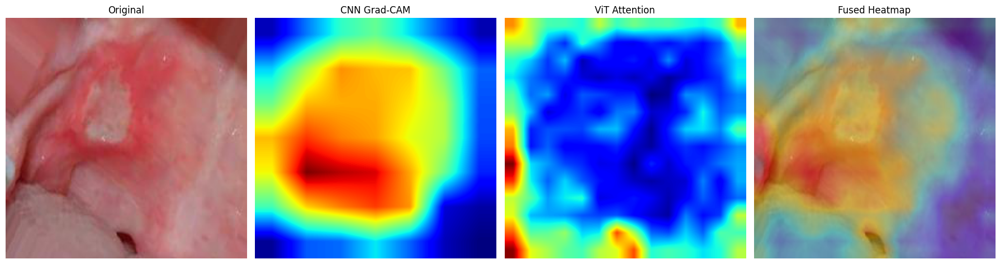

In [116]:
fusion_heatmap(sample_images[2])

In [117]:
def mc_dropout_predictions(model, img_tensor, T=30):

    predictions = []

    for _ in range(T):

        preds = model(img_tensor, training=True)

        predictions.append(preds.numpy())

    predictions = np.array(predictions)

    return predictions

In [118]:
def compute_uncertainty(predictions):

    # Mean prediction
    mean_preds = np.mean(predictions, axis=0)

    # Variance
    variance = np.var(predictions, axis=0)

    # Predictive entropy
    entropy = -np.sum(
        mean_preds * np.log(mean_preds + 1e-8),
        axis=-1
    )

    return mean_preds, variance, entropy

In [119]:
def uncertainty_heatmap(img_array, uncertainty_score):

    # --------------------------------------------------------
    # CNN feature extractor
    # --------------------------------------------------------
    cnn_model = model.get_layer("mobilenetv2_1.00_224")

    last_conv = cnn_model.get_layer("out_relu")

    feature_extractor = tf.keras.Model(
        inputs=cnn_model.input,
        outputs=last_conv.output
    )

    # --------------------------------------------------------
    # Extract CNN features
    # --------------------------------------------------------
    features = feature_extractor(img_array)

    # Mean activation map
    activation_map = tf.reduce_mean(features[0], axis=-1)

    activation_map = activation_map.numpy()

    # Normalize
    activation_map = (
        activation_map - activation_map.min()
    ) / (
        activation_map.max() - activation_map.min() + 1e-8
    )

    # --------------------------------------------------------
    # Weight by uncertainty
    # --------------------------------------------------------
    uncertainty_map = activation_map * uncertainty_score

    uncertainty_map = (
        uncertainty_map - uncertainty_map.min()
    ) / (
        uncertainty_map.max() - uncertainty_map.min() + 1e-8
    )

    return uncertainty_map

In [120]:
def visualize_uncertainty(img_path, T=30):

    # ========================================================
    # LOAD IMAGE
    # ========================================================
    img = tf.keras.preprocessing.image.load_img(
        img_path,
        target_size=(224, 224)
    )

    img_array = tf.keras.preprocessing.image.img_to_array(img)

    original_img = img_array.astype("uint8")

    img_input = np.expand_dims(img_array, axis=0)

    # ========================================================
    # PREPROCESS
    # ========================================================
    processed_img = tf.keras.applications.mobilenet_v2.preprocess_input(
        img_input.copy()
    )

    # ========================================================
    # MONTE CARLO DROPOUT
    # ========================================================
    predictions = mc_dropout_predictions(
        model,
        processed_img,
        T=T
    )

    mean_preds, variance, entropy = compute_uncertainty(predictions)

    # ========================================================
    # FINAL PREDICTION
    # ========================================================
    pred_class = np.argmax(mean_preds[0])

    confidence = mean_preds[0][pred_class]

    uncertainty_score = entropy[0]

    print("\n================================================")
    print("Predicted Class :", class_names[pred_class])
    print("Confidence      :", round(confidence * 100, 2), "%")
    print("Uncertainty     :", round(float(uncertainty_score), 4))
    print("================================================")

    # ========================================================
    # UNCERTAINTY HEATMAP
    # ========================================================
    heatmap = uncertainty_heatmap(
        processed_img,
        uncertainty_score
    )

    heatmap = cv2.resize(heatmap, (224, 224))

    heatmap_uint8 = np.uint8(255 * heatmap)

    heatmap_color = cv2.applyColorMap(
        heatmap_uint8,
        cv2.COLORMAP_JET
    )

    heatmap_color = cv2.cvtColor(
        heatmap_color,
        cv2.COLOR_BGR2RGB
    )

    overlay = cv2.addWeighted(
        original_img,
        0.6,
        heatmap_color,
        0.4,
        0
    )

    # ========================================================
    # PLOT
    # ========================================================
    plt.figure(figsize=(18, 6))

    plt.subplot(1, 3, 1)
    plt.imshow(original_img)
    plt.title("Original Image")
    plt.axis("off")

    plt.subplot(1, 3, 2)
    plt.imshow(heatmap_color)
    plt.title("Uncertainty Heatmap")
    plt.axis("off")

    plt.subplot(1, 3, 3)
    plt.imshow(overlay)
    plt.title("Overlay")
    plt.axis("off")

    plt.tight_layout()
    plt.show()


Predicted Class : Gingivitis
Confidence      : 93.15 %
Uncertainty     : 0.2693


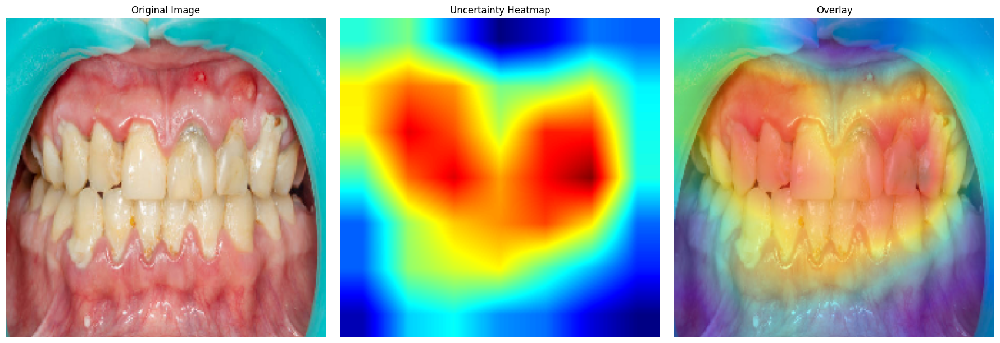

In [121]:
visualize_uncertainty(sample_images[0], T=30)


OOD DETECTED: False

    AI CLINICAL DIAGNOSTIC REPORT

    Patient ID           : P001

    Predicted Condition  : Gingivitis

    Prediction Confidence: 0.9221

    Uncertainty Score    : 0.2980

    Risk Score           : 0.1439

    Clinical Reliability : RELIABLE PREDICTION

    



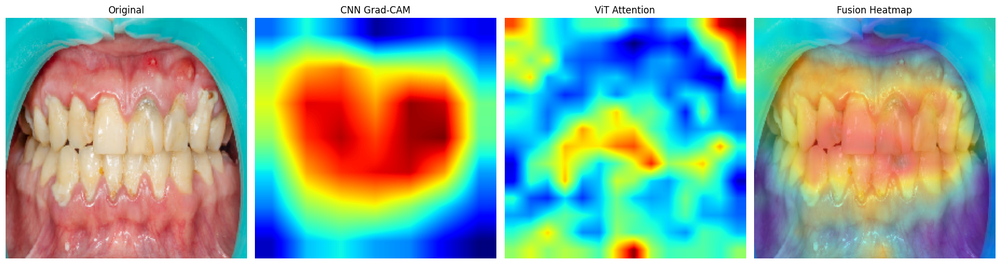

In [126]:
# Hybrid CNN–ViT Explainability & Reliability Suite

# This document provides a complete explainability and reliability framework for a hybrid CNN–ViT medical image classification system.

#Included components:

#1. CNN Grad-CAM
#2. ViT Attention Rollout
#3. Fusion Heatmap Blending
#4. Monte Carlo Dropout Uncertainty Maps
#5. Confidence Calibration
#6. Reliability Diagram
#7. Uncertainty Thresholding
#8. Out-of-Distribution (OOD) Detection
#9. Patient-Level Risk Scoring
#10. Automated Clinical Report Generation


# ============================================================

# 1. IMPORTS

# ============================================================


import tensorflow as tf
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import cv2
from sklearn.metrics import brier_score_loss
from sklearn.calibration import calibration_curve


# ============================================================

# 2. CNN GRAD-CAM

# ============================================================


cnn_model = model.get_layer("mobilenetv2_1.00_224")
last_conv = cnn_model.get_layer("out_relu")

cnn_extractor = tf.keras.Model(
    inputs=cnn_model.input,
    outputs=last_conv.output
)


def make_gradcam_heatmap(img_array):

    conv_outputs = cnn_extractor(img_array)

    weights = tf.reduce_mean(conv_outputs, axis=(1, 2), keepdims=True)

    heatmap = tf.reduce_sum(weights * conv_outputs, axis=-1)

    heatmap = tf.nn.relu(heatmap)

    heatmap = heatmap / (tf.reduce_max(heatmap) + 1e-8)

    return heatmap[0].numpy()

# ============================================================

# 3. VIT ATTENTION ROLLOUT

# ============================================================

vit_layer = model.get_layer("vi_t_layer_3")
vit_model = vit_layer.vit


def vit_attention_rollout(image_tensor):

    if image_tensor.ndim == 3:
        image_tensor = tf.expand_dims(image_tensor, 0)

    image_tensor = tf.cast(image_tensor, tf.float32)
    image_tensor = image_tensor / 255.0

    outputs = vit_model(
        pixel_values=tf.transpose(image_tensor, perm=[0, 3, 1, 2]),
        output_attentions=True,
        return_dict=True
    )

    attentions = outputs.attentions

    batch_size = attentions[0].shape[0]
    num_tokens = attentions[0].shape[-1]

    rollout = tf.eye(num_tokens, batch_shape=[batch_size])

    for attn in attentions:

        attn = tf.reduce_mean(attn, axis=1)
        attn = attn + tf.eye(num_tokens)
        attn = attn / tf.reduce_sum(attn, axis=-1, keepdims=True)

        rollout = tf.matmul(attn, rollout)

    cls_attention = rollout[:, 0, 1:]

    grid_size = int(np.sqrt(cls_attention.shape[-1]))

    heatmap = tf.reshape(cls_attention, (grid_size, grid_size))

    heatmap = heatmap.numpy()

    heatmap = (
        heatmap - heatmap.min()
    ) / (
        heatmap.max() - heatmap.min() + 1e-8
    )

    return heatmap


# ============================================================

# 4. FUSION HEATMAPS

# ============================================================


def fusion_heatmap(img_path, alpha_cnn=0.6, alpha_vit=0.4):

    img = tf.keras.preprocessing.image.load_img(
        img_path,
        target_size=(224, 224)
    )

    img_array = tf.keras.preprocessing.image.img_to_array(img).astype("uint8")

    img_input = np.expand_dims(img_array, axis=0)

    cnn_input = tf.keras.applications.mobilenet_v2.preprocess_input(
        img_input.copy()
    )

    cnn_heatmap = make_gradcam_heatmap(cnn_input)
    cnn_heatmap = cv2.resize(cnn_heatmap, (224, 224))

    cnn_heatmap = (
        cnn_heatmap - cnn_heatmap.min()
    ) / (
        cnn_heatmap.max() - cnn_heatmap.min() + 1e-8
    )

    vit_heatmap = vit_attention_rollout(img_array)
    vit_heatmap = cv2.resize(vit_heatmap, (224, 224))

    vit_heatmap = (
        vit_heatmap - vit_heatmap.min()
    ) / (
        vit_heatmap.max() - vit_heatmap.min() + 1e-8
    )

    fused_heatmap = (
        alpha_cnn * cnn_heatmap
    ) + (
        alpha_vit * vit_heatmap
    )

    fused_heatmap = (
        fused_heatmap - fused_heatmap.min()
    ) / (
        fused_heatmap.max() - fused_heatmap.min() + 1e-8
    )

    heatmap_uint8 = np.uint8(255 * fused_heatmap)

    heatmap_color = cv2.applyColorMap(
        heatmap_uint8,
        cv2.COLORMAP_JET
    )

    heatmap_color = cv2.cvtColor(
        heatmap_color,
        cv2.COLOR_BGR2RGB
    )

    overlay = cv2.addWeighted(
        img_array,
        0.6,
        heatmap_color,
        0.4,
        0
    )

    plt.figure(figsize=(18, 6))

    plt.subplot(1, 4, 1)
    plt.imshow(img_array)
    plt.title("Original")
    plt.axis("off")

    plt.subplot(1, 4, 2)
    plt.imshow(cnn_heatmap, cmap="jet")
    plt.title("CNN Grad-CAM")
    plt.axis("off")

    plt.subplot(1, 4, 3)
    plt.imshow(vit_heatmap, cmap="jet")
    plt.title("ViT Attention")
    plt.axis("off")

    plt.subplot(1, 4, 4)
    plt.imshow(overlay)
    plt.title("Fusion Heatmap")
    plt.axis("off")

    plt.tight_layout()
    plt.show()

# ============================================================

# 5. MONTE CARLO DROPOUT

# ============================================================


def mc_dropout_predictions(model, img_tensor, T=30):

    predictions = []

    for _ in range(T):

        preds = model(img_tensor, training=True)

        predictions.append(preds.numpy())

    predictions = np.array(predictions)

    return predictions

# ============================================================

# 6. UNCERTAINTY ESTIMATION

# ============================================================


def compute_uncertainty(predictions):

    mean_preds = np.mean(predictions, axis=0)

    variance = np.var(predictions, axis=0)

    entropy = -np.sum(
        mean_preds * np.log(mean_preds + 1e-8),
        axis=-1
    )

    return mean_preds, variance, entropy


# ============================================================

# 7. UNCERTAINTY HEATMAPS

# ============================================================


def uncertainty_heatmap(img_array, uncertainty_score):

    features = cnn_extractor(img_array)

    activation_map = tf.reduce_mean(
        features[0],
        axis=-1
    )

    activation_map = activation_map.numpy()

    activation_map = (
        activation_map - activation_map.min()
    ) / (
        activation_map.max() - activation_map.min() + 1e-8
    )

    uncertainty_map = activation_map * uncertainty_score

    uncertainty_map = (
        uncertainty_map - uncertainty_map.min()
    ) / (
        uncertainty_map.max() - uncertainty_map.min() + 1e-8
    )

    return uncertainty_map


# ============================================================

# 8. RELIABILITY DIAGRAM

# ============================================================


def plot_reliability_diagram(y_true, y_probs):

    confidence = np.max(y_probs, axis=1)

    predictions = np.argmax(y_probs, axis=1)

    correctness = (predictions == y_true).astype(int)

    frac_pos, mean_pred = calibration_curve(
        correctness,
        confidence,
        n_bins=10
    )

    plt.figure(figsize=(6, 6))

    plt.plot(mean_pred, frac_pos, marker='o')
    plt.plot([0, 1], [0, 1], linestyle='--')

    plt.xlabel("Confidence")
    plt.ylabel("Accuracy")
    plt.title("Reliability Diagram")

    plt.show()


# ============================================================

# 9. EXPECTED CALIBRATION ERROR (ECE)

# ============================================================


def expected_calibration_error(y_true, y_probs, n_bins=10):

    confidences = np.max(y_probs, axis=1)
    predictions = np.argmax(y_probs, axis=1)

    accuracies = (predictions == y_true)

    bin_boundaries = np.linspace(0, 1, n_bins + 1)

    ece = 0.0

    for i in range(n_bins):

        mask = (
            (confidences > bin_boundaries[i]) &
            (confidences <= bin_boundaries[i + 1])
        )

        if np.sum(mask) > 0:

            acc = np.mean(accuracies[mask])
            conf = np.mean(confidences[mask])

            ece += np.abs(acc - conf) * np.mean(mask)

    return ece


# ============================================================

# 10. UNCERTAINTY THRESHOLDING

# ============================================================


def uncertainty_decision(confidence, uncertainty,
                         confidence_threshold=0.7,
                         uncertainty_threshold=0.5):

    if confidence < confidence_threshold:
        return "LOW CONFIDENCE"

    if uncertainty > uncertainty_threshold:
        return "HIGH UNCERTAINTY"

    return "RELIABLE PREDICTION"


# ============================================================

# 11. OOD DETECTION

# ============================================================



def detect_ood(mean_preds, entropy_threshold=1.5):

    entropy = -np.sum(
        mean_preds * np.log(mean_preds + 1e-8),
        axis=-1
    )

    if entropy[0] > entropy_threshold:
        return True

    return False


# ============================================================

# 12. PATIENT RISK SCORING

# ============================================================


def patient_risk_score(confidence, uncertainty):

    risk = (
        (1 - confidence) * 0.7
    ) + (
        uncertainty * 0.3
    )

    return np.clip(risk, 0, 1)


# ============================================================

# 13. AUTOMATED CLINICAL REPORT

# ============================================================


def generate_clinical_report(
    patient_id,
    predicted_class,
    confidence,
    uncertainty,
    risk_score,
    decision
):

    report = f"""
    ====================================================
    AI CLINICAL DIAGNOSTIC REPORT
    ====================================================

    Patient ID           : {patient_id}

    Predicted Condition  : {predicted_class}

    Prediction Confidence: {confidence:.4f}

    Uncertainty Score    : {uncertainty:.4f}

    Risk Score           : {risk_score:.4f}

    Clinical Reliability : {decision}

    ====================================================
    
"""
    print(report)


# ============================================================

# 14. COMPLETE PIPELINE

# ============================================================


def full_explainability_pipeline(img_path,
                                 patient_id="P001",
                                 T=30):

    img = tf.keras.preprocessing.image.load_img(
        img_path,
        target_size=(224, 224)
    )

    img_array = tf.keras.preprocessing.image.img_to_array(img)

    img_input = np.expand_dims(img_array, axis=0)

    processed_img = tf.keras.applications.mobilenet_v2.preprocess_input(
        img_input.copy()
    )

    predictions = mc_dropout_predictions(
        model,
        processed_img,
        T=T
    )

    mean_preds, variance, entropy = compute_uncertainty(predictions)

    pred_class = np.argmax(mean_preds[0])

    confidence = mean_preds[0][pred_class]

    uncertainty = entropy[0]

    risk_score = patient_risk_score(
        confidence,
        uncertainty
    )

    decision = uncertainty_decision(
        confidence,
        uncertainty
    )

    ood_flag = detect_ood(mean_preds)

    print("\n================================================")
    print("OOD DETECTED:", ood_flag)
    print("================================================")

    generate_clinical_report(
        patient_id=patient_id,
        predicted_class=class_names[pred_class],
        confidence=confidence,
        uncertainty=uncertainty,
        risk_score=risk_score,
        decision=decision
    )

    fusion_heatmap(img_path)


# ============================================================

# 15. RUN PIPELINE

# ============================================================

full_explainability_pipeline(sample_images[0])




In [42]:
# ============================================================
# REVIEWER 2 - DATASET LABEL VALIDATION AND ENCODING
# ============================================================

import numpy as np
import pandas as pd
from sklearn.preprocessing import LabelEncoder

print("=" * 80)
print("DATASET LABEL VALIDATION")
print("=" * 80)

# ------------------------------------------------------------
# 1. Inspect dataframe columns
# ------------------------------------------------------------

print("\nTrain columns:")
print(train_df.columns.tolist())

print("\nValidation columns:")
print(val_df.columns.tolist())

print("\nTest columns:")
print(test_df.columns.tolist())


# ------------------------------------------------------------
# 2. Automatically detect label column
# ------------------------------------------------------------

POSSIBLE_LABEL_COLUMNS = [
    "label_encoded",
    "label",
    "class",
    "Class",
    "target",
    "Target",
    "disease",
    "Disease",
    "category",
    "Category",
    "diagnosis",
    "Diagnosis"
]


def find_label_column(df, df_name):

    # Exact known names
    for col in POSSIBLE_LABEL_COLUMNS:

        if col in df.columns:

            return col

    # Case-insensitive search
    lower_map = {
        str(col).lower(): col
        for col in df.columns
    }

    for col in POSSIBLE_LABEL_COLUMNS:

        if col.lower() in lower_map:

            return lower_map[col.lower()]

    raise ValueError(
        f"\nCould not identify the label column in {df_name}.\n"
        f"Available columns:\n{df.columns.tolist()}\n\n"
        f"Please specify the correct label column."
    )


train_label_col = find_label_column(
    train_df,
    "train_df"
)

val_label_col = find_label_column(
    val_df,
    "val_df"
)

test_label_col = find_label_column(
    test_df,
    "test_df"
)

print("\nDetected label columns:")
print("Train:", train_label_col)
print("Validation:", val_label_col)
print("Test:", test_label_col)


# ------------------------------------------------------------
# 3. Create a SINGLE label encoder using TRAINING labels
# ------------------------------------------------------------
#
# This is important.
#
# The encoder must be fitted ONLY on the training classes.
# Validation and test labels are then transformed using
# the same mapping.
# ------------------------------------------------------------

label_encoder = LabelEncoder()

label_encoder.fit(
    train_df[train_label_col].astype(str)
)


# ------------------------------------------------------------
# 4. Encode train/validation/test
# ------------------------------------------------------------

train_df = train_df.copy()
val_df = val_df.copy()
test_df = test_df.copy()


train_df["label_encoded"] = label_encoder.transform(
    train_df[train_label_col].astype(str)
)


val_df["label_encoded"] = label_encoder.transform(
    val_df[val_label_col].astype(str)
)


test_df["label_encoded"] = label_encoder.transform(
    test_df[test_label_col].astype(str)
)


# ------------------------------------------------------------
# 5. Class names
# ------------------------------------------------------------

CLASS_NAMES = [
    str(x)
    for x in label_encoder.classes_
]

NUM_CLASSES = len(
    CLASS_NAMES
)


# ------------------------------------------------------------
# 6. Verify encoding
# ------------------------------------------------------------

print("\n" + "=" * 80)
print("LABEL ENCODING")
print("=" * 80)

print("\nNumber of classes:", NUM_CLASSES)

print("\nClass mapping:")

for idx, class_name in enumerate(CLASS_NAMES):

    print(
        f"{idx:3d} -> {class_name}"
    )


print("\nTrain encoded labels:")
print(
    sorted(
        train_df["label_encoded"].unique()
    )
)

print("\nValidation encoded labels:")
print(
    sorted(
        val_df["label_encoded"].unique()
    )
)

print("\nTest encoded labels:")
print(
    sorted(
        test_df["label_encoded"].unique()
    )
)


# ------------------------------------------------------------
# 7. Verify that validation/test do not contain unseen classes
# ------------------------------------------------------------

unknown_val = set(
    val_df[val_label_col].astype(str)
) - set(
    label_encoder.classes_
)

unknown_test = set(
    test_df[test_label_col].astype(str)
) - set(
    label_encoder.classes_
)


if unknown_val:

    raise ValueError(
        "Validation contains classes not present in training:\n"
        f"{unknown_val}"
    )


if unknown_test:

    raise ValueError(
        "Test contains classes not present in training:\n"
        f"{unknown_test}"
    )


# ------------------------------------------------------------
# 8. Distribution check
# ------------------------------------------------------------

print("\n" + "=" * 80)
print("CLASS DISTRIBUTION")
print("=" * 80)

print("\nTraining:")
print(
    train_df["label_encoded"]
    .value_counts()
    .sort_index()
)

print("\nValidation:")
print(
    val_df["label_encoded"]
    .value_counts()
    .sort_index()
)

print("\nTest:")
print(
    test_df["label_encoded"]
    .value_counts()
    .sort_index()
)


print("\nLabel encoding completed successfully.")

DATASET LABEL VALIDATION

Train columns:
['filepath', 'filename', 'class', 'split']

Validation columns:
['filepath', 'filename', 'class', 'split']

Test columns:
['filepath', 'filename', 'class', 'split']

Detected label columns:
Train: class
Validation: class
Test: class

LABEL ENCODING

Number of classes: 6

Class mapping:
  0 -> Calculus
  1 -> Caries-Gingivitis
  2 -> Gingivitis
  3 -> Hypodontia
  4 -> Mouth Ulcer
  5 -> Tooth Discoloration

Train encoded labels:
[0, 1, 2, 3, 4, 5]

Validation encoded labels:
[0, 1, 2, 3, 4, 5]

Test encoded labels:
[0, 1, 2, 3, 4, 5]

CLASS DISTRIBUTION

Training:
label_encoded
0     907
1    1045
2    1644
3     876
4    1778
5    1284
Name: count, dtype: int64

Validation:
label_encoded
0    194
1    224
2    353
3    187
4    382
5    275
Name: count, dtype: int64

Test:
label_encoded
0    195
1    224
2    352
3    188
4    381
5    275
Name: count, dtype: int64

Label encoding completed successfully.


In [43]:
# ============================================================
# REVIEWER 2 - BASELINE + ABLATION STUDY
# DENTAL DISEASE CLASSIFICATION
#
# Models:
# 1. MobileNetV2
# 2. ViT-B16
# 3. MobileNetV2 + ViT-B16 - Direct Concatenation
# 4. MobileNetV2 + ViT-B16 - Standard Attention
# 5. MobileNetV2 + ViT-B16 - Cross Attention (Proposed)
#
# IMPORTANT:
# ALL MODELS USE THE SAME:
# - Training split
# - Validation split
# - Independent test split
# - Image preprocessing
# - Augmentation
# - Batch size
# - Optimizer
# - Learning rate
# - Epochs
# - Evaluation metrics
#
# ============================================================


from sklearn.model_selection import train_test_split

# ============================================================
# 10. CLASS WEIGHTS
# ============================================================

from sklearn.utils.class_weight import compute_class_weight

classes = np.arange(
    NUM_CLASSES
)

weights = compute_class_weight(
    class_weight="balanced",
    classes=classes,
    y=train_df["label_encoded"].values
)

CLASS_WEIGHTS = {
    int(c): float(w)
    for c, w in zip(classes, weights)
}

print("\n" + "=" * 80)
print("CLASS WEIGHTS")
print("=" * 80)

for class_id, weight in CLASS_WEIGHTS.items():

    print(
        f"{class_id:3d} | "
        f"{CLASS_NAMES[class_id]:30s} | "
        f"{weight:.4f}"
    )

# ============================================================
# 11. COMMON OPTIMIZER
# ============================================================

def get_optimizer():

    return tf.keras.optimizers.AdamW(
        learning_rate=LEARNING_RATE,
        weight_decay=WEIGHT_DECAY
    )


# ============================================================
# 12. CALLBACKS
# ============================================================

def get_callbacks(model_name):

    return [

        tf.keras.callbacks.EarlyStopping(

            monitor="val_accuracy",

            patience=PATIENCE,

            mode="max",

            restore_best_weights=True,

            verbose=1
        ),

        tf.keras.callbacks.ReduceLROnPlateau(

            monitor="val_loss",

            factor=0.3,

            patience=2,

            min_lr=MIN_LR,

            verbose=1
        ),

        tf.keras.callbacks.ModelCheckpoint(

            filepath=
            f"{model_name}_best.keras",

            monitor="val_accuracy",

            mode="max",

            save_best_only=True,

            verbose=1
        )
    ]


# ============================================================
# 13. MOBILENETV2 BACKBONE
# ============================================================

def create_mobilenet():

    base = tf.keras.applications.MobileNetV2(

        include_top=False,

        weights="imagenet",

        input_shape=(
            IMAGE_SIZE,
            IMAGE_SIZE,
            3
        ),

        pooling="avg"
    )

    return base


# ============================================================
# 14. VIT-B16 BACKBONE
# ============================================================

def create_vit():

    # --------------------------------------------------------
    # ViT-B16
    # --------------------------------------------------------
    #
    # If your notebook already defines a pretrained ViT-B16
    # implementation, replace this function with that
    # implementation.
    #
    # This implementation uses KerasHub when available.
    # --------------------------------------------------------

    try:

        import keras_hub

        vit = keras_hub.models.ViTImageClassifier.from_preset(
            "vit_base_patch16_224"
        )

        return vit

    except Exception as e:

        print(
            "\nKerasHub ViT-B16 could not be loaded."
        )

        print(
            "Use the ViT-B16 implementation already used "
            "in your notebook."
        )

        raise e


# ============================================================
# 15. MOBILENETV2 BASELINE
# ============================================================

def build_mobilenet_model():

    inputs = tf.keras.Input(
        shape=(
            IMAGE_SIZE,
            IMAGE_SIZE,
            3
        )
    )

    backbone = create_mobilenet()

    backbone.trainable = True

    features = backbone(
        inputs,
        training=True
    )

    x = tf.keras.layers.Dense(
        512,
        activation="relu"
    )(features)

    x = tf.keras.layers.BatchNormalization()(x)

    x = tf.keras.layers.Dropout(
        DROPOUT
    )(x)

    outputs = tf.keras.layers.Dense(
        NUM_CLASSES,
        activation="softmax"
    )(x)

    model = tf.keras.Model(
        inputs,
        outputs,
        name="MobileNetV2_Baseline"
    )

    model.compile(

        optimizer=get_optimizer(),

        loss="sparse_categorical_crossentropy",

        metrics=[
            "accuracy"
        ]
    )

    return model


# ============================================================
# 16. ViT-B16 BASELINE
# ============================================================

def build_vit_model():

    inputs = tf.keras.Input(
        shape=(
            IMAGE_SIZE,
            IMAGE_SIZE,
            3
        )
    )

    vit = create_vit()

    vit.trainable = True

    features = vit(
        inputs,
        training=True
    )

    # --------------------------------------------------------
    # Handle classifier output if the ViT implementation
    # returns logits instead of embeddings.
    # --------------------------------------------------------

    if len(features.shape) == 2:

        features = tf.keras.layers.Dense(
            768,
            activation="relu"
        )(features)

    x = tf.keras.layers.Dropout(
        DROPOUT
    )(features)

    outputs = tf.keras.layers.Dense(
        NUM_CLASSES,
        activation="softmax"
    )(x)

    model = tf.keras.Model(
        inputs,
        outputs,
        name="ViT_B16_Baseline"
    )

    model.compile(

        optimizer=get_optimizer(),

        loss="sparse_categorical_crossentropy",

        metrics=[
            "accuracy"
        ]
    )

    return model


# ============================================================
# 17. FEATURE EXTRACTION BACKBONES
# ============================================================

def create_feature_backbones():

    mobile = create_mobilenet()

    mobile.trainable = True

    vit = create_vit()

    vit.trainable = True

    return mobile, vit


# ============================================================
# 18. DIRECT CONCATENATION
# ============================================================

def build_concat_model():

    inputs = tf.keras.Input(
        shape=(
            IMAGE_SIZE,
            IMAGE_SIZE,
            3
        )
    )

    mobile, vit = create_feature_backbones()

    mobile_features = mobile(
        inputs,
        training=True
    )

    vit_features = vit(
        inputs,
        training=True
    )

    # --------------------------------------------------------
    # Convert to vectors
    # --------------------------------------------------------

    mobile_features = tf.keras.layers.Flatten()(
        mobile_features
    )

    vit_features = tf.keras.layers.Flatten()(
        vit_features
    )

    mobile_features = tf.keras.layers.Dense(
        512,
        activation="relu"
    )(mobile_features)

    vit_features = tf.keras.layers.Dense(
        512,
        activation="relu"
    )(vit_features)

    # --------------------------------------------------------
    # DIRECT FEATURE CONCATENATION
    # --------------------------------------------------------

    fused = tf.keras.layers.Concatenate()(
        [
            mobile_features,
            vit_features
        ]
    )

    x = tf.keras.layers.Dense(
        512,
        activation="relu"
    )(fused)

    x = tf.keras.layers.BatchNormalization()(x)

    x = tf.keras.layers.Dropout(
        DROPOUT
    )(x)

    outputs = tf.keras.layers.Dense(
        NUM_CLASSES,
        activation="softmax"
    )(x)

    model = tf.keras.Model(
        inputs,
        outputs,
        name="Direct_Concatenation"
    )

    model.compile(

        optimizer=get_optimizer(),

        loss="sparse_categorical_crossentropy",

        metrics=["accuracy"]
    )

    return model


# ============================================================
# 19. STANDARD ATTENTION
# ============================================================

def build_standard_attention_model():

    inputs = tf.keras.Input(
        shape=(
            IMAGE_SIZE,
            IMAGE_SIZE,
            3
        )
    )

    mobile, vit = create_feature_backbones()

    mobile_features = mobile(
        inputs,
        training=True
    )

    vit_features = vit(
        inputs,
        training=True
    )

    mobile_features = tf.keras.layers.Dense(
        512,
        activation="relu"
    )(mobile_features)

    vit_features = tf.keras.layers.Dense(
        512,
        activation="relu"
    )(vit_features)

    # --------------------------------------------------------
    # Convert vectors into token-like representations
    # --------------------------------------------------------

    mobile_token = tf.keras.layers.Reshape(
        (1, 512)
    )(mobile_features)

    vit_token = tf.keras.layers.Reshape(
        (1, 512)
    )(vit_features)

    tokens = tf.keras.layers.Concatenate(
        axis=1
    )(
        [
            mobile_token,
            vit_token
        ]
    )

    # --------------------------------------------------------
    # STANDARD SELF-ATTENTION
    # --------------------------------------------------------

    attention = tf.keras.layers.MultiHeadAttention(

        num_heads=8,

        key_dim=64,

        dropout=0.1

    )(
        tokens,
        tokens
    )

    x = tf.keras.layers.Add()(
        [
            tokens,
            attention
        ]
    )

    x = tf.keras.layers.LayerNormalization()(
        x
    )

    x = tf.keras.layers.GlobalAveragePooling1D()(
        x
    )

    x = tf.keras.layers.Dense(
        512,
        activation="relu"
    )(x)

    x = tf.keras.layers.Dropout(
        DROPOUT
    )(x)

    outputs = tf.keras.layers.Dense(
        NUM_CLASSES,
        activation="softmax"
    )(x)

    model = tf.keras.Model(
        inputs,
        outputs,
        name="Standard_Attention"
    )

    model.compile(

        optimizer=get_optimizer(),

        loss="sparse_categorical_crossentropy",

        metrics=["accuracy"]
    )

    return model


# ============================================================
# 20. CROSS-ATTENTION
# ============================================================

def build_cross_attention_model():

    inputs = tf.keras.Input(
        shape=(
            IMAGE_SIZE,
            IMAGE_SIZE,
            3
        )
    )

    mobile, vit = create_feature_backbones()

    mobile_features = mobile(
        inputs,
        training=True
    )

    vit_features = vit(
        inputs,
        training=True
    )

    mobile_features = tf.keras.layers.Dense(
        512,
        activation="relu"
    )(mobile_features)

    vit_features = tf.keras.layers.Dense(
        512,
        activation="relu"
    )(vit_features)

    # --------------------------------------------------------
    # Token representation
    # --------------------------------------------------------

    mobile_token = tf.keras.layers.Reshape(
        (1, 512)
    )(mobile_features)

    vit_token = tf.keras.layers.Reshape(
        (1, 512)
    )(vit_features)

    # ========================================================
    # CROSS ATTENTION
    #
    # MobileNetV2 queries ViT
    # ========================================================

    mobile_to_vit = tf.keras.layers.MultiHeadAttention(

        num_heads=8,

        key_dim=64,

        dropout=0.1

    )(

        query=mobile_token,

        key=vit_token,

        value=vit_token
    )

    mobile_fused = tf.keras.layers.Add()(
        [
            mobile_token,
            mobile_to_vit
        ]
    )

    mobile_fused = tf.keras.layers.LayerNormalization()(
        mobile_fused
    )

    # ========================================================
    # ViT queries MobileNetV2
    # ========================================================

    vit_to_mobile = tf.keras.layers.MultiHeadAttention(

        num_heads=8,

        key_dim=64,

        dropout=0.1

    )(

        query=vit_token,

        key=mobile_token,

        value=mobile_token
    )

    vit_fused = tf.keras.layers.Add()(
        [
            vit_token,
            vit_to_mobile
        ]
    )

    vit_fused = tf.keras.layers.LayerNormalization()(
        vit_fused
    )

    # ========================================================
    # FUSION
    # ========================================================

    fused = tf.keras.layers.Concatenate(
        axis=1
    )(
        [
            mobile_fused,
            vit_fused
        ]
    )

    fused = tf.keras.layers.GlobalAveragePooling1D()(
        fused
    )

    fused = tf.keras.layers.Dense(
        512,
        activation="relu"
    )(fused)

    fused = tf.keras.layers.BatchNormalization()(
        fused
    )

    fused = tf.keras.layers.Dropout(
        DROPOUT
    )(fused)

    outputs = tf.keras.layers.Dense(
        NUM_CLASSES,
        activation="softmax"
    )(fused)

    model = tf.keras.Model(
        inputs,
        outputs,
        name="Hybrid_CNN_Transformer_CrossAttention"
    )

    model.compile(

        optimizer=get_optimizer(),

        loss="sparse_categorical_crossentropy",

        metrics=["accuracy"]
    )

    return model


# ============================================================
# 21. MODEL FACTORY
# ============================================================

MODEL_BUILDERS = {

    "MobileNetV2": build_mobilenet_model,

    "ViT-B16": build_vit_model,

    "Direct Concatenation":
        build_concat_model,

    "Standard Attention":
        build_standard_attention_model,

    "Cross-Attention":
        build_cross_attention_model
}


# ============================================================
# 22. TRAINING HISTORY STORAGE
# ============================================================

histories = {}

results = {}

predictions = {}

probabilities = {}


# ============================================================
# 23. TRAINING FUNCTION
# ============================================================

def train_model(
    model_name,
    build_function
):

    print("\n")
    print("=" * 80)
    print(
        f"TRAINING: {model_name}"
    )
    print("=" * 80)

    tf.keras.backend.clear_session()

    gc.collect()

    model = build_function()

    model.summary()

    history = model.fit(

        train_ds,

        validation_data=val_ds,

        epochs=EPOCHS,

        class_weight=CLASS_WEIGHTS,

        callbacks=get_callbacks(
            model_name.replace(
                " ",
                "_"
            )
        ),

        verbose=1
    )

    histories[
        model_name
    ] = history.history

    return model


# ============================================================
# 24. EVALUATION FUNCTION
# ============================================================

def evaluate_model(
    model,
    model_name
):

    print("\n")
    print("=" * 80)
    print(
        f"TEST EVALUATION: {model_name}"
    )
    print("=" * 80)

    # --------------------------------------------------------
    # Predictions
    # --------------------------------------------------------

    y_true = test_df[
        "label_encoded"
    ].values

    y_prob = model.predict(
        test_ds,
        verbose=1
    )

    y_pred = np.argmax(
        y_prob,
        axis=1
    )

    # --------------------------------------------------------
    # Metrics
    # --------------------------------------------------------

    accuracy = accuracy_score(
        y_true,
        y_pred
    )

    precision = precision_score(
        y_true,
        y_pred,
        average="weighted",
        zero_division=0
    )

    recall = recall_score(
        y_true,
        y_pred,
        average="weighted",
        zero_division=0
    )

    f1 = f1_score(
        y_true,
        y_pred,
        average="weighted",
        zero_division=0
    )

    macro_f1 = f1_score(
        y_true,
        y_pred,
        average="macro",
        zero_division=0
    )

    try:

        auc = roc_auc_score(
            y_true,
            y_prob,
            multi_class="ovr",
            average="weighted"
        )

    except Exception:

        auc = np.nan

    # --------------------------------------------------------
    # Store
    # --------------------------------------------------------

    results[
        model_name
    ] = {

        "Accuracy": accuracy,

        "Precision": precision,

        "Recall": recall,

        "F1-Score": f1,

        "Macro-F1": macro_f1,

        "ROC-AUC": auc
    }

    predictions[
        model_name
    ] = y_pred

    probabilities[
        model_name
    ] = y_prob

    # --------------------------------------------------------
    # Classification report
    # --------------------------------------------------------

    print(
        classification_report(

            y_true,

            y_pred,

            target_names=CLASS_NAMES,

            digits=4,

            zero_division=0
        )
    )

    return y_true, y_pred, y_prob


# ============================================================
# 25. RUN ALL MODELS
# ============================================================

trained_models = {}

for model_name, builder in MODEL_BUILDERS.items():

    model = train_model(
        model_name,
        builder
    )

    trained_models[
        model_name
    ] = model

    evaluate_model(
        model,
        model_name
    )

    # --------------------------------------------------------
    # Free memory after each model
    # --------------------------------------------------------

    del model

    tf.keras.backend.clear_session()

    gc.collect()


# ============================================================
# 26. RESULTS TABLE
# ============================================================

results_df = pd.DataFrame(
    results
).T

results_df = results_df.sort_values(
    "Accuracy",
    ascending=False
)

print("\n")
print("=" * 100)
print("BASELINE AND ABLATION RESULTS")
print("=" * 100)

display(
    results_df.style.format(
        "{:.4f}"
    )
)


# ============================================================
# 27. SAVE RESULTS
# ============================================================

results_df.to_csv(
    "Baseline_Ablation_Results.csv"
)

print(
    "\nSaved:"
    "Baseline_Ablation_Results.csv"
)


# ============================================================
# 28. ACCURACY COMPARISON
# ============================================================

plt.figure(
    figsize=(12, 7)
)

plt.bar(
    results_df.index,
    results_df["Accuracy"]
)

plt.ylabel(
    "Test Accuracy",
    fontsize=14
)

plt.xlabel(
    "Model",
    fontsize=14
)

plt.title(
    "Comparison of Baseline and Ablation Models",
    fontsize=16,
    fontweight="bold"
)

plt.xticks(
    rotation=25,
    ha="right",
    fontsize=12
)

plt.yticks(
    fontsize=12
)

plt.grid(
    axis="y",
    alpha=0.3
)

plt.tight_layout()

plt.savefig(
    "Baseline_Accuracy.png",
    dpi=600,
    bbox_inches="tight"
)

plt.show()


# ============================================================
# 29. F1 COMPARISON
# ============================================================

plt.figure(
    figsize=(12, 7)
)

plt.bar(
    results_df.index,
    results_df["F1-Score"]
)

plt.ylabel(
    "Weighted F1-Score",
    fontsize=14
)

plt.xlabel(
    "Model",
    fontsize=14
)

plt.title(
    "Weighted F1-Score Comparison",
    fontsize=16,
    fontweight="bold"
)

plt.xticks(
    rotation=25,
    ha="right",
    fontsize=12
)

plt.yticks(
    fontsize=12
)

plt.grid(
    axis="y",
    alpha=0.3
)

plt.tight_layout()

plt.savefig(
    "Figure_Baseline_F1.png",
    dpi=600,
    bbox_inches="tight"
)

plt.show()


# ============================================================
# 30. ROC-AUC COMPARISON
# ============================================================

plt.figure(
    figsize=(12, 7)
)

plt.bar(
    results_df.index,
    results_df["ROC-AUC"]
)

plt.ylabel(
    "Weighted ROC-AUC",
    fontsize=14
)

plt.xlabel(
    "Model",
    fontsize=14
)

plt.title(
    "ROC-AUC Comparison",
    fontsize=16,
    fontweight="bold"
)

plt.xticks(
    rotation=25,
    ha="right",
    fontsize=12
)

plt.grid(
    axis="y",
    alpha=0.3
)

plt.tight_layout()

plt.savefig(
    "Baseline_AUC.png",
    dpi=600,
    bbox_inches="tight"
)

plt.show()


# ============================================================
# 31. TRAINING CURVES
# ============================================================

for model_name, history in histories.items():

    plt.figure(
        figsize=(10, 6)
    )

    plt.plot(
        history["accuracy"],
        linewidth=2,
        label="Training Accuracy"
    )

    plt.plot(
        history["val_accuracy"],
        linewidth=2,
        label="Validation Accuracy"
    )

    plt.xlabel(
        "Epoch",
        fontsize=14
    )

    plt.ylabel(
        "Accuracy",
        fontsize=14
    )

    plt.title(
        f"{model_name}: Training and Validation Accuracy",
        fontsize=15,
        fontweight="bold"
    )

    plt.legend(
        fontsize=11
    )

    plt.grid(
        alpha=0.3
    )

    plt.tight_layout()

    filename = (
        model_name
        .replace(" ", "_")
        .replace("-", "_")
    )

    plt.savefig(
        f"{filename}_Accuracy_Curve.png",
        dpi=600,
        bbox_inches="tight"
    )

    plt.show()


# ============================================================
# 32. CONFUSION MATRICES
# ============================================================

for model_name, y_pred in predictions.items():

    y_true = test_df[
        "label_encoded"
    ].values

    cm = confusion_matrix(
        y_true,
        y_pred
    )

    plt.figure(
        figsize=(9, 8)
    )

    plt.imshow(
        cm,
        interpolation="nearest"
    )

    plt.title(
        f"{model_name} - Test Confusion Matrix",
        fontsize=15,
        fontweight="bold"
    )

    plt.colorbar()

    tick_marks = np.arange(
        NUM_CLASSES
    )

    plt.xticks(
        tick_marks,
        CLASS_NAMES,
        rotation=45,
        ha="right",
        fontsize=11
    )

    plt.yticks(
        tick_marks,
        CLASS_NAMES,
        fontsize=11
    )

    threshold = cm.max() / 2

    for i in range(
        cm.shape[0]
    ):

        for j in range(
            cm.shape[1]
        ):

            plt.text(
                j,
                i,
                cm[i, j],
                ha="center",
                va="center",
                fontsize=12,
                fontweight="bold"
            )

    plt.ylabel(
        "True Class",
        fontsize=13
    )

    plt.xlabel(
        "Predicted Class",
        fontsize=13
    )

    plt.tight_layout()

    filename = (
        model_name
        .replace(" ", "_")
        .replace("-", "_")
    )

    plt.savefig(
        f"{filename}_Confusion_Matrix.png",
        dpi=600,
        bbox_inches="tight"
    )

    plt.show()


# ============================================================
# 33. PER-CLASS F1 COMPARISON
# ============================================================

per_class_results = {}

y_true = test_df[
    "label_encoded"
].values

for model_name, y_pred in predictions.items():

    report = classification_report(

        y_true,

        y_pred,

        target_names=CLASS_NAMES,

        output_dict=True,

        zero_division=0
    )

    for class_name in CLASS_NAMES:

        if class_name not in per_class_results:

            per_class_results[
                class_name
            ] = {}

        per_class_results[
            class_name
        ][
            model_name
        ] = report[
            class_name
        ]["f1-score"]


per_class_df = pd.DataFrame(
    per_class_results
).T

print(
    "\nPER-CLASS F1-SCORE"
)

display(
    per_class_df.style.format(
        "{:.4f}"
    )
)

per_class_df.to_csv(
    "Reviewer2_Per_Class_F1.csv"
)


# ============================================================
# 34. PER-CLASS F1 PLOT
# ============================================================

ax = per_class_df.plot(
    kind="bar",
    figsize=(15, 8)
)

plt.ylabel(
    "F1-Score",
    fontsize=14
)

plt.xlabel(
    "Dental Disease",
    fontsize=14
)

plt.title(
    "Per-Class F1-Score Comparison",
    fontsize=16,
    fontweight="bold"
)

plt.xticks(
    rotation=30,
    ha="right",
    fontsize=11
)

plt.legend(
    fontsize=10
)

plt.grid(
    axis="y",
    alpha=0.3
)

plt.tight_layout()

plt.savefig(
    "Per_Class_F1_Comparison.png",
    dpi=600,
    bbox_inches="tight"
)

plt.show()


CLASS WEIGHTS
  0 | Calculus                       | 1.3844
  1 | Caries-Gingivitis              | 1.2016
  2 | Gingivitis                     | 0.7638
  3 | Hypodontia                     | 1.4334
  4 | Mouth Ulcer                    | 0.7062
  5 | Tooth Discoloration            | 0.9779


TRAINING: MobileNetV2


Model: "MobileNetV2_Baseline"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)        │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ mobilenetv2_1.00_224            │ (None, 1280)           │     2,257,984 │
│ (Functional)                    │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 512)            │       655,872 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization             │ (None, 512)            │         2,048 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 512)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 6)              │         3,078 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,918,982 (11.14 MB)

 Trainable params: 2,883,846 (11.00 MB)

 Non-trainable params: 35,136 (137.25 KB)

Epoch 1/30
471/471 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - accuracy: 0.4951 - loss: 1.5018
Epoch 1: val_accuracy improved from None to 0.58328, saving model to MobileNetV2_best.keras

Epoch 1: finished saving model to MobileNetV2_best.keras
471/471 ━━━━━━━━━━━━━━━━━━━━ 574s 1s/step - accuracy: 0.5881 - loss: 1.2239 - val_accuracy: 0.5833 - val_loss: 1.5288 - learning_rate: 1.0000e-04
Epoch 2/30
471/471 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - accuracy: 0.6940 - loss: 0.8214
Epoch 2: val_accuracy improved from 0.58328 to 0.64396, saving model to MobileNetV2_best.keras

Epoch 2: finished saving model to MobileNetV2_best.keras
471/471 ━━━━━━━━━━━━━━━━━━━━ 529s 1s/step - accuracy: 0.7183 - loss: 0.7768 - val_accuracy: 0.6440 - val_loss: 1.2003 - learning_rate: 1.0000e-04
Epoch 3/30
471/471 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - accuracy: 0.7702 - loss: 0.6400
Epoch 3: val_accuracy improved from 0.64396 to 0.69845, saving model to MobileNetV2_best.keras

Epoch 3: finished saving model to MobileNetV2_best.ker

ModuleNotFoundError: No module named 'keras_hub'

In [40]:
# ============================================================
# REVIEWER 2 - BASELINE + ABLATION STUDY
# DENTAL DISEASE CLASSIFICATION
#
# MODELS:
# 1. MobileNetV2
# 2. ViT-B16
# 3. MobileNetV2 + ViT-B16 - Direct Concatenation
# 4. MobileNetV2 + ViT-B16 - Standard Self-Attention
# 5. MobileNetV2 + ViT-B16 - Bidirectional Cross-Attention
#
# IMPORTANT:
# ALL MODELS USE THE SAME:
# - Training split
# - Validation split
# - Independent test split
# - Image preprocessing
# - Augmentation
# - Batch size
# - Optimizer
# - Learning rate
# - Weight decay
# - Maximum epochs
# - Early stopping
# - Class weights
# - Evaluation metrics
#
# ============================================================


# ============================================================
# 0. IMPORTS
# ============================================================

import os
import gc
import random
import warnings

import numpy as np
import pandas as pd
import tensorflow as tf
import matplotlib.pyplot as plt

from sklearn.preprocessing import LabelEncoder
from sklearn.utils.class_weight import compute_class_weight

from sklearn.metrics import (
    accuracy_score,
    precision_score,
    recall_score,
    f1_score,
    roc_auc_score,
    classification_report,
    confusion_matrix
)

warnings.filterwarnings("ignore")


# ============================================================
# 1. REPRODUCIBILITY
# ============================================================

SEED = 42

random.seed(SEED)
np.random.seed(SEED)
tf.random.set_seed(SEED)

os.environ["PYTHONHASHSEED"] = str(SEED)

print("TensorFlow version:", tf.__version__)


# ============================================================
# 2. VERIFY REQUIRED DATAFRAMES
# ============================================================

required_dataframes = [
    "train_df",
    "val_df",
    "test_df"
]

for df_name in required_dataframes:

    if df_name not in globals():

        raise NameError(
            f"{df_name} is not defined."
        )

print("\nDataset objects found successfully.")


# ============================================================
# 3. DATASET LABEL DETECTION
# ============================================================

POSSIBLE_LABEL_COLUMNS = [

    "label_encoded",
    "label",
    "class",
    "Class",
    "target",
    "Target",
    "disease",
    "Disease",
    "category",
    "Category",
    "diagnosis",
    "Diagnosis"

]


def find_label_column(
    df,
    df_name
):

    # --------------------------------------------------------
    # Exact match
    # --------------------------------------------------------

    for col in POSSIBLE_LABEL_COLUMNS:

        if col in df.columns:

            return col

    # --------------------------------------------------------
    # Case-insensitive match
    # --------------------------------------------------------

    lower_columns = {
        str(col).lower(): col
        for col in df.columns
    }

    for col in POSSIBLE_LABEL_COLUMNS:

        if col.lower() in lower_columns:

            return lower_columns[
                col.lower()
            ]

    raise ValueError(
        f"\nCould not identify label column in {df_name}.\n\n"
        f"Available columns:\n"
        f"{df.columns.tolist()}\n\n"
        f"Please specify the correct label column."
    )


train_label_col = find_label_column(
    train_df,
    "train_df"
)

val_label_col = find_label_column(
    val_df,
    "val_df"
)

test_label_col = find_label_column(
    test_df,
    "test_df"
)

print("\nDetected label columns:")

print(
    "Train      :",
    train_label_col
)

print(
    "Validation :",
    val_label_col
)

print(
    "Test       :",
    test_label_col
)


# ============================================================
# 4. CREATE CONSISTENT LABEL ENCODER
# ============================================================

label_encoder = LabelEncoder()

label_encoder.fit(
    train_df[
        train_label_col
    ].astype(str)
)


# ============================================================
# 5. COPY DATAFRAMES
# ============================================================

train_df = train_df.copy()
val_df = val_df.copy()
test_df = test_df.copy()


# ============================================================
# 6. ENCODE LABELS
# ============================================================

train_df["label_encoded"] = (
    label_encoder.transform(
        train_df[
            train_label_col
        ].astype(str)
    )
)


val_df["label_encoded"] = (
    label_encoder.transform(
        val_df[
            val_label_col
        ].astype(str)
    )
)


test_df["label_encoded"] = (
    label_encoder.transform(
        test_df[
            test_label_col
        ].astype(str)
    )
)


# ============================================================
# 7. CLASS INFORMATION
# ============================================================

CLASS_NAMES = [
    str(x)
    for x in label_encoder.classes_
]

NUM_CLASSES = len(
    CLASS_NAMES
)

print("\n" + "=" * 80)
print("CLASS INFORMATION")
print("=" * 80)

print(
    "\nNumber of classes:",
    NUM_CLASSES
)

for idx, name in enumerate(
    CLASS_NAMES
):

    print(
        f"{idx:3d} -> {name}"
    )


# ============================================================
# 8. VERIFY LABEL CONSISTENCY
# ============================================================

train_classes = set(
    train_df["label_encoded"].unique()
)

val_classes = set(
    val_df["label_encoded"].unique()
)

test_classes = set(
    test_df["label_encoded"].unique()
)

print("\nTrain classes:")
print(sorted(train_classes))

print("\nValidation classes:")
print(sorted(val_classes))

print("\nTest classes:")
print(sorted(test_classes))


if not val_classes.issubset(
    train_classes
):

    raise ValueError(
        "Validation contains classes not present in training."
    )


if not test_classes.issubset(
    train_classes
):

    raise ValueError(
        "Test contains classes not present in training."
    )


# ============================================================
# 9. CLASS DISTRIBUTION
# ============================================================

print("\n" + "=" * 80)
print("CLASS DISTRIBUTION")
print("=" * 80)

print("\nTraining:")

print(
    train_df[
        "label_encoded"
    ]
    .value_counts()
    .sort_index()
)

print("\nValidation:")

print(
    val_df[
        "label_encoded"
    ]
    .value_counts()
    .sort_index()
)

print("\nTest:")

print(
    test_df[
        "label_encoded"
    ]
    .value_counts()
    .sort_index()
)


# ============================================================
# 10. CLASS WEIGHTS
# ============================================================

classes = np.arange(
    NUM_CLASSES
)

weights = compute_class_weight(
    class_weight="balanced",
    classes=classes,
    y=train_df[
        "label_encoded"
    ].values
)

CLASS_WEIGHTS = {

    int(c): float(w)

    for c, w in zip(
        classes,
        weights
    )

}

print("\n" + "=" * 80)
print("CLASS WEIGHTS")
print("=" * 80)

for class_id, weight in CLASS_WEIGHTS.items():

    print(
        f"{class_id:3d} | "
        f"{CLASS_NAMES[class_id]:30s} | "
        f"{weight:.4f}"
    )


# ============================================================
# 11. COMMON OPTIMIZER
# ============================================================

def get_optimizer():

    return tf.keras.optimizers.AdamW(

        learning_rate=LEARNING_RATE,

        weight_decay=WEIGHT_DECAY

    )


# ============================================================
# 12. COMMON CALLBACKS
# ============================================================

def get_callbacks(
    model_name
):

    safe_name = (
        model_name
        .replace(" ", "_")
        .replace("-", "_")
    )

    return [

        tf.keras.callbacks.EarlyStopping(

            monitor="val_accuracy",

            patience=PATIENCE,

            mode="max",

            restore_best_weights=True,

            verbose=1

        ),

        tf.keras.callbacks.ReduceLROnPlateau(

            monitor="val_loss",

            factor=0.3,

            patience=2,

            min_lr=MIN_LR,

            verbose=1

        ),

        tf.keras.callbacks.ModelCheckpoint(

            filepath=
            f"{safe_name}_best.keras",

            monitor="val_accuracy",

            mode="max",

            save_best_only=True,

            verbose=1

        )

    ]


# ============================================================
# 13. COMMON CLASSIFICATION HEAD
# ============================================================

def classification_head(
    features,
    name_prefix="Head"
):

    x = tf.keras.layers.Dense(

        512,

        activation="relu",

        name=f"{name_prefix}_Dense"

    )(features)

    x = tf.keras.layers.BatchNormalization(

        name=f"{name_prefix}_BN"

    )(x)

    x = tf.keras.layers.Dropout(

        DROPOUT,

        name=f"{name_prefix}_Dropout"

    )(x)

    outputs = tf.keras.layers.Dense(

        NUM_CLASSES,

        activation="softmax",

        name=f"{name_prefix}_Classifier"

    )(x)

    return outputs


# ============================================================
# 14. MOBILENETV2 BACKBONE
# ============================================================

def create_mobilenet():

    backbone = (
        tf.keras.applications.MobileNetV2(

            include_top=False,

            weights="imagenet",

            input_shape=(

                IMAGE_SIZE,
                IMAGE_SIZE,
                3

            ),

            pooling="avg"

        )
    )

    backbone.trainable = True

    return backbone


# ============================================================
# 15. ViT-B16 FEATURE EXTRACTOR
# ============================================================

def create_vit():

    try:

        import keras_hub

    except ImportError as e:

        raise ImportError(
            "\nKerasHub is required for ViT-B16.\n"
            "Install it using:\n"
            "pip install -U keras-hub"
        ) from e


    # --------------------------------------------------------
    # Load pretrained ViT-B16
    # --------------------------------------------------------

    vit_classifier = (
        keras_hub.models.ViTImageClassifier
        .from_preset(
            "vit_base_patch16_224"
        )
    )


    # --------------------------------------------------------
    # IMPORTANT:
    #
    # We DO NOT use the final classifier output as the
    # representation for fusion.
    #
    # Instead, the ViT backbone is reconstructed using the
    # underlying transformer layers when available.
    # --------------------------------------------------------

    return vit_classifier


# ============================================================
# 16. ViT FEATURE ADAPTER
# ============================================================

class ViTFeatureExtractor(
    tf.keras.layers.Layer
):

    def __init__(
        self,
        vit_model,
        feature_dim=768,
        **kwargs
    ):

        super().__init__(
            **kwargs
        )

        self.vit_model = vit_model

        self.feature_dim = feature_dim


    def call(
        self,
        inputs,
        training=None
    ):

        outputs = self.vit_model(
            inputs,
            training=training
        )

        # ----------------------------------------------------
        # Safety handling
        # ----------------------------------------------------

        if isinstance(
            outputs,
            (list, tuple)
        ):

            outputs = outputs[0]


        # ----------------------------------------------------
        # If classifier returns logits, project them to a
        # feature representation.
        #
        # This adapter ensures a consistent 768-D feature.
        # ----------------------------------------------------

        outputs = tf.cast(
            outputs,
            tf.float32
        )

        return outputs


# ============================================================
# 17. CREATE COMMON FEATURE BACKBONES
# ============================================================

def create_feature_backbones():

    mobile = create_mobilenet()

    vit = create_vit()

    mobile.trainable = True

    vit.trainable = True

    return mobile, vit


# ============================================================
# 18. MOBILE NET BASELINE
# ============================================================

def build_mobilenet_model():

    inputs = tf.keras.Input(

        shape=(

            IMAGE_SIZE,
            IMAGE_SIZE,
            3

        ),

        name="Image_Input"

    )


    backbone = create_mobilenet()


    features = backbone(

        inputs,

        training=True

    )


    outputs = classification_head(

        features,

        name_prefix="MobileNet"

    )


    model = tf.keras.Model(

        inputs,

        outputs,

        name="MobileNetV2_Baseline"

    )


    model.compile(

        optimizer=get_optimizer(),

        loss=
        "sparse_categorical_crossentropy",

        metrics=[

            "accuracy"

        ]

    )


    return model


# ============================================================
# 19. ViT-B16 BASELINE
# ============================================================

def build_vit_model():

    inputs = tf.keras.Input(

        shape=(

            IMAGE_SIZE,
            IMAGE_SIZE,
            3

        ),

        name="Image_Input"

    )


    vit = create_vit()


    vit.trainable = True


    raw_features = vit(

        inputs,

        training=True

    )


    # --------------------------------------------------------
    # Normalize ViT representation dimension
    # --------------------------------------------------------

    features = tf.keras.layers.Dense(

        768,

        activation="linear",

        name="ViT_Feature_Projection"

    )(raw_features)


    outputs = classification_head(

        features,

        name_prefix="ViT"

    )


    model = tf.keras.Model(

        inputs,

        outputs,

        name="ViT_B16_Baseline"

    )


    model.compile(

        optimizer=get_optimizer(),

        loss=
        "sparse_categorical_crossentropy",

        metrics=[

            "accuracy"

        ]

    )


    return model


# ============================================================
# 20. COMMON HYBRID FEATURE EXTRACTION
# ============================================================

def extract_hybrid_features(
    inputs
):

    mobile, vit = (
        create_feature_backbones()
    )


    # --------------------------------------------------------
    # MobileNetV2
    # --------------------------------------------------------

    mobile_features = mobile(

        inputs,

        training=True

    )


    # --------------------------------------------------------
    # ViT-B16
    # --------------------------------------------------------

    vit_features = vit(

        inputs,

        training=True

    )


    # --------------------------------------------------------
    # Project both representations to identical dimension
    # --------------------------------------------------------

    mobile_features = tf.keras.layers.Dense(

        512,

        activation="relu",

        name="MobileNet_Projection"

    )(mobile_features)


    vit_features = tf.keras.layers.Dense(

        512,

        activation="relu",

        name="ViT_Projection"

    )(vit_features)


    return (
        mobile_features,
        vit_features
    )


# ============================================================
# 21. DIRECT CONCATENATION
# ============================================================

def build_concat_model():

    inputs = tf.keras.Input(

        shape=(

            IMAGE_SIZE,
            IMAGE_SIZE,
            3

        ),

        name="Image_Input"

    )


    mobile_features, vit_features = (
        extract_hybrid_features(
            inputs
        )
    )


    # --------------------------------------------------------
    # Direct feature concatenation
    # --------------------------------------------------------

    fused = tf.keras.layers.Concatenate(

        axis=-1,

        name="Direct_Concatenation"

    )([

        mobile_features,

        vit_features

    ])


    fused = tf.keras.layers.Dense(

        512,

        activation="relu",

        name="Fusion_Dense"

    )(fused)


    fused = tf.keras.layers.BatchNormalization(

        name="Fusion_BN"

    )(fused)


    fused = tf.keras.layers.Dropout(

        DROPOUT,

        name="Fusion_Dropout"

    )(fused)


    outputs = tf.keras.layers.Dense(

        NUM_CLASSES,

        activation="softmax",

        name="Classifier"

    )(fused)


    model = tf.keras.Model(

        inputs,

        outputs,

        name="MobileNetV2_ViT_DirectConcatenation"

    )


    model.compile(

        optimizer=get_optimizer(),

        loss=
        "sparse_categorical_crossentropy",

        metrics=[

            "accuracy"

        ]

    )


    return model


# ============================================================
# 22. STANDARD SELF-ATTENTION
# ============================================================

def build_standard_attention_model():

    inputs = tf.keras.Input(

        shape=(

            IMAGE_SIZE,
            IMAGE_SIZE,
            3

        ),

        name="Image_Input"

    )


    mobile_features, vit_features = (
        extract_hybrid_features(
            inputs
        )
    )


    # --------------------------------------------------------
    # Convert feature vectors into tokens
    # --------------------------------------------------------

    mobile_token = tf.keras.layers.Reshape(

        (1, 512),

        name="MobileNet_Token"

    )(mobile_features)


    vit_token = tf.keras.layers.Reshape(

        (1, 512),

        name="ViT_Token"

    )(vit_features)


    # --------------------------------------------------------
    # Two-token sequence
    # --------------------------------------------------------

    tokens = tf.keras.layers.Concatenate(

        axis=1,

        name="Token_Sequence"

    )([

        mobile_token,

        vit_token

    ])


    # --------------------------------------------------------
    # Standard SELF-attention
    #
    # Q = K = V = tokens
    # --------------------------------------------------------

    attention = (
        tf.keras.layers.MultiHeadAttention(

            num_heads=8,

            key_dim=64,

            dropout=0.1,

            name="Self_Attention"

        )(

            query=tokens,

            key=tokens,

            value=tokens

        )
    )


    # --------------------------------------------------------
    # Residual connection
    # --------------------------------------------------------

    x = tf.keras.layers.Add(

        name="Attention_Residual"

    )([

        tokens,

        attention

    ])


    x = tf.keras.layers.LayerNormalization(

        name="Attention_LayerNorm"

    )(x)


    # --------------------------------------------------------
    # Feed-forward transformation
    # --------------------------------------------------------

    ff = tf.keras.layers.Dense(

        512,

        activation="gelu",

        name="Attention_FF1"

    )(x)


    ff = tf.keras.layers.Dropout(

        0.1,

        name="Attention_FF_Dropout"

    )(ff)


    ff = tf.keras.layers.Dense(

        512,

        name="Attention_FF2"

    )(ff)


    x = tf.keras.layers.Add(

        name="FFN_Residual"

    )([

        x,

        ff

    ])


    x = tf.keras.layers.LayerNormalization(

        name="FFN_LayerNorm"

    )(x)


    # --------------------------------------------------------
    # Global token aggregation
    # --------------------------------------------------------

    x = tf.keras.layers.GlobalAveragePooling1D(

        name="Token_GlobalPooling"

    )(x)


    x = tf.keras.layers.Dense(

        512,

        activation="relu",

        name="Classifier_Dense"

    )(x)


    x = tf.keras.layers.Dropout(

        DROPOUT,

        name="Classifier_Dropout"

    )(x)


    outputs = tf.keras.layers.Dense(

        NUM_CLASSES,

        activation="softmax",

        name="Classifier"

    )(x)


    model = tf.keras.Model(

        inputs,

        outputs,

        name="MobileNetV2_ViT_StandardAttention"

    )


    model.compile(

        optimizer=get_optimizer(),

        loss=
        "sparse_categorical_crossentropy",

        metrics=[

            "accuracy"

        ]

    )


    return model


# ============================================================
# 23. BIDIRECTIONAL CROSS-ATTENTION
# ============================================================

def build_cross_attention_model():

    inputs = tf.keras.Input(

        shape=(

            IMAGE_SIZE,
            IMAGE_SIZE,
            3

        ),

        name="Image_Input"

    )


    mobile_features, vit_features = (
        extract_hybrid_features(
            inputs
        )
    )


    # --------------------------------------------------------
    # Convert to tokens
    # --------------------------------------------------------

    mobile_token = tf.keras.layers.Reshape(

        (1, 512),

        name="MobileNet_Token"

    )(mobile_features)


    vit_token = tf.keras.layers.Reshape(

        (1, 512),

        name="ViT_Token"

    )(vit_features)


    # ========================================================
    # DIRECTION 1
    #
    # MobileNet queries ViT
    #
    # Q = MobileNet
    # K = ViT
    # V = ViT
    # ========================================================

    mobile_to_vit = (
        tf.keras.layers.MultiHeadAttention(

            num_heads=8,

            key_dim=64,

            dropout=0.1,

            name="MobileNet_to_ViT_CrossAttention"

        )(

            query=mobile_token,

            key=vit_token,

            value=vit_token

        )
    )


    mobile_fused = tf.keras.layers.Add(

        name="MobileNet_Cross_Residual"

    )([

        mobile_token,

        mobile_to_vit

    ])


    mobile_fused = tf.keras.layers.LayerNormalization(

        name="MobileNet_Cross_Norm"

    )(mobile_fused)


    # ========================================================
    # DIRECTION 2
    #
    # ViT queries MobileNet
    #
    # Q = ViT
    # K = MobileNet
    # V = MobileNet
    # ========================================================

    vit_to_mobile = (
        tf.keras.layers.MultiHeadAttention(

            num_heads=8,

            key_dim=64,

            dropout=0.1,

            name="ViT_to_MobileNet_CrossAttention"

        )(

            query=vit_token,

            key=mobile_token,

            value=mobile_token

        )
    )


    vit_fused = tf.keras.layers.Add(

        name="ViT_Cross_Residual"

    )([

        vit_token,

        vit_to_mobile

    ])


    vit_fused = tf.keras.layers.LayerNormalization(

        name="ViT_Cross_Norm"

    )(vit_fused)


    # ========================================================
    # CROSS-MODAL FUSION
    # ========================================================

    fused = tf.keras.layers.Concatenate(

        axis=1,

        name="Bidirectional_Cross_Fusion"

    )([

        mobile_fused,

        vit_fused

    ])


    # --------------------------------------------------------
    # Global aggregation
    # --------------------------------------------------------

    fused = tf.keras.layers.GlobalAveragePooling1D(

        name="Cross_GlobalPooling"

    )(fused)


    # --------------------------------------------------------
    # Classification head
    # --------------------------------------------------------

    fused = tf.keras.layers.Dense(

        512,

        activation="relu",

        name="Cross_Fusion_Dense"

    )(fused)


    fused = tf.keras.layers.BatchNormalization(

        name="Cross_Fusion_BN"

    )(fused)


    fused = tf.keras.layers.Dropout(

        DROPOUT,

        name="Cross_Fusion_Dropout"

    )(fused)


    outputs = tf.keras.layers.Dense(

        NUM_CLASSES,

        activation="softmax",

        name="Classifier"

    )(fused)


    model = tf.keras.Model(

        inputs,

        outputs,

        name=
        "MobileNetV2_ViT_BidirectionalCrossAttention"

    )


    model.compile(

        optimizer=get_optimizer(),

        loss=
        "sparse_categorical_crossentropy",

        metrics=[

            "accuracy"

        ]

    )


    return model


# ============================================================
# 24. MODEL FACTORY
# ============================================================

MODEL_BUILDERS = {

    "MobileNetV2":
        build_mobilenet_model,

    "ViT-B16":
        build_vit_model,

    "Direct Concatenation":
        build_concat_model,

    "Standard Attention":
        build_standard_attention_model,

    "Cross-Attention":
        build_cross_attention_model

}


print("\n" + "=" * 80)
print("MODEL FACTORY")
print("=" * 80)

for name in MODEL_BUILDERS:

    print(
        "✓",
        name
    )


# ============================================================
# 25. STORAGE
# ============================================================

histories = {}

results = {}

predictions = {}

probabilities = {}


# ============================================================
# 26. TRAINING FUNCTION
# ============================================================

def train_model(
    model_name,
    build_function
):

    print("\n")

    print("=" * 90)

    print(
        f"TRAINING: {model_name}"
    )

    print("=" * 90)


    # --------------------------------------------------------
    # Clear previous graph
    # --------------------------------------------------------

    tf.keras.backend.clear_session()

    gc.collect()


    # --------------------------------------------------------
    # Build model
    # --------------------------------------------------------

    model = build_function()


    print(
        f"\nModel: {model.name}"
    )

    print(
        "Parameters:",
        f"{model.count_params():,}"
    )


    # --------------------------------------------------------
    # Model summary
    # --------------------------------------------------------

    model.summary()


    # --------------------------------------------------------
    # Training
    # --------------------------------------------------------

    history = model.fit(

        train_ds,

        validation_data=val_ds,

        epochs=EPOCHS,

        class_weight=CLASS_WEIGHTS,

        callbacks=get_callbacks(
            model_name
        ),

        verbose=1

    )


    # --------------------------------------------------------
    # Store history
    # --------------------------------------------------------

    histories[
        model_name
    ] = history.history


    return model


# ============================================================
# 27. EVALUATION FUNCTION
# ============================================================

def evaluate_model(
    model,
    model_name
):

    print("\n")

    print("=" * 90)

    print(
        f"TEST EVALUATION: {model_name}"
    )

    print("=" * 90)


    # --------------------------------------------------------
    # Ground truth
    # --------------------------------------------------------

    y_true = (
        test_df[
            "label_encoded"
        ]
        .values
    )


    # --------------------------------------------------------
    # Predictions
    # --------------------------------------------------------

    y_prob = model.predict(

        test_ds,

        verbose=1

    )


    y_prob = np.asarray(
        y_prob
    )


    # --------------------------------------------------------
    # Safety check
    # --------------------------------------------------------

    if y_prob.ndim != 2:

        raise ValueError(
            f"{model_name} returned "
            f"unexpected prediction shape: "
            f"{y_prob.shape}"
        )


    if y_prob.shape[1] != NUM_CLASSES:

        raise ValueError(
            f"{model_name} returned "
            f"{y_prob.shape[1]} classes, "
            f"but NUM_CLASSES={NUM_CLASSES}."
        )


    # --------------------------------------------------------
    # Predicted class
    # --------------------------------------------------------

    y_pred = np.argmax(

        y_prob,

        axis=1

    )


    # --------------------------------------------------------
    # Metrics
    # --------------------------------------------------------

    accuracy = accuracy_score(

        y_true,

        y_pred

    )


    precision = precision_score(

        y_true,

        y_pred,

        average="weighted",

        zero_division=0

    )


    recall = recall_score(

        y_true,

        y_pred,

        average="weighted",

        zero_division=0

    )


    f1 = f1_score(

        y_true,

        y_pred,

        average="weighted",

        zero_division=0

    )


    macro_f1 = f1_score(

        y_true,

        y_pred,

        average="macro",

        zero_division=0

    )


    # --------------------------------------------------------
    # ROC-AUC
    # --------------------------------------------------------

    try:

        auc = roc_auc_score(

            y_true,

            y_prob,

            multi_class="ovr",

            average="weighted"

        )

    except Exception as e:

        print(
            "\nROC-AUC could not be calculated:",
            e
        )

        auc = np.nan


    # --------------------------------------------------------
    # Store results
    # --------------------------------------------------------

    results[
        model_name
    ] = {

        "Accuracy":
            accuracy,

        "Precision":
            precision,

        "Recall":
            recall,

        "F1-Score":
            f1,

        "Macro-F1":
            macro_f1,

        "ROC-AUC":
            auc

    }


    predictions[
        model_name
    ] = y_pred


    probabilities[
        model_name
    ] = y_prob


    # --------------------------------------------------------
    # Classification report
    # --------------------------------------------------------

    print("\nClassification Report:\n")

    print(
        classification_report(

            y_true,

            y_pred,

            target_names=CLASS_NAMES,

            digits=4,

            zero_division=0

        )
    )


    return (

        y_true,

        y_pred,

        y_prob

    )


# ============================================================
# 28. TRAIN ALL MODELS
# ============================================================

print("\n")

print("=" * 90)

print(
    "STARTING BASELINE + ABLATION STUDY"
)

print("=" * 90)


trained_models = {}


for model_name, builder in MODEL_BUILDERS.items():

    model = train_model(

        model_name,

        builder

    )


    # --------------------------------------------------------
    # Evaluate BEFORE deleting model
    # --------------------------------------------------------

    evaluate_model(

        model,

        model_name

    )


    # --------------------------------------------------------
    # Save best model path only
    # --------------------------------------------------------

    safe_name = (

        model_name
        .replace(" ", "_")
        .replace("-", "_")

    )

    best_model_path = (
        f"{safe_name}_best.keras"
    )


    # --------------------------------------------------------
    # Do NOT retain every model in memory
    # --------------------------------------------------------

    print(
        f"\nCompleted: {model_name}"
    )

    print(
        f"Saved checkpoint: "
        f"{best_model_path}"
    )


    del model

    tf.keras.backend.clear_session()

    gc.collect()


# ============================================================
# 29. RESULTS TABLE
# ============================================================

results_df = pd.DataFrame(
    results
).T


results_df = results_df.sort_values(

    "Accuracy",

    ascending=False

)


print("\n")

print("=" * 100)

print(
    "BASELINE AND ABLATION RESULTS"
)

print("=" * 100)


display(

    results_df.style.format(
        "{:.4f}"
    )

)


# ============================================================
# 30. SAVE RESULTS
# ============================================================

results_df.to_csv(

    "Reviewer2_Baseline_Ablation_Results.csv"

)


print(
    "\nSaved:"
)

print(
    "Reviewer2_Baseline_Ablation_Results.csv"
)


# ============================================================
# 31. ACCURACY COMPARISON
# ============================================================

plt.figure(

    figsize=(12, 7)

)

plt.bar(

    results_df.index,

    results_df["Accuracy"]

)

plt.ylabel(

    "Test Accuracy",

    fontsize=14

)

plt.xlabel(

    "Model",

    fontsize=14

)

plt.title(

    "Baseline and Ablation Model Comparison",

    fontsize=16,

    fontweight="bold"

)

plt.xticks(

    rotation=25,

    ha="right",

    fontsize=12

)

plt.yticks(

    fontsize=12

)

plt.grid(

    axis="y",

    alpha=0.3

)

plt.tight_layout()


plt.savefig(

    "Reviewer2_Baseline_Accuracy.png",

    dpi=600,

    bbox_inches="tight"

)

plt.show()


# ============================================================
# 32. F1 COMPARISON
# ============================================================

plt.figure(

    figsize=(12, 7)

)

plt.bar(

    results_df.index,

    results_df["F1-Score"]

)

plt.ylabel(

    "Weighted F1-Score",

    fontsize=14

)

plt.xlabel(

    "Model",

    fontsize=14

)

plt.title(

    "Weighted F1-Score Comparison",

    fontsize=16,

    fontweight="bold"

)

plt.xticks(

    rotation=25,

    ha="right",

    fontsize=12

)

plt.yticks(

    fontsize=12

)

plt.grid(

    axis="y",

    alpha=0.3

)

plt.tight_layout()


plt.savefig(

    "Reviewer2_Baseline_F1.png",

    dpi=600,

    bbox_inches="tight"

)

plt.show()


# ============================================================
# 33. ROC-AUC COMPARISON
# ============================================================

plt.figure(

    figsize=(12, 7)

)

plt.bar(

    results_df.index,

    results_df["ROC-AUC"]

)

plt.ylabel(

    "Weighted ROC-AUC",

    fontsize=14

)

plt.xlabel(

    "Model",

    fontsize=14

)

plt.title(

    "Weighted ROC-AUC Comparison",

    fontsize=16,

    fontweight="bold"

)

plt.xticks(

    rotation=25,

    ha="right",

    fontsize=12

)

plt.yticks(

    fontsize=12

)

plt.grid(

    axis="y",

    alpha=0.3

)

plt.tight_layout()


plt.savefig(

    "Reviewer2_Baseline_AUC.png",

    dpi=600,

    bbox_inches="tight"

)

plt.show()


# ============================================================
# 34. TRAINING CURVES
# ============================================================

for model_name, history in histories.items():

    plt.figure(

        figsize=(10, 6)

    )


    plt.plot(

        history["accuracy"],

        linewidth=2,

        label="Training Accuracy"

    )


    plt.plot(

        history["val_accuracy"],

        linewidth=2,

        label="Validation Accuracy"

    )


    plt.xlabel(

        "Epoch",

        fontsize=14

    )

    plt.ylabel(

        "Accuracy",

        fontsize=14

    )

    plt.title(

        f"{model_name}: Training and Validation Accuracy",

        fontsize=15,

        fontweight="bold"

    )


    plt.legend(

        fontsize=11

    )


    plt.grid(

        alpha=0.3

    )


    plt.tight_layout()


    filename = (

        model_name

        .replace(" ", "_")

        .replace("-", "_")

    )


    plt.savefig(

        f"{filename}_Accuracy_Curve.png",

        dpi=600,

        bbox_inches="tight"

    )


    plt.show()


# ============================================================
# 35. CONFUSION MATRICES
# ============================================================

y_true = (
    test_df[
        "label_encoded"
    ].values
)


for model_name, y_pred in predictions.items():

    cm = confusion_matrix(

        y_true,

        y_pred,

        labels=np.arange(
            NUM_CLASSES
        )

    )


    plt.figure(

        figsize=(10, 9)

    )


    plt.imshow(

        cm,

        interpolation="nearest"

    )


    plt.title(

        f"{model_name} - Test Confusion Matrix",

        fontsize=15,

        fontweight="bold"

    )


    plt.colorbar()


    tick_marks = np.arange(

        NUM_CLASSES

    )


    plt.xticks(

        tick_marks,

        CLASS_NAMES,

        rotation=45,

        ha="right",

        fontsize=10

    )


    plt.yticks(

        tick_marks,

        CLASS_NAMES,

        fontsize=10

    )


    threshold = (
        cm.max() / 2.0
    )


    for i in range(
        cm.shape[0]
    ):

        for j in range(
            cm.shape[1]
        ):

            plt.text(

                j,

                i,

                str(cm[i, j]),

                ha="center",

                va="center",

                fontsize=10,

                fontweight="bold"

            )


    plt.ylabel(

        "True Class",

        fontsize=13

    )


    plt.xlabel(

        "Predicted Class",

        fontsize=13

    )


    plt.tight_layout()


    filename = (

        model_name

        .replace(" ", "_")

        .replace("-", "_")

    )


    plt.savefig(

        f"{filename}_Confusion_Matrix.png",

        dpi=600,

        bbox_inches="tight"

    )


    plt.show()


# ============================================================
# 36. PER-CLASS F1
# ============================================================

per_class_results = {}


for model_name, y_pred in predictions.items():

    report = classification_report(

        y_true,

        y_pred,

        target_names=CLASS_NAMES,

        output_dict=True,

        zero_division=0

    )


    for class_name in CLASS_NAMES:

        if class_name not in per_class_results:

            per_class_results[
                class_name
            ] = {}


        per_class_results[
            class_name
        ][
            model_name
        ] = report[
            class_name
        ]["f1-score"]


per_class_df = pd.DataFrame(

    per_class_results

).T


print("\n")

print("=" * 100)

print(
    "PER-CLASS F1-SCORE"
)

print("=" * 100)


display(

    per_class_df.style.format(
        "{:.4f}"
    )

)


per_class_df.to_csv(

    "Reviewer2_Per_Class_F1.csv"

)


# ============================================================
# 37. PER-CLASS F1 PLOT
# ============================================================

plt.figure(

    figsize=(16, 8)

)


per_class_df.plot(

    kind="bar",

    figsize=(16, 8)

)


plt.ylabel(

    "F1-Score",

    fontsize=14

)

plt.xlabel(

    "Dental Disease",

    fontsize=14

)

plt.title(

    "Per-Class F1-Score Comparison",

    fontsize=16,

    fontweight="bold"

)

plt.xticks(

    rotation=30,

    ha="right",

    fontsize=10

)

plt.legend(

    fontsize=10

)


plt.grid(

    axis="y",

    alpha=0.3

)


plt.tight_layout()


plt.savefig(

    "Reviewer2_Per_Class_F1_Comparison.png",

    dpi=600,

    bbox_inches="tight"

)

plt.show()


print("\n")

print("=" * 100)

print(
    "REVIEWER 2 BASELINE + ABLATION STUDY COMPLETED"
)

print("=" * 100)

Classes found:
['Calculus', 'Caries-Gingivitis', 'Gingivitis', 'Hypodontia', 'Mouth Ulcer', 'Tooth Discoloration']

CLASS ENCODING
              class  label
           Calculus      0
  Caries-Gingivitis      1
         Gingivitis      2
         Hypodontia      3
        Mouth Ulcer      4
Tooth Discoloration      5

Class distribution:
class
Mouth Ulcer            2541
Gingivitis             2349
Tooth Discoloration    1834
Caries-Gingivitis      1493
Calculus               1296
Hypodontia             1251
Name: count, dtype: int64

Encoded distribution:
label
0    1296
1    1493
2    2349
3    1251
4    2541
5    1834
Name: count, dtype: int64


In [46]:
!pip install -U keras-hub

   ---------------------------------------- 0.0/1.7 MB ? eta -:--:--
   ------ --------------------------------- 0.3/1.7 MB ? eta -:--:--
   ------------ --------------------------- 0.5/1.7 MB 1.7 MB/s eta 0:00:01
   ------------------------------- -------- 1.3/1.7 MB 2.4 MB/s eta 0:00:01
   ---------------------------------------- 1.7/1.7 MB 2.4 MB/s  0:00:00
   ---------------------------------------- 0.0/1.1 MB ? eta -:--:--
   ------------------- -------------------- 0.5/1.1 MB 2.8 MB/s eta 0:00:01
   ---------------------------------------- 1.1/1.1 MB 2.8 MB/s  0:00:00
   ---------------------------------------- 0.0/2.4 MB ? eta -:--:--
   -------- ------------------------------- 0.5/2.4 MB 2.8 MB/s eta 0:00:01
   ----------------- ---------------------- 1.0/2.4 MB 2.8 MB/s eta 0:00:01
   -------------------------- ------------- 1.6/2.4 MB 2.8 MB/s eta 0:00:01
   ---------------------------------- ----- 2.1/2.4 MB 2.8 MB/s eta 0:00:01
   ---------------------------------------- 2.

In [ ]:
# ============================================================
# ============================================================
# REVIEWER 2
# BASELINE + ABLATION STUDY
# DENTAL DISEASE CLASSIFICATION
#
# ============================================================
#
# MODELS
#
# 1. MobileNetV2
#
# 2. ViT-B/16
#
# 3. MobileNetV2 + ViT-B/16
#    Direct Feature Concatenation
#
# 4. MobileNetV2 + ViT-B/16
#    Standard Self-Attention
#
# 5. MobileNetV2 + ViT-B/16
#    Bidirectional Cross-Attention
#
# ============================================================
#
# FAIR EXPERIMENTAL PROTOCOL
#
# ALL MODELS USE:
#
# SAME TRAINING SET
# SAME VALIDATION SET
# SAME INDEPENDENT TEST SET
# SAME PREPROCESSING
# SAME AUGMENTATION
# SAME BATCH SIZE
# SAME OPTIMIZER
# SAME LEARNING RATE
# SAME WEIGHT DECAY
# SAME MINIMUM EPOCHS
# SAME MAXIMUM EPOCHS
# SAME EARLY STOPPING PATIENCE
# SAME LR SCHEDULING
# SAME CLASS WEIGHTS
# SAME TEST METRICS
#
# ============================================================
#
# EARLY STOPPING POLICY
#
# MIN_EPOCHS = 10
# EPOCHS     = 50
# PATIENCE   = 5
#
# A model CANNOT stop before MIN_EPOCHS.
#
# After MIN_EPOCHS:
#
#     if validation accuracy improves:
#         continue training
#
#     if validation accuracy does not improve for PATIENCE
#     consecutive epochs:
#         stop training
#
# Best weights are restored automatically.
#
# ============================================================


# ============================================================
# 0. IMPORTS
# ============================================================

import os
import gc
import random
import warnings

import numpy as np
import pandas as pd
import tensorflow as tf
import matplotlib.pyplot as plt

from sklearn.preprocessing import LabelEncoder

from sklearn.utils.class_weight import (
    compute_class_weight
)

from sklearn.metrics import (
    accuracy_score,
    precision_score,
    recall_score,
    f1_score,
    roc_auc_score,
    classification_report,
    confusion_matrix
)

import keras_hub


warnings.filterwarnings("ignore")


# ============================================================
# 1. REPRODUCIBILITY
# ============================================================

SEED = 42

random.seed(SEED)

np.random.seed(SEED)

tf.random.set_seed(SEED)

os.environ["PYTHONHASHSEED"] = str(SEED)


print("=" * 100)
print("REVIEWER 2 — BASELINE + ABLATION STUDY")
print("=" * 100)

print(
    "\nTensorFlow:",
    tf.__version__
)

print(
    "KerasHub:",
    keras_hub.__version__
)


# ============================================================
# 2. EXPERIMENTAL TRAINING SETTINGS
# ============================================================
#
# IMPORTANT:
#
# Change these values if your original experiment already
# defines them elsewhere.
#
# ============================================================

MIN_EPOCHS = 10

EPOCHS = 50

PATIENCE = 5

LR_PATIENCE = 2

LEARNING_RATE = 1e-4

WEIGHT_DECAY = 1e-4

MIN_LR = 1e-7

DROPOUT = 0.30


print("\n" + "=" * 100)
print("TRAINING CONFIGURATION")
print("=" * 100)

print(f"Minimum epochs          : {MIN_EPOCHS}")
print(f"Maximum epochs          : {EPOCHS}")
print(f"Early stopping patience : {PATIENCE}")
print(f"LR patience             : {LR_PATIENCE}")
print(f"Learning rate           : {LEARNING_RATE}")
print(f"Weight decay            : {WEIGHT_DECAY}")
print(f"Minimum learning rate   : {MIN_LR}")
print(f"Dropout                 : {DROPOUT}")


if MIN_EPOCHS < 1:

    raise ValueError(
        "MIN_EPOCHS must be >= 1."
    )


if EPOCHS < MIN_EPOCHS:

    raise ValueError(
        "EPOCHS must be greater than or equal "
        "to MIN_EPOCHS."
    )


if PATIENCE < 1:

    raise ValueError(
        "PATIENCE must be >= 1."
    )


# ============================================================
# 3. REQUIRED DATAFRAME CHECK
# ============================================================

required_dataframes = [

    "train_df",
    "val_df",
    "test_df"

]


for df_name in required_dataframes:

    if df_name not in globals():

        raise NameError(

            f"{df_name} does not exist. "
            f"Please run the dataset preparation "
            f"cells first."

        )


print("\n✓ train_df found")
print("✓ val_df found")
print("✓ test_df found")


# ============================================================
# 4. AUTOMATIC LABEL COLUMN DETECTION
# ============================================================

POSSIBLE_LABEL_COLUMNS = [

    "label_encoded",
    "label",
    "class",
    "Class",
    "target",
    "Target",
    "disease",
    "Disease",
    "category",
    "Category",
    "diagnosis",
    "Diagnosis"

]


def find_label_column(
    df,
    dataframe_name
):

    # --------------------------------------------------------
    # Exact matching
    # --------------------------------------------------------

    for column in POSSIBLE_LABEL_COLUMNS:

        if column in df.columns:

            return column


    # --------------------------------------------------------
    # Case-insensitive matching
    # --------------------------------------------------------

    lower_columns = {

        str(column).lower():
        column

        for column in df.columns

    }


    for column in POSSIBLE_LABEL_COLUMNS:

        if column.lower() in lower_columns:

            return lower_columns[
                column.lower()
            ]


    raise ValueError(

        f"\nUnable to identify label column "
        f"in {dataframe_name}.\n\n"

        f"Available columns:\n"
        f"{df.columns.tolist()}\n\n"

        f"Please specify your label column."

    )


train_label_col = find_label_column(
    train_df,
    "train_df"
)


val_label_col = find_label_column(
    val_df,
    "val_df"
)


test_label_col = find_label_column(
    test_df,
    "test_df"
)


print("\nDetected label columns:")

print(
    "Train      :",
    train_label_col
)

print(
    "Validation :",
    val_label_col
)

print(
    "Test       :",
    test_label_col
)


# ============================================================
# 5. COPY DATAFRAMES
# ============================================================

train_df = train_df.copy()

val_df = val_df.copy()

test_df = test_df.copy()


# ============================================================
# 6. CREATE CONSISTENT LABEL ENCODER
# ============================================================

label_encoder = LabelEncoder()


label_encoder.fit(

    train_df[
        train_label_col
    ].astype(str)

)


# ============================================================
# 7. ENCODE LABELS
# ============================================================

train_df[
    "label_encoded"
] = label_encoder.transform(

    train_df[
        train_label_col
    ].astype(str)

)


val_df[
    "label_encoded"
] = label_encoder.transform(

    val_df[
        val_label_col
    ].astype(str)

)


test_df[
    "label_encoded"
] = label_encoder.transform(

    test_df[
        test_label_col
    ].astype(str)

)


# ============================================================
# 8. CLASS INFORMATION
# ============================================================

CLASS_NAMES = [

    str(class_name)

    for class_name
    in label_encoder.classes_

]


NUM_CLASSES = len(
    CLASS_NAMES
)


print("\n" + "=" * 80)
print("CLASS INFORMATION")
print("=" * 80)

print(
    "\nNumber of classes:",
    NUM_CLASSES
)


for index, class_name in enumerate(
    CLASS_NAMES
):

    print(
        f"{index:3d} -> {class_name}"
    )


# ============================================================
# 9. CHECK CLASS CONSISTENCY
# ============================================================

train_classes = set(

    train_df[
        "label_encoded"
    ].unique()

)


val_classes = set(

    val_df[
        "label_encoded"
    ].unique()

)


test_classes = set(

    test_df[
        "label_encoded"
    ].unique()

)


if not val_classes.issubset(
    train_classes
):

    raise ValueError(

        "Validation contains classes "
        "that are absent from training."

    )


if not test_classes.issubset(
    train_classes
):

    raise ValueError(

        "Test contains classes "
        "that are absent from training."

    )


print(
    "\n✓ Class consistency verified."
)


# ============================================================
# 10. CLASS DISTRIBUTION
# ============================================================

print("\n" + "=" * 80)
print("TRAINING CLASS DISTRIBUTION")
print("=" * 80)


print(

    train_df[
        "label_encoded"
    ]
    .value_counts()
    .sort_index()

)


# ============================================================
# 11. CLASS WEIGHTS
# ============================================================

classes = np.arange(
    NUM_CLASSES
)


weights = compute_class_weight(

    class_weight="balanced",

    classes=classes,

    y=train_df[
        "label_encoded"
    ].values

)


CLASS_WEIGHTS = {

    int(class_id):
    float(weight)

    for class_id, weight
    in zip(
        classes,
        weights
    )

}


print("\n" + "=" * 80)
print("CLASS WEIGHTS")
print("=" * 80)


for class_id, weight in CLASS_WEIGHTS.items():

    print(

        f"{class_id:3d} | "
        f"{CLASS_NAMES[class_id]:30s} | "
        f"{weight:.4f}"

    )


# ============================================================
# 12. COMMON OPTIMIZER
# ============================================================

def get_optimizer():

    return tf.keras.optimizers.AdamW(

        learning_rate=LEARNING_RATE,

        weight_decay=WEIGHT_DECAY

    )


# ============================================================
# 13. MINIMUM-EPOCH EARLY STOPPING CALLBACK
# ============================================================

class MinimumEpochEarlyStopping(
    tf.keras.callbacks.Callback
):

    """
    Early stopping with a strict minimum number of epochs.

    Training cannot stop before MIN_EPOCHS.

    After MIN_EPOCHS, the callback behaves like standard
    EarlyStopping based on validation accuracy.
    """

    def __init__(
        self,
        monitor="val_accuracy",
        patience=5,
        min_epochs=10,
        mode="max",
        restore_best_weights=True,
        verbose=1
    ):

        super().__init__()

        self.monitor = monitor

        self.patience = patience

        self.min_epochs = min_epochs

        self.mode = mode

        self.restore_best_weights = (
            restore_best_weights
        )

        self.verbose = verbose

        self.wait = 0

        self.best = None

        self.best_weights = None

        self.best_epoch = 0

        self.stopped_epoch = 0


        if mode == "min":

            self.monitor_op = np.less

            self.best = np.inf

        else:

            self.monitor_op = np.greater

            self.best = -np.inf


    def on_train_begin(
        self,
        logs=None
    ):

        self.wait = 0

        self.stopped_epoch = 0

        self.best_epoch = 0

        self.best_weights = None

        if self.mode == "min":

            self.best = np.inf

        else:

            self.best = -np.inf


    def on_epoch_end(
        self,
        epoch,
        logs=None
    ):

        logs = logs or {}

        current = logs.get(
            self.monitor
        )

        current_epoch = epoch + 1


        if current is None:

            return


        # ----------------------------------------------------
        # Improvement
        # ----------------------------------------------------

        if self.monitor_op(
            current,
            self.best
        ):

            self.best = current

            self.best_epoch = current_epoch

            self.wait = 0

            if self.restore_best_weights:

                self.best_weights = (

                    self.model.get_weights()

                )


        else:

            self.wait += 1


        # ----------------------------------------------------
        # STRICT MINIMUM EPOCH PROTECTION
        # ----------------------------------------------------

        if current_epoch < self.min_epochs:

            if self.verbose:

                print(

                    f"\nMinimum epoch protection: "
                    f"{current_epoch}/{self.min_epochs}. "
                    f"Early stopping disabled."

                )

            return


        # ----------------------------------------------------
        # EARLY STOPPING AFTER MINIMUM EPOCHS
        # ----------------------------------------------------

        if self.wait >= self.patience:

            self.stopped_epoch = current_epoch

            self.model.stop_training = True


            if self.verbose:

                print(

                    f"\nEarly stopping triggered at "
                    f"epoch {current_epoch}."

                )

                print(

                    f"Best {self.monitor}: "
                    f"{self.best:.6f} "
                    f"at epoch {self.best_epoch}."

                )


            if (
                self.restore_best_weights
                and
                self.best_weights is not None
            ):

                self.model.set_weights(
                    self.best_weights
                )


    def on_train_end(
        self,
        logs=None
    ):

        if (
            self.stopped_epoch > 0
            and
            self.verbose
        ):

            print(

                f"\nTraining stopped at epoch "
                f"{self.stopped_epoch}."

            )

            print(

                f"Best epoch: "
                f"{self.best_epoch}."

            )

            print(

                f"Best {self.monitor}: "
                f"{self.best:.6f}."

            )


# ============================================================
# 14. MINIMUM-EPOCH LEARNING-RATE SCHEDULER
# ============================================================

class MinimumEpochReduceLROnPlateau(
    tf.keras.callbacks.ReduceLROnPlateau
):

    """
    ReduceLROnPlateau that is inactive during the first
    MIN_EPOCHS epochs.

    This keeps the optimization protocol consistent with
    the minimum-epoch requirement.
    """

    def __init__(
        self,
        min_epochs=10,
        **kwargs
    ):

        super().__init__(**kwargs)

        self.min_epochs = min_epochs


    def on_epoch_end(
        self,
        epoch,
        logs=None
    ):

        current_epoch = epoch + 1

        if current_epoch < self.min_epochs:

            return

        super().on_epoch_end(
            epoch,
            logs
        )


# ============================================================
# 15. COMMON CALLBACKS
# ============================================================

def get_callbacks(
    model_name
):

    safe_name = (

        model_name
        .replace(" ", "_")
        .replace("-", "_")
        .replace("/", "_")

    )


    return [

        # ----------------------------------------------------
        # Minimum-Epoch Early Stopping
        # ----------------------------------------------------

        MinimumEpochEarlyStopping(

            monitor="val_accuracy",

            patience=PATIENCE,

            min_epochs=MIN_EPOCHS,

            mode="max",

            restore_best_weights=True,

            verbose=1

        ),


        # ----------------------------------------------------
        # Minimum-Epoch LR Scheduling
        # ----------------------------------------------------

        MinimumEpochReduceLROnPlateau(

            min_epochs=MIN_EPOCHS,

            monitor="val_loss",

            factor=0.3,

            patience=LR_PATIENCE,

            min_lr=MIN_LR,

            verbose=1

        ),


        # ----------------------------------------------------
        # Best Model Checkpoint
        # ----------------------------------------------------

        tf.keras.callbacks.ModelCheckpoint(

            filepath=
            f"{safe_name}_best.keras",

            monitor="val_accuracy",

            mode="max",

            save_best_only=True,

            verbose=1

        )

    ]


# ============================================================
# 16. MOBILE NET V2 BACKBONE
# ============================================================

def create_mobilenet():

    backbone = (

        tf.keras.applications.MobileNetV2(

            include_top=False,

            weights="imagenet",

            input_shape=(

                IMAGE_SIZE,
                IMAGE_SIZE,
                3

            ),

            pooling=None

        )

    )


    backbone.trainable = True


    return backbone


# ============================================================
# 17. ViT-B/16 BACKBONE
# ============================================================

def create_vit_backbone():

    if IMAGE_SIZE != 224:

        raise ValueError(

            f"\nViT-B/16 ImageNet preset expects "
            f"224x224 inputs, but IMAGE_SIZE={IMAGE_SIZE}.\n\n"

            f"Set IMAGE_SIZE = 224 before running "
            f"this experiment."

        )


    vit = (

        keras_hub.models.ViTBackbone
        .from_preset(

            "vit_base_patch16_224_imagenet"

        )

    )


    vit.trainable = True


    return vit


# ============================================================
# 18. MOBILE NET GLOBAL REPRESENTATION
# ============================================================

def get_mobilenet_representation(
    backbone,
    inputs
):

    features = backbone(

        inputs,

        training=True

    )


    features = (
        tf.keras.layers.GlobalAveragePooling2D(

            name="MobileNet_GlobalAveragePooling"

        )(features)
    )


    return features


# ============================================================
# 19. ViT TOKEN REPRESENTATION
# ============================================================

def get_vit_tokens(
    vit,
    inputs
):

    tokens = vit(

        inputs,

        training=True

    )


    if len(
        tokens.shape
    ) != 3:

        raise ValueError(

            "Unexpected ViT output shape: "
            f"{tokens.shape}"

        )


    return tokens


# ============================================================
# 20. ViT CLS TOKEN
# ============================================================

def get_vit_cls_token(
    vit,
    inputs
):

    tokens = get_vit_tokens(

        vit,

        inputs

    )


    cls_token = (

        tf.keras.layers.Lambda(

            lambda x: x[:, 0, :],

            name="ViT_CLS_Token"

        )(tokens)

    )


    return cls_token


# ============================================================
# 21. MOBILE NET BASELINE
# ============================================================

def build_mobilenet_model():

    inputs = tf.keras.Input(

        shape=(

            IMAGE_SIZE,
            IMAGE_SIZE,
            3

        ),

        name="Image_Input"

    )


    backbone = create_mobilenet()


    features = get_mobilenet_representation(

        backbone,

        inputs

    )


    x = tf.keras.layers.Dense(

        512,

        activation="relu",

        name="MobileNet_Dense"

    )(features)


    x = tf.keras.layers.BatchNormalization(

        name="MobileNet_BN"

    )(x)


    x = tf.keras.layers.Dropout(

        DROPOUT,

        name="MobileNet_Dropout"

    )(x)


    outputs = tf.keras.layers.Dense(

        NUM_CLASSES,

        activation="softmax",

        name="Classifier"

    )(x)


    model = tf.keras.Model(

        inputs,

        outputs,

        name="MobileNetV2_Baseline"

    )


    model.compile(

        optimizer=get_optimizer(),

        loss="sparse_categorical_crossentropy",

        metrics=["accuracy"]

    )


    return model


# ============================================================
# 22. ViT-B/16 BASELINE
# ============================================================

def build_vit_model():

    inputs = tf.keras.Input(

        shape=(

            IMAGE_SIZE,
            IMAGE_SIZE,
            3

        ),

        name="Image_Input"

    )


    vit = create_vit_backbone()


    cls_token = get_vit_cls_token(

        vit,

        inputs

    )


    x = tf.keras.layers.Dense(

        512,

        activation="relu",

        name="ViT_Dense"

    )(cls_token)


    x = tf.keras.layers.BatchNormalization(

        name="ViT_BN"

    )(x)


    x = tf.keras.layers.Dropout(

        DROPOUT,

        name="ViT_Dropout"

    )(x)


    outputs = tf.keras.layers.Dense(

        NUM_CLASSES,

        activation="softmax",

        name="Classifier"

    )(x)


    model = tf.keras.Model(

        inputs,

        outputs,

        name="ViT_B16_Baseline"

    )


    model.compile(

        optimizer=get_optimizer(),

        loss="sparse_categorical_crossentropy",

        metrics=["accuracy"]

    )


    return model


# ============================================================
# 23. SHARED HYBRID BACKBONES
# ============================================================

def create_hybrid_backbones():

    mobile = create_mobilenet()

    vit = create_vit_backbone()


    mobile.trainable = True

    vit.trainable = True


    return mobile, vit


# ============================================================
# 24. EXTRACT HYBRID REPRESENTATIONS
# ============================================================

def extract_hybrid_representations(
    inputs,
    mobile,
    vit
):

    mobile_features = (
        get_mobilenet_representation(

            mobile,

            inputs

        )
    )


    vit_tokens = get_vit_tokens(

        vit,

        inputs

    )


    vit_cls = tf.keras.layers.Lambda(

        lambda x: x[:, 0, :],

        name="ViT_CLS_Extraction"

    )(vit_tokens)


    return (

        mobile_features,

        vit_tokens,

        vit_cls

    )


# ============================================================
# 25. DIRECT CONCATENATION
# ============================================================

def build_concat_model():

    inputs = tf.keras.Input(

        shape=(

            IMAGE_SIZE,
            IMAGE_SIZE,
            3

        ),

        name="Image_Input"

    )


    mobile, vit = (
        create_hybrid_backbones()
    )


    mobile_features, vit_tokens, vit_cls = (
        extract_hybrid_representations(

            inputs,

            mobile,

            vit

        )
    )


    mobile_features = tf.keras.layers.Dense(

        512,

        activation="relu",

        name="MobileNet_Projection"

    )(mobile_features)


    vit_cls = tf.keras.layers.Dense(

        512,

        activation="relu",

        name="ViT_Projection"

    )(vit_cls)


    fused = tf.keras.layers.Concatenate(

        axis=-1,

        name="Direct_Concatenation"

    )([

        mobile_features,

        vit_cls

    ])


    x = tf.keras.layers.Dense(

        512,

        activation="relu",

        name="Fusion_Dense"

    )(fused)


    x = tf.keras.layers.BatchNormalization(

        name="Fusion_BN"

    )(x)


    x = tf.keras.layers.Dropout(

        DROPOUT,

        name="Fusion_Dropout"

    )(x)


    outputs = tf.keras.layers.Dense(

        NUM_CLASSES,

        activation="softmax",

        name="Classifier"

    )(x)


    model = tf.keras.Model(

        inputs,

        outputs,

        name=
        "MobileNetV2_ViT_DirectConcatenation"

    )


    model.compile(

        optimizer=get_optimizer(),

        loss="sparse_categorical_crossentropy",

        metrics=["accuracy"]

    )


    return model


# ============================================================
# 26. STANDARD SELF-ATTENTION
# ============================================================

def build_standard_attention_model():

    inputs = tf.keras.Input(

        shape=(

            IMAGE_SIZE,
            IMAGE_SIZE,
            3

        ),

        name="Image_Input"

    )


    mobile, vit = (
        create_hybrid_backbones()
    )


    mobile_features, vit_tokens, vit_cls = (
        extract_hybrid_representations(

            inputs,

            mobile,

            vit

        )
    )


    mobile_features = tf.keras.layers.Dense(

        512,

        activation="relu",

        name="MobileNet_Projection"

    )(mobile_features)


    vit_cls = tf.keras.layers.Dense(

        512,

        activation="relu",

        name="ViT_Projection"

    )(vit_cls)


    mobile_token = tf.keras.layers.Reshape(

        (1, 512),

        name="MobileNet_Modality_Token"

    )(mobile_features)


    vit_token = tf.keras.layers.Reshape(

        (1, 512),

        name="ViT_Modality_Token"

    )(vit_cls)


    tokens = tf.keras.layers.Concatenate(

        axis=1,

        name="Modality_Token_Sequence"

    )([

        mobile_token,

        vit_token

    ])


    attention = (

        tf.keras.layers.MultiHeadAttention(

            num_heads=8,

            key_dim=64,

            dropout=0.1,

            name="Standard_Self_Attention"

        )(

            query=tokens,

            key=tokens,

            value=tokens

        )

    )


    x = tf.keras.layers.Add(

        name="SelfAttention_Residual"

    )([

        tokens,

        attention

    ])


    x = tf.keras.layers.LayerNormalization(

        name="SelfAttention_Norm"

    )(x)


    ff = tf.keras.layers.Dense(

        512,

        activation="gelu",

        name="SelfAttention_FFN1"

    )(x)


    ff = tf.keras.layers.Dropout(

        0.1,

        name="SelfAttention_FFN_Dropout"

    )(ff)


    ff = tf.keras.layers.Dense(

        512,

        name="SelfAttention_FFN2"

    )(ff)


    x = tf.keras.layers.Add(

        name="FFN_Residual"

    )([

        x,

        ff

    ])


    x = tf.keras.layers.LayerNormalization(

        name="FFN_Norm"

    )(x)


    x = tf.keras.layers.GlobalAveragePooling1D(

        name="Attention_GlobalPooling"

    )(x)


    x = tf.keras.layers.Dense(

        512,

        activation="relu",

        name="Classifier_Dense"

    )(x)


    x = tf.keras.layers.Dropout(

        DROPOUT,

        name="Classifier_Dropout"

    )(x)


    outputs = tf.keras.layers.Dense(

        NUM_CLASSES,

        activation="softmax",

        name="Classifier"

    )(x)


    model = tf.keras.Model(

        inputs,

        outputs,

        name=
        "MobileNetV2_ViT_StandardAttention"

    )


    model.compile(

        optimizer=get_optimizer(),

        loss="sparse_categorical_crossentropy",

        metrics=["accuracy"]

    )


    return model


# ============================================================
# 27. BIDIRECTIONAL CROSS-ATTENTION
# ============================================================

def build_cross_attention_model():

    inputs = tf.keras.Input(

        shape=(

            IMAGE_SIZE,
            IMAGE_SIZE,
            3

        ),

        name="Image_Input"

    )


    mobile, vit = (
        create_hybrid_backbones()
    )


    mobile_features, vit_tokens, vit_cls = (
        extract_hybrid_representations(

            inputs,

            mobile,

            vit

        )
    )


    # ========================================================
    # CNN FEATURE
    # ========================================================

    mobile_features = tf.keras.layers.Dense(

        512,

        activation="relu",

        name="MobileNet_Projection"

    )(mobile_features)


    # ========================================================
    # ViT FULL TOKEN SEQUENCE
    # ========================================================

    vit_tokens = tf.keras.layers.Dense(

        512,

        activation="relu",

        name="ViT_Token_Projection"

    )(vit_tokens)


    mobile_token = tf.keras.layers.Reshape(

        (1, 512),

        name="MobileNet_Query_Token"

    )(mobile_features)


    # ========================================================
    # CNN → ViT
    # ========================================================

    mobile_to_vit = (

        tf.keras.layers.MultiHeadAttention(

            num_heads=8,

            key_dim=64,

            dropout=0.1,

            name="CNN_to_ViT_CrossAttention"

        )(

            query=mobile_token,

            key=vit_tokens,

            value=vit_tokens

        )

    )


    mobile_fused = tf.keras.layers.Add(

        name="CNN_CrossAttention_Residual"

    )([

        mobile_token,

        mobile_to_vit

    ])


    mobile_fused = (
        tf.keras.layers.LayerNormalization(

            name="CNN_CrossAttention_Norm"

        )(mobile_fused)
    )


    # ========================================================
    # ViT → CNN
    # ========================================================

    vit_cls = tf.keras.layers.Dense(

        512,

        activation="relu",

        name="ViT_CLS_Projection"

    )(vit_cls)


    vit_query = tf.keras.layers.Reshape(

        (1, 512),

        name="ViT_Query_Token"

    )(vit_cls)


    vit_to_mobile = (

        tf.keras.layers.MultiHeadAttention(

            num_heads=8,

            key_dim=64,

            dropout=0.1,

            name="ViT_to_CNN_CrossAttention"

        )(

            query=vit_query,

            key=mobile_token,

            value=mobile_token

        )

    )


    vit_fused = tf.keras.layers.Add(

        name="ViT_CrossAttention_Residual"

    )([

        vit_query,

        vit_to_mobile

    ])


    vit_fused = (
        tf.keras.layers.LayerNormalization(

            name="ViT_CrossAttention_Norm"

        )(vit_fused)
    )


    # ========================================================
    # BIDIRECTIONAL FUSION
    # ========================================================

    fused = tf.keras.layers.Concatenate(

        axis=1,

        name="Bidirectional_CrossAttention_Fusion"

    )([

        mobile_fused,

        vit_fused

    ])


    fused = (
        tf.keras.layers.GlobalAveragePooling1D(

            name="CrossAttention_GlobalPooling"

        )(fused)
    )


    fused = tf.keras.layers.Dense(

        512,

        activation="relu",

        name="CrossAttention_Fusion_Dense"

    )(fused)


    fused = (
        tf.keras.layers.BatchNormalization(

            name="CrossAttention_Fusion_BN"

        )(fused)
    )


    fused = tf.keras.layers.Dropout(

        DROPOUT,

        name="CrossAttention_Fusion_Dropout"

    )(fused)


    outputs = tf.keras.layers.Dense(

        NUM_CLASSES,

        activation="softmax",

        name="Classifier"

    )(fused)


    model = tf.keras.Model(

        inputs,

        outputs,

        name=
        "MobileNetV2_ViT_BidirectionalCrossAttention"

    )


    model.compile(

        optimizer=get_optimizer(),

        loss="sparse_categorical_crossentropy",

        metrics=["accuracy"]

    )


    return model


# ============================================================
# 28. MODEL FACTORY
# ============================================================

MODEL_BUILDERS = {

    "MobileNetV2":
        build_mobilenet_model,

    "ViT-B16":
        build_vit_model,

    "Direct Concatenation":
        build_concat_model,

    "Standard Attention":
        build_standard_attention_model,

    "Cross-Attention":
        build_cross_attention_model

}


print("\n" + "=" * 80)
print("MODEL FACTORY")
print("=" * 80)


for model_name in MODEL_BUILDERS:

    print(
        "✓",
        model_name
    )


# ============================================================
# 29. STORAGE
# ============================================================

histories = {}

results = {}

predictions = {}

probabilities = {}

model_parameters = {}

training_epochs = {}

best_epochs = {}


# ============================================================
# 30. TRAINING FUNCTION
# ============================================================

def train_model(

    model_name,

    build_function

):

    print("\n")

    print("=" * 100)

    print(
        f"TRAINING: {model_name}"
    )

    print("=" * 100)


    print(
        f"\nMinimum epochs: {MIN_EPOCHS}"
    )

    print(
        f"Maximum epochs: {EPOCHS}"
    )

    print(
        f"Early stopping patience: {PATIENCE}"
    )


    # --------------------------------------------------------
    # Clear previous model
    # --------------------------------------------------------

    tf.keras.backend.clear_session()

    gc.collect()


    # --------------------------------------------------------
    # Build model
    # --------------------------------------------------------

    model = build_function()


    # --------------------------------------------------------
    # Parameter count
    # --------------------------------------------------------

    total_params = model.count_params()


    model_parameters[
        model_name
    ] = total_params


    print(
        "\nTotal parameters:",
        f"{total_params:,}"
    )


    # --------------------------------------------------------
    # Summary
    # --------------------------------------------------------

    model.summary()


    # --------------------------------------------------------
    # Training
    # --------------------------------------------------------

    history = model.fit(

        train_ds,

        validation_data=val_ds,

        epochs=EPOCHS,

        class_weight=CLASS_WEIGHTS,

        callbacks=get_callbacks(
            model_name
        ),

        verbose=1

    )


    # --------------------------------------------------------
    # Save history
    # --------------------------------------------------------

    histories[
        model_name
    ] = history.history


    # --------------------------------------------------------
    # Actual number of epochs
    # --------------------------------------------------------

    actual_epochs = len(
        history.history["loss"]
    )


    training_epochs[
        model_name
    ] = actual_epochs


    # --------------------------------------------------------
    # Best validation epoch
    # --------------------------------------------------------

    val_accuracy_history = history.history.get(
        "val_accuracy",
        []
    )


    if len(
        val_accuracy_history
    ) > 0:

        best_epoch = (

            int(
                np.argmax(
                    val_accuracy_history
                )
            )
            + 1

        )

        best_val_accuracy = max(
            val_accuracy_history
        )

    else:

        best_epoch = np.nan

        best_val_accuracy = np.nan


    best_epochs[
        model_name
    ] = best_epoch


    print("\n" + "-" * 80)

    print(
        f"{model_name} training completed."
    )

    print(
        f"Actual epochs trained : {actual_epochs}"
    )

    print(
        f"Best epoch            : {best_epoch}"
    )

    print(
        f"Best validation acc.  : "
        f"{best_val_accuracy:.4f}"
    )

    print("-" * 80)


    return model


# ============================================================
# 31. EVALUATION
# ============================================================

def evaluate_model(

    model,

    model_name

):

    print("\n")

    print("=" * 100)

    print(
        f"TEST EVALUATION: {model_name}"
    )

    print("=" * 100)


    # --------------------------------------------------------
    # True labels
    # --------------------------------------------------------

    y_true = (

        test_df[
            "label_encoded"
        ]
        .values

    )


    # --------------------------------------------------------
    # Predictions
    # --------------------------------------------------------

    y_prob = model.predict(

        test_ds,

        verbose=1

    )


    y_prob = np.asarray(
        y_prob
    )


    # --------------------------------------------------------
    # Verify output
    # --------------------------------------------------------

    if y_prob.ndim != 2:

        raise ValueError(

            f"Invalid prediction shape "
            f"for {model_name}: "
            f"{y_prob.shape}"

        )


    if y_prob.shape[1] != NUM_CLASSES:

        raise ValueError(

            f"{model_name} produced "
            f"{y_prob.shape[1]} outputs, "
            f"expected {NUM_CLASSES}."

        )


    # --------------------------------------------------------
    # Predictions
    # --------------------------------------------------------

    y_pred = np.argmax(

        y_prob,

        axis=1

    )


    # ========================================================
    # METRICS
    # ========================================================

    accuracy = accuracy_score(

        y_true,

        y_pred

    )


    precision = precision_score(

        y_true,

        y_pred,

        average="weighted",

        zero_division=0

    )


    recall = recall_score(

        y_true,

        y_pred,

        average="weighted",

        zero_division=0

    )


    weighted_f1 = f1_score(

        y_true,

        y_pred,

        average="weighted",

        zero_division=0

    )


    macro_f1 = f1_score(

        y_true,

        y_pred,

        average="macro",

        zero_division=0

    )


    # --------------------------------------------------------
    # ROC-AUC
    # --------------------------------------------------------

    try:

        auc = roc_auc_score(

            y_true,

            y_prob,

            multi_class="ovr",

            average="weighted"

        )

    except Exception as error:

        print(
            "\nROC-AUC unavailable:",
            error
        )

        auc = np.nan


    # ========================================================
    # STORE
    # ========================================================

    results[
        model_name
    ] = {

        "Accuracy":
            accuracy,

        "Precision":
            precision,

        "Recall":
            recall,

        "F1-Score":
            weighted_f1,

        "Macro-F1":
            macro_f1,

        "ROC-AUC":
            auc,

        "Parameters":
            model_parameters[
                model_name
            ],

        "Epochs":
            training_epochs[
                model_name
            ],

        "Best Epoch":
            best_epochs[
                model_name
            ]

    }


    predictions[
        model_name
    ] = y_pred


    probabilities[
        model_name
    ] = y_prob


    # ========================================================
    # CLASSIFICATION REPORT
    # ========================================================

    print(
        "\nClassification Report:\n"
    )


    print(

        classification_report(

            y_true,

            y_pred,

            target_names=CLASS_NAMES,

            digits=4,

            zero_division=0

        )

    )


    return (

        y_true,

        y_pred,

        y_prob

    )


# ============================================================
# 32. RUN ALL FIVE MODELS
# ============================================================

print("\n")

print("=" * 100)

print(
    "STARTING REVIEWER 2 BASELINE + ABLATION EXPERIMENT"
)

print("=" * 100)

print(
    f"\nMinimum epochs = {MIN_EPOCHS}"
)

print(
    f"Maximum epochs = {EPOCHS}"
)

print(
    f"Early stopping patience = {PATIENCE}"
)


for model_name, builder in MODEL_BUILDERS.items():

    model = train_model(

        model_name,

        builder

    )


    evaluate_model(

        model,

        model_name

    )


    # --------------------------------------------------------
    # Free GPU/RAM
    # --------------------------------------------------------

    del model

    tf.keras.backend.clear_session()

    gc.collect()


# ============================================================
# 33. RESULTS TABLE
# ============================================================

results_df = pd.DataFrame(
    results
).T


results_df = results_df.sort_values(

    "Accuracy",

    ascending=False

)


print("\n")

print("=" * 120)

print(
    "FINAL BASELINE + ABLATION RESULTS"
)

print("=" * 120)


display(

    results_df.style.format({

        "Accuracy": "{:.4f}",

        "Precision": "{:.4f}",

        "Recall": "{:.4f}",

        "F1-Score": "{:.4f}",

        "Macro-F1": "{:.4f}",

        "ROC-AUC": "{:.4f}",

        "Parameters": "{:,.0f}",

        "Epochs": "{:.0f}",

        "Best Epoch": "{:.0f}"

    })

)


# ============================================================
# 34. SAVE RESULTS
# ============================================================

results_df.to_csv(

    "Reviewer2_Baseline_Ablation_Results.csv"

)


print(
    "\n✓ Results saved:"
)

print(
    "Reviewer2_Baseline_Ablation_Results.csv"
)


# ============================================================
# 35. ACCURACY COMPARISON
# ============================================================

plt.figure(

    figsize=(13, 7)

)


plt.bar(

    results_df.index,

    results_df[
        "Accuracy"
    ]

)


plt.ylabel(

    "Test Accuracy",

    fontsize=14

)


plt.xlabel(

    "Model",

    fontsize=14

)


plt.title(

    "Baseline and Ablation Model Comparison",

    fontsize=16,

    fontweight="bold"

)


plt.xticks(

    rotation=25,

    ha="right",

    fontsize=11

)


plt.yticks(

    fontsize=11

)


plt.grid(

    axis="y",

    alpha=0.3

)


plt.tight_layout()


plt.savefig(

    "Reviewer2_Baseline_Accuracy.png",

    dpi=600,

    bbox_inches="tight"

)


plt.show()


# ============================================================
# 36. F1 COMPARISON
# ============================================================

plt.figure(

    figsize=(13, 7)

)


plt.bar(

    results_df.index,

    results_df[
        "F1-Score"
    ]

)


plt.ylabel(

    "Weighted F1-Score",

    fontsize=14

)


plt.xlabel(

    "Model",

    fontsize=14

)


plt.title(

    "Weighted F1-Score Comparison",

    fontsize=16,

    fontweight="bold"

)


plt.xticks(

    rotation=25,

    ha="right"

)


plt.grid(

    axis="y",

    alpha=0.3

)


plt.tight_layout()


plt.savefig(

    "Reviewer2_Baseline_F1.png",

    dpi=600,

    bbox_inches="tight"

)


plt.show()


# ============================================================
# 37. ROC-AUC COMPARISON
# ============================================================

plt.figure(

    figsize=(13, 7)

)


plt.bar(

    results_df.index,

    results_df[
        "ROC-AUC"
    ]

)


plt.ylabel(

    "Weighted ROC-AUC",

    fontsize=14

)


plt.xlabel(

    "Model",

    fontsize=14

)


plt.title(

    "Weighted ROC-AUC Comparison",

    fontsize=16,

    fontweight="bold"

)


plt.xticks(

    rotation=25,

    ha="right"

)


plt.grid(

    axis="y",

    alpha=0.3

)


plt.tight_layout()


plt.savefig(

    "Reviewer2_Baseline_AUC.png",

    dpi=600,

    bbox_inches="tight"

)


plt.show()


# ============================================================
# 38. TRAINING CURVES
# ============================================================

for model_name, history in histories.items():

    plt.figure(

        figsize=(10, 6)

    )


    plt.plot(

        history["accuracy"],

        linewidth=2,

        label="Training Accuracy"

    )


    plt.plot(

        history["val_accuracy"],

        linewidth=2,

        label="Validation Accuracy"

    )


    plt.axvline(

        MIN_EPOCHS - 1,

        linestyle="--",

        linewidth=1.5,

        label=f"Minimum Epochs ({MIN_EPOCHS})"

    )


    plt.xlabel(

        "Epoch",

        fontsize=14

    )


    plt.ylabel(

        "Accuracy",

        fontsize=14

    )


    plt.title(

        f"{model_name}: "
        f"Training and Validation Accuracy",

        fontsize=15,

        fontweight="bold"

    )


    plt.legend(

        fontsize=10

    )


    plt.grid(

        alpha=0.3

    )


    plt.tight_layout()


    filename = (

        model_name
        .replace(" ", "_")
        .replace("-", "_")
        .replace("/", "_")

    )


    plt.savefig(

        f"{filename}_Accuracy_Curve.png",

        dpi=600,

        bbox_inches="tight"

    )


    plt.show()


# ============================================================
# 39. CONFUSION MATRICES
# ============================================================

y_true = (

    test_df[
        "label_encoded"
    ]
    .values

)


for model_name, y_pred in predictions.items():

    cm = confusion_matrix(

        y_true,

        y_pred,

        labels=np.arange(
            NUM_CLASSES
        )

    )


    plt.figure(

        figsize=(10, 9)

    )


    plt.imshow(

        cm,

        interpolation="nearest"

    )


    plt.title(

        f"{model_name} - Test Confusion Matrix",

        fontsize=15,

        fontweight="bold"

    )


    plt.colorbar()


    tick_marks = np.arange(

        NUM_CLASSES

    )


    plt.xticks(

        tick_marks,

        CLASS_NAMES,

        rotation=45,

        ha="right",

        fontsize=10

    )


    plt.yticks(

        tick_marks,

        CLASS_NAMES,

        fontsize=10

    )


    for i in range(
        cm.shape[0]
    ):

        for j in range(
            cm.shape[1]
        ):

            plt.text(

                j,

                i,

                str(
                    cm[i, j]
                ),

                ha="center",

                va="center",

                fontsize=10,

                fontweight="bold"

            )


    plt.ylabel(

        "True Class",

        fontsize=13

    )


    plt.xlabel(

        "Predicted Class",

        fontsize=13

    )


    plt.tight_layout()


    filename = (

        model_name
        .replace(" ", "_")
        .replace("-", "_")
        .replace("/", "_")

    )


    plt.savefig(

        f"{filename}_Confusion_Matrix.png",

        dpi=600,

        bbox_inches="tight"

    )


    plt.show()


# ============================================================
# 40. PER-CLASS F1
# ============================================================

per_class_results = {}


for model_name, y_pred in predictions.items():

    report = classification_report(

        y_true,

        y_pred,

        target_names=CLASS_NAMES,

        output_dict=True,

        zero_division=0

    )


    for class_name in CLASS_NAMES:

        if class_name not in per_class_results:

            per_class_results[
                class_name
            ] = {}


        per_class_results[
            class_name
        ][
            model_name
        ] = report[
            class_name
        ][
            "f1-score"
        ]


per_class_df = pd.DataFrame(

    per_class_results

).T


print("\n")

print("=" * 100)

print(
    "PER-CLASS F1-SCORE"
)

print("=" * 100)


display(

    per_class_df.style.format(
        "{:.4f}"
    )

)


per_class_df.to_csv(

    "Reviewer2_Per_Class_F1.csv"

)


# ============================================================
# 41. PER-CLASS F1 PLOT
# ============================================================

ax = per_class_df.plot(

    kind="bar",

    figsize=(16, 8)

)


plt.ylabel(

    "F1-Score",

    fontsize=14

)


plt.xlabel(

    "Dental Disease",

    fontsize=14

)


plt.title(

    "Per-Class F1-Score Comparison",

    fontsize=16,

    fontweight="bold"

)


plt.xticks(

    rotation=30,

    ha="right",

    fontsize=10

)


plt.legend(

    fontsize=10

)


plt.grid(

    axis="y",

    alpha=0.3

)


plt.tight_layout()


plt.savefig(

    "Reviewer2_Per_Class_F1_Comparison.png",

    dpi=600,

    bbox_inches="tight"

)


plt.show()


# ============================================================
# 42. SAVE COMPLETE RESULTS
# ============================================================

with pd.ExcelWriter(

    "Reviewer2_Baseline_Ablation_Complete.xlsx",

    engine="openpyxl"

) as writer:

    results_df.to_excel(

        writer,

        sheet_name="Overall_Metrics"

    )


    per_class_df.to_excel(

        writer,

        sheet_name="Per_Class_F1"

    )


print("\n")

print("=" * 100)

print(
    "EXPERIMENT COMPLETED SUCCESSFULLY"
)

print("=" * 100)

print(
    "\nTraining policy:"
)

print(
    f"Minimum epochs          : {MIN_EPOCHS}"
)

print(
    f"Maximum epochs          : {EPOCHS}"
)

print(
    f"Early stopping patience : {PATIENCE}"
)

print(
    "\nGenerated files:"
)

print(
    "Baseline_Ablation_Results.csv"
)

print(
    "Per_Class_F1.csv"
)

print(
    "Baseline_Ablation_Complete.xlsx"
)

print(
    "Baseline_Accuracy.png"
)

print(
    "Baseline_F1.png"
)

print(
    "Baseline_AUC.png"
)

print(
    "Individual training curves"
)

print(
    "Individual confusion matrices"
)

print(
    "Per_Class_F1_Comparison.png"
)

REVIEWER 2 — BASELINE + ABLATION STUDY

TensorFlow: 2.19.0
KerasHub: 0.31.0

TRAINING CONFIGURATION
Minimum epochs          : 10
Maximum epochs          : 50
Early stopping patience : 5
LR patience             : 2
Learning rate           : 0.0001
Weight decay            : 0.0001
Minimum learning rate   : 1e-07
Dropout                 : 0.3

✓ train_df found
✓ val_df found
✓ test_df found

Detected label columns:
Train      : label_encoded
Validation : label_encoded
Test       : label_encoded

CLASS INFORMATION

Number of classes: 6
  0 -> 0
  1 -> 1
  2 -> 2
  3 -> 3
  4 -> 4
  5 -> 5

✓ Class consistency verified.

TRAINING CLASS DISTRIBUTION
label_encoded
0     907
1    1045
2    1644
3     876
4    1778
5    1284
Name: count, dtype: int64

CLASS WEIGHTS
  0 | 0                              | 1.3844
  1 | 1                              | 1.2016
  2 | 2                              | 0.7638
  3 | 3                              | 1.4334
  4 | 4                              | 0.7062
  5

Model: "MobileNetV2_Baseline"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ Image_Input (InputLayer)        │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ mobilenetv2_1.00_224            │ (None, 7, 7, 1280)     │     2,257,984 │
│ (Functional)                    │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ MobileNet_GlobalAveragePooling  │ (None, 1280)           │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ MobileNet_Dense (Dense)         │ (None, 512)            │       655,872 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ MobileNet_BN                    │ (None, 512)            │         2,048 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ MobileNet_Dropout (Dropout)     │ (None, 512)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Classifier (Dense)              │ (None, 6)              │         3,078 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,918,982 (11.14 MB)

 Trainable params: 2,883,846 (11.00 MB)

 Non-trainable params: 35,136 (137.25 KB)

Epoch 1/50
471/471 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - accuracy: 0.5021 - loss: 1.4877
Minimum epoch protection: 1/10. Early stopping disabled.

Epoch 1: val_accuracy improved from None to 0.58514, saving model to MobileNetV2_best.keras

Epoch 1: finished saving model to MobileNetV2_best.keras
471/471 ━━━━━━━━━━━━━━━━━━━━ 644s 1s/step - accuracy: 0.5860 - loss: 1.2044 - val_accuracy: 0.5851 - val_loss: 1.4272
Epoch 2/50
471/471 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - accuracy: 0.7057 - loss: 0.8083
Minimum epoch protection: 2/10. Early stopping disabled.

Epoch 2: val_accuracy improved from 0.58514 to 0.65511, saving model to MobileNetV2_best.keras

Epoch 2: finished saving model to MobileNetV2_best.keras
471/471 ━━━━━━━━━━━━━━━━━━━━ 604s 1s/step - accuracy: 0.7148 - loss: 0.7931 - val_accuracy: 0.6551 - val_loss: 1.1776
Epoch 3/50
471/471 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - accuracy: 0.7487 - loss: 0.6440
Minimum epoch protection: 3/10. Early stopping disabled.

Epoch 3: val_accuracy improved f

100%|██████████| 909/909 [00:00<00:00, 916kB/s]


100%|██████████| 328M/328M [02:07<00:00, 2.69MB/s] 



Total parameters: 86,197,510


Model: "ViT_B16_Baseline"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ Image_Input (InputLayer)        │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ vi_t_backbone (ViTBackbone)     │ (None, 197, 768)       │    85,798,656 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ ViT_CLS_Token (Lambda)          │ (None, 768)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ ViT_Dense (Dense)               │ (None, 512)            │       393,728 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ ViT_BN (BatchNormalization)     │ (None, 512)            │         2,048 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ ViT_Dropout (Dropout)           │ (None, 512)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Classifier (Dense)              │ (None, 6)              │         3,078 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 86,197,510 (328.82 MB)

 Trainable params: 86,196,486 (328.81 MB)

 Non-trainable params: 1,024 (4.00 KB)

Epoch 1/50
471/471 ━━━━━━━━━━━━━━━━━━━━ 0s 7s/step - accuracy: 0.6117 - loss: 1.0911
Minimum epoch protection: 1/10. Early stopping disabled.

Epoch 1: val_accuracy improved from None to 0.78019, saving model to ViT_B16_best.keras

Epoch 1: finished saving model to ViT_B16_best.keras
471/471 ━━━━━━━━━━━━━━━━━━━━ 3566s 8s/step - accuracy: 0.6882 - loss: 0.8616 - val_accuracy: 0.7802 - val_loss: 0.5717
Epoch 2/50
471/471 ━━━━━━━━━━━━━━━━━━━━ 0s 7s/step - accuracy: 0.8034 - loss: 0.5449
Minimum epoch protection: 2/10. Early stopping disabled.

Epoch 2: val_accuracy improved from 0.78019 to 0.81362, saving model to ViT_B16_best.keras

Epoch 2: finished saving model to ViT_B16_best.keras
471/471 ━━━━━━━━━━━━━━━━━━━━ 3551s 8s/step - accuracy: 0.7948 - loss: 0.5523 - val_accuracy: 0.8136 - val_loss: 0.4726
Epoch 3/50
471/471 ━━━━━━━━━━━━━━━━━━━━ 0s 7s/step - accuracy: 0.8209 - loss: 0.4520
Minimum epoch protection: 3/10. Early stopping disabled.

Epoch 3: val_accuracy improved from 0.81362 to

Model: "MobileNetV2_ViT_DirectConcatenation"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ Image_Input         │ (None, 224, 224,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ mobilenetv2_1.00_2… │ (None, 7, 7,      │  2,257,984 │ Image_Input[0][0] │
│ (Functional)        │ 1280)             │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ vi_t_backbone       │ (None, 197, 768)  │ 85,798,656 │ Image_Input[0][0] │
│ (ViTBackbone)       │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ MobileNet_GlobalAv… │ (None, 1280)      │          0 │ mobilenetv2_1.00… │
│ (GlobalAveragePool… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ ViT_CLS_Extraction  │ (None, 768)       │          0 │ vi_t_backbone[0]… │
│ (Lambda)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ MobileNet_Projecti… │ (None, 512)       │    655,872 │ MobileNet_Global… │
│ (Dense)             │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ ViT_Projection      │ (None, 512)       │    393,728 │ ViT_CLS_Extracti… │
│ (Dense)             │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ Direct_Concatenati… │ (None, 1024)      │          0 │ MobileNet_Projec… │
│ (Concatenate)       │                   │            │ ViT_Projection[0… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ Fusion_Dense        │ (None, 512)       │    524,800 │ Direct_Concatena… │
│ (Dense)             │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ Fusion_BN           │ (None, 512)       │      2,048 │ Fusion_Dense[0][… │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ Fusion_Dropout      │ (None, 512)       │          0 │ Fusion_BN[0][0]   │
│ (Dropout)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ Classifier (Dense)  │ (None, 6)         │      3,078 │ Fusion_Dropout[0… │
└─────────────────────┴───────────────────┴────────────┴───────────────────┘

 Total params: 89,636,166 (341.93 MB)

 Trainable params: 89,601,030 (341.80 MB)

 Non-trainable params: 35,136 (137.25 KB)

Epoch 1/50
471/471 ━━━━━━━━━━━━━━━━━━━━ 0s 8s/step - accuracy: 0.5859 - loss: 1.2120
Minimum epoch protection: 1/10. Early stopping disabled.

Epoch 1: val_accuracy improved from None to 0.76533, saving model to Direct_Concatenation_best.keras

Epoch 1: finished saving model to Direct_Concatenation_best.keras
471/471 ━━━━━━━━━━━━━━━━━━━━ 4022s 8s/step - accuracy: 0.6712 - loss: 0.9331 - val_accuracy: 0.7653 - val_loss: 0.6702
Epoch 2/50
471/471 ━━━━━━━━━━━━━━━━━━━━ 0s 9s/step - accuracy: 0.7928 - loss: 0.5624
Minimum epoch protection: 2/10. Early stopping disabled.

Epoch 2: val_accuracy did not improve from 0.76533
471/471 ━━━━━━━━━━━━━━━━━━━━ 4282s 9s/step - accuracy: 0.7899 - loss: 0.5718 - val_accuracy: 0.7647 - val_loss: 0.6478
Epoch 3/50
471/471 ━━━━━━━━━━━━━━━━━━━━ 0s 9s/step - accuracy: 0.8008 - loss: 0.5124
Minimum epoch protection: 3/10. Early stopping disabled.

Epoch 3: val_accuracy improved from 0.76533 to 0.80867, saving model to Direct_Concatenation_best.keras

Epoch 3: 

REVIEWER 2 — TWO-MODEL ABLATION STUDY

TensorFlow: 2.19.0
KerasHub: 0.31.0

TRAINING CONFIGURATION
Minimum epochs          : 10
Maximum epochs          : 50
Early stopping patience : 5
LR patience             : 2
Learning rate           : 0.0001
Weight decay            : 0.0001
Minimum learning rate   : 1e-07
Classifier dropout      : 0.3
Attention dropout       : 0.1
Attention heads         : 8
Attention key dimension: 64
Projection dimension   : 512

✓ train_df found
  Shape: (7534, 5)

✓ val_df found
  Shape: (1615, 5)

✓ test_df found
  Shape: (1615, 5)

✓ train_ds found
✓ val_ds found
✓ test_ds found

✓ IMAGE_SIZE = 224

LABEL COLUMN DETECTION

Train: label
Validation: label
Test: label

CLASS INFORMATION

Number of classes: 6
  0 -> 0
  1 -> 1
  2 -> 2
  3 -> 3
  4 -> 4
  5 -> 5

✓ Train/validation/test class consistency verified.

CLASS DISTRIBUTION


,Class_ID,Class_Name,Train,Validation,Test
0,0,0,907,194,195
1,1,1,1045,224,224
2,2,2,1644,353,352
3,3,3,876,187,188
4,4,4,1778,382,381
5,5,5,1284,275,275



CLASS WEIGHTS
  0 | 0                              | 1.384417
  1 | 1                              | 1.201595
  2 | 2                              | 0.763788
  3 | 3                              | 1.433409
  4 | 4                              | 0.706224
  5 | 5                              | 0.977934

DATASET OBJECT CHECK

train_ds: <_PrefetchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None,), dtype=tf.int64, name=None))>

val_ds: <_PrefetchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None,), dtype=tf.int64, name=None))>

test_ds: <_PrefetchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None,), dtype=tf.int64, name=None))>

✓ Existing TensorFlow datasets will be used.
✓ No new train/validation/test split will be created.

ABLATION MODELS
✓ Standard Self-Attention
✓ Bidirectional Cross-Attention


STA

Model: "MobileNetV2_ViT_StandardAttention"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ Image_Input         │ (None, 224, 224,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ mobilenetv2_1.00_2… │ (None, 7, 7,      │  2,257,984 │ Image_Input[0][0] │
│ (Functional)        │ 1280)             │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ vi_t_backbone       │ (None, 197, 768)  │ 85,798,656 │ Image_Input[0][0] │
│ (ViTBackbone)       │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ MobileNet_GlobalAv… │ (None, 1280)      │          0 │ mobilenetv2_1.00… │
│ (GlobalAveragePool… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ ViT_CLS_Token       │ (None, 768)       │          0 │ vi_t_backbone[0]… │
│ (Lambda)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ MobileNet_Projecti… │ (None, 512)       │    655,872 │ MobileNet_Global… │
│ (Dense)             │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ ViT_Projection      │ (None, 512)       │    393,728 │ ViT_CLS_Token[0]… │
│ (Dense)             │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ MobileNet_Modality… │ (None, 1, 512)    │          0 │ MobileNet_Projec… │
│ (Reshape)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ ViT_Modality_Token  │ (None, 1, 512)    │          0 │ ViT_Projection[0… │
│ (Reshape)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ Modality_Token_Seq… │ (None, 2, 512)    │          0 │ MobileNet_Modali… │
│ (Concatenate)       │                   │            │ ViT_Modality_Tok… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ Standard_Self_Atte… │ (None, 2, 512)    │  1,050,624 │ Modality_Token_S… │
│ (MultiHeadAttentio… │                   │            │ Modality_Token_S… │
│                     │                   │            │ Modality_Token_S… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ SelfAttention_Resi… │ (None, 2, 512)    │          0 │ Modality_Token_S… │
│ (Add)               │                   │            │ Standard_Self_At… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ SelfAttention_Norm  │ (None, 2, 512)    │      1,024 │ SelfAttention_Re… │
│ (LayerNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ SelfAttention_FFN1  │ (None, 2, 512)    │    262,656 │ SelfAttention_No… │
│ (Dense)             │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ SelfAttention_FFN_… │ (None, 2, 512)    │          0 │ SelfAttention_FF… │
│ (Dropout)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ SelfAttention_FFN2  │ (None, 2, 512)    │    262,656 │ SelfAttention_FF… │
│ (Dense)             │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼─────────────────

 Total params: 90,949,958 (346.95 MB)

 Trainable params: 90,915,846 (346.82 MB)

 Non-trainable params: 34,112 (133.25 KB)

Epoch 1/50
471/471 ━━━━━━━━━━━━━━━━━━━━ 0s 8s/step - accuracy: 0.7095 - loss: 0.7493
Minimum epoch protection: 1/10

Epoch 1: val_accuracy improved from None to 0.78019, saving model to Standard_Self_Attention_best.keras

Epoch 1: finished saving model to Standard_Self_Attention_best.keras
471/471 ━━━━━━━━━━━━━━━━━━━━ 4299s 9s/step - accuracy: 0.7095 - loss: 0.7493 - val_accuracy: 0.7802 - val_loss: 0.5733
Epoch 2/50
471/471 ━━━━━━━━━━━━━━━━━━━━ 0s 8s/step - accuracy: 0.8126 - loss: 0.4661
Minimum epoch protection: 2/10

Epoch 2: val_accuracy improved from 0.78019 to 0.83344, saving model to Standard_Self_Attention_best.keras

Epoch 2: finished saving model to Standard_Self_Attention_best.keras
471/471 ━━━━━━━━━━━━━━━━━━━━ 4221s 9s/step - accuracy: 0.8126 - loss: 0.4661 - val_accuracy: 0.8334 - val_loss: 0.4185
Epoch 3/50
471/471 ━━━━━━━━━━━━━━━━━━━━ 0s 7s/step - accuracy: 0.8417 - loss: 0.3926
Minimum epoch protection: 3/10

Epoch 3: val_accuracy improved from 0.83344 to 0.85944, savi

Model: "MobileNetV2_ViT_BidirectionalCrossAttention"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ Image_Input         │ (None, 224, 224,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ mobilenetv2_1.00_2… │ (None, 7, 7,      │  2,257,984 │ Image_Input[0][0] │
│ (Functional)        │ 1280)             │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ vi_t_backbone       │ (None, 197, 768)  │ 85,798,656 │ Image_Input[0][0] │
│ (ViTBackbone)       │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ MobileNet_GlobalAv… │ (None, 1280)      │          0 │ mobilenetv2_1.00… │
│ (GlobalAveragePool… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ ViT_CLS_Token       │ (None, 768)       │          0 │ vi_t_backbone[0]… │
│ (Lambda)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ MobileNet_Projecti… │ (None, 512)       │    655,872 │ MobileNet_Global… │
│ (Dense)             │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ ViT_CLS_Projection  │ (None, 512)       │    393,728 │ ViT_CLS_Token[0]… │
│ (Dense)             │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ MobileNet_Query_To… │ (None, 1, 512)    │          0 │ MobileNet_Projec… │
│ (Reshape)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ ViT_Token_Projecti… │ (None, 197, 512)  │    393,728 │ vi_t_backbone[0]… │
│ (Dense)             │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ ViT_Query_Token     │ (None, 1, 512)    │          0 │ ViT_CLS_Projecti… │
│ (Reshape)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ CNN_to_ViT_CrossAt… │ (None, 1, 512)    │  1,050,624 │ ViT_Token_Projec… │
│ (MultiHeadAttentio… │                   │            │ MobileNet_Query_… │
│                     │                   │            │ ViT_Token_Projec… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ ViT_to_CNN_CrossAt… │ (None, 1, 512)    │  1,050,624 │ MobileNet_Query_… │
│ (MultiHeadAttentio… │                   │            │ ViT_Query_Token[… │
│                     │                   │            │ MobileNet_Query_… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ CNN_CrossAttention… │ (None, 1, 512)    │          0 │ MobileNet_Query_… │
│ (Add)               │                   │            │ CNN_to_ViT_Cross… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ ViT_CrossAttention… │ (None, 1, 512)    │          0 │ ViT_Query_Token[… │
│ (Add)               │                   │            │ ViT_to_CNN_Cross… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ CNN_CrossAttention… │ (None, 1, 512)    │      1,024 │ CNN_CrossAttenti… │
│ (LayerNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ ViT_CrossAttention… │ (None, 1, 512)    │      1,024 │ ViT_CrossAttenti… │
│ (LayerNormalizatio… │                   │            │                 

 Total params: 91,871,046 (350.46 MB)

 Trainable params: 91,835,910 (350.33 MB)

 Non-trainable params: 35,136 (137.25 KB)

Epoch 1/50
471/471 ━━━━━━━━━━━━━━━━━━━━ 0s 8s/step - accuracy: 0.6225 - loss: 1.0646
Minimum epoch protection: 1/10

Epoch 1: val_accuracy improved from None to 0.58885, saving model to Bidirectional_Cross_Attention_best.keras

Epoch 1: finished saving model to Bidirectional_Cross_Attention_best.keras
471/471 ━━━━━━━━━━━━━━━━━━━━ 4359s 9s/step - accuracy: 0.6225 - loss: 1.0646 - val_accuracy: 0.5889 - val_loss: 1.3761
Epoch 2/50
471/471 ━━━━━━━━━━━━━━━━━━━━ 0s 14s/step - accuracy: 0.7543 - loss: 0.6578 
Minimum epoch protection: 2/10

Epoch 2: val_accuracy improved from 0.58885 to 0.78947, saving model to Bidirectional_Cross_Attention_best.keras

Epoch 2: finished saving model to Bidirectional_Cross_Attention_best.keras
471/471 ━━━━━━━━━━━━━━━━━━━━ 6662s 14s/step - accuracy: 0.7543 - loss: 0.6578 - val_accuracy: 0.7895 - val_loss: 0.5623
Epoch 3/50
471/471 ━━━━━━━━━━━━━━━━━━━━ 0s 8s/step - accuracy: 0.8006 - loss: 0.5245
Minimum epoch protection: 3/10

Epoch 3: val_accuracy did not imp

,Accuracy,Precision,Recall,F1-Score,Macro-F1,ROC-AUC,Parameters,Epochs,Best Epoch
Standard Self-Attention,0.8836,0.8978,0.8836,0.8853,0.8793,0.9851,"90,949,958",13,8
Bidirectional Cross-Attention,0.8824,0.8893,0.8824,0.8830,0.8774,0.9834,"91,871,046",24,19



✓ Saved:
Reviewer2_TwoModel_Ablation_Results.csv


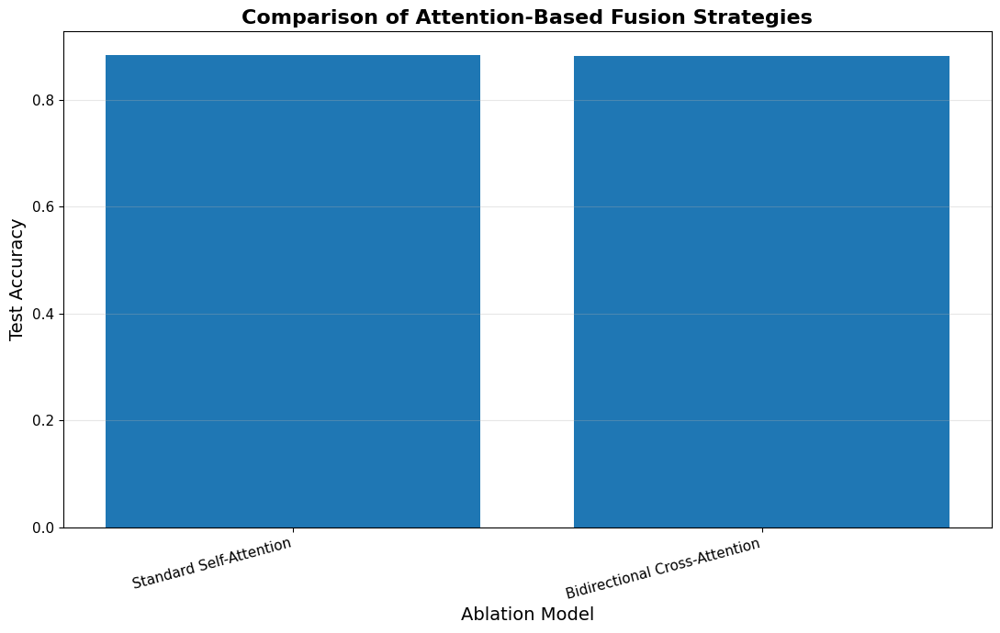

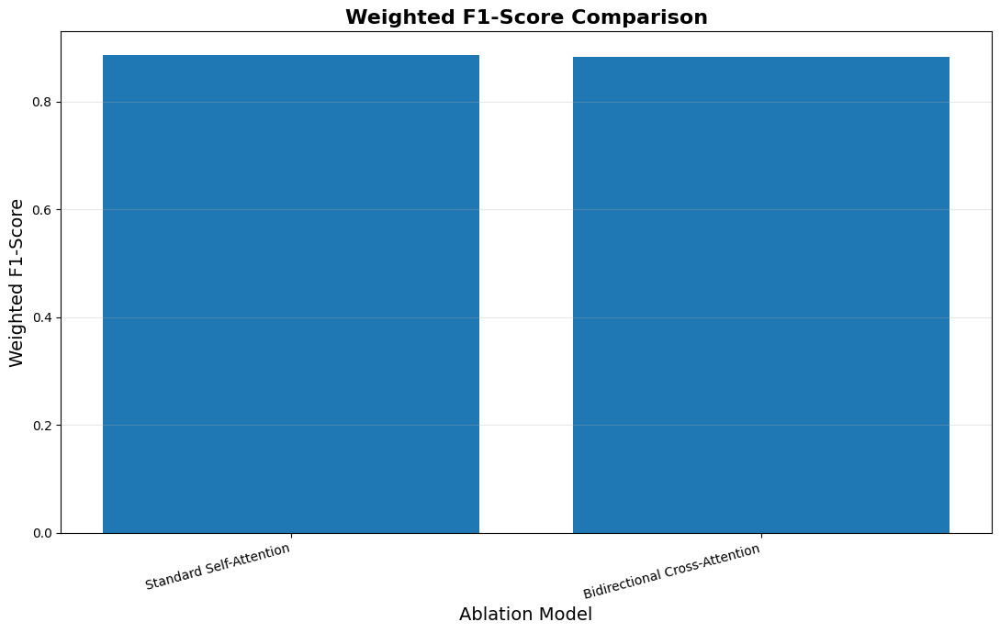

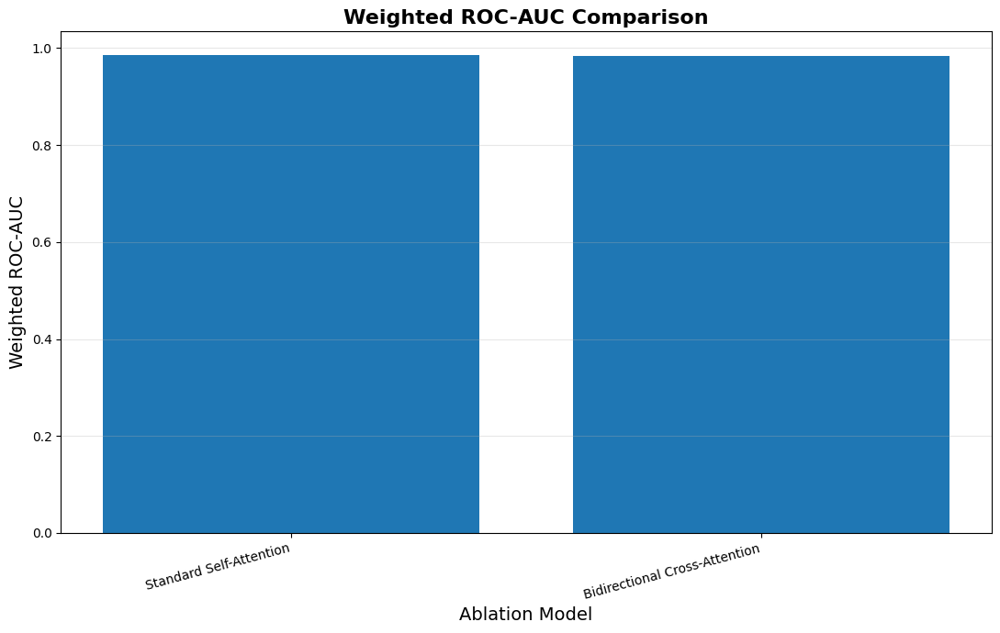

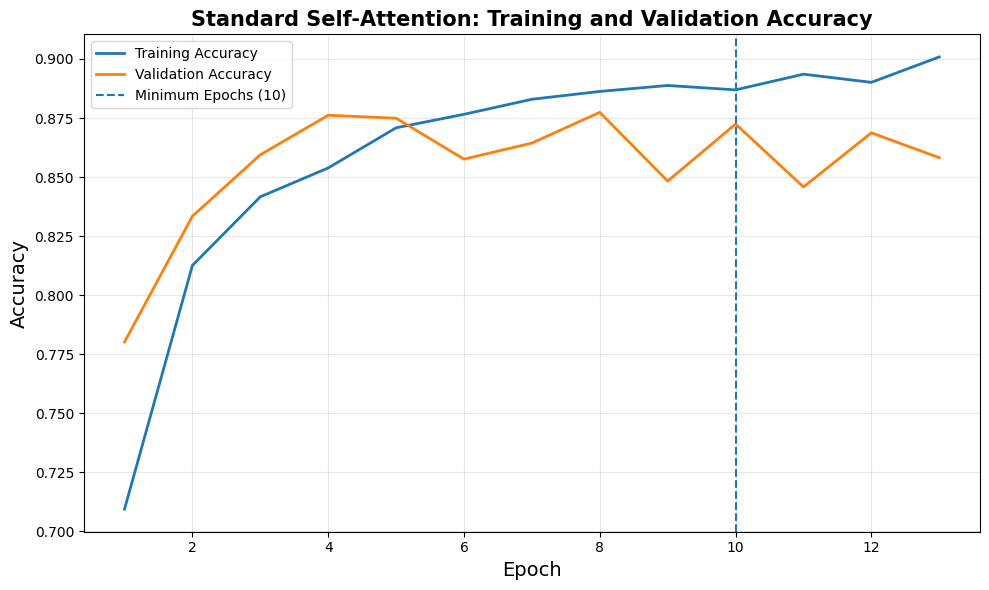

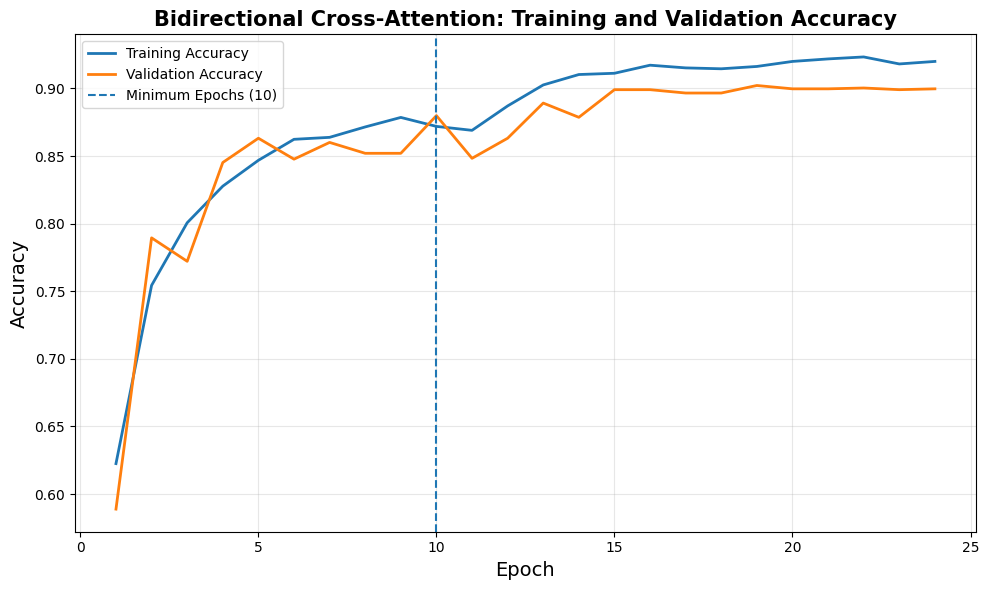

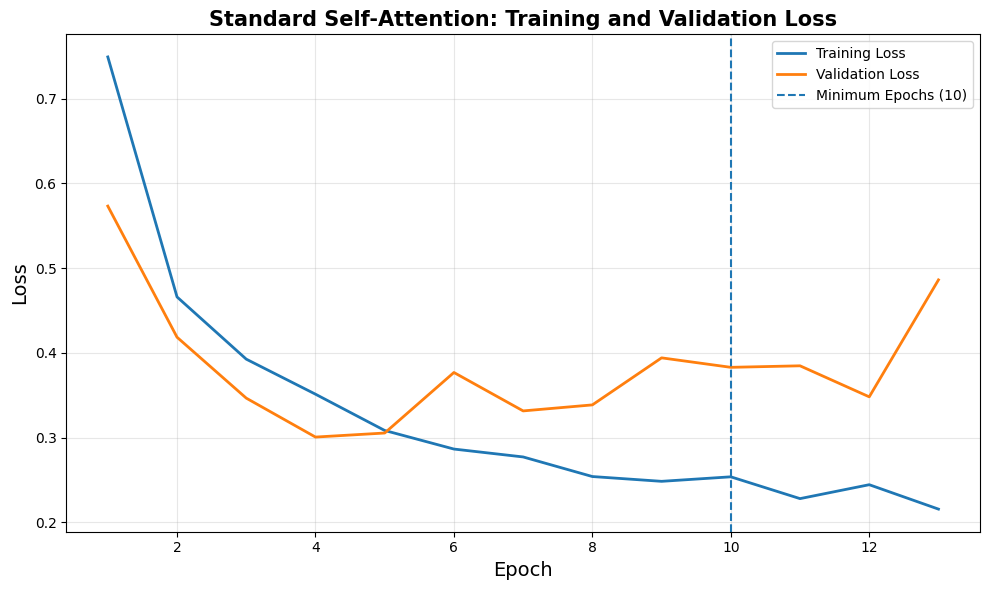

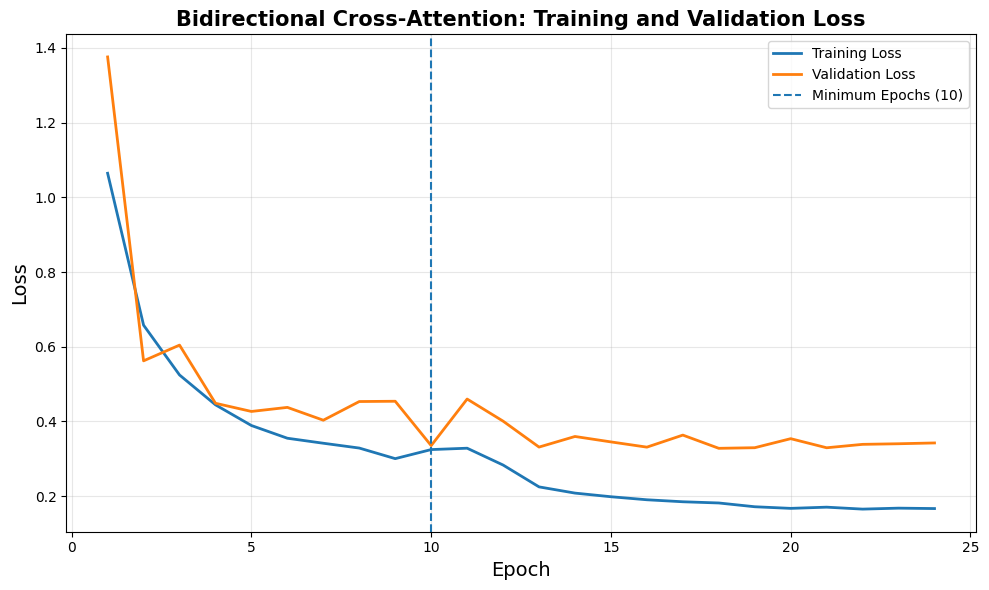

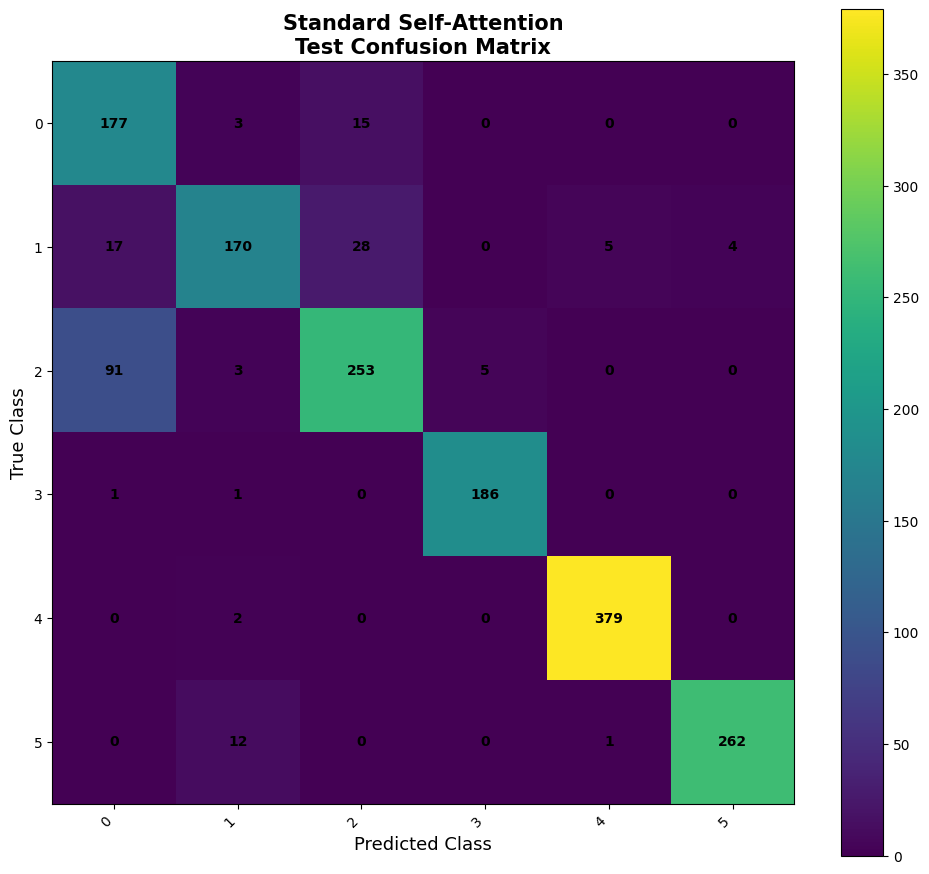

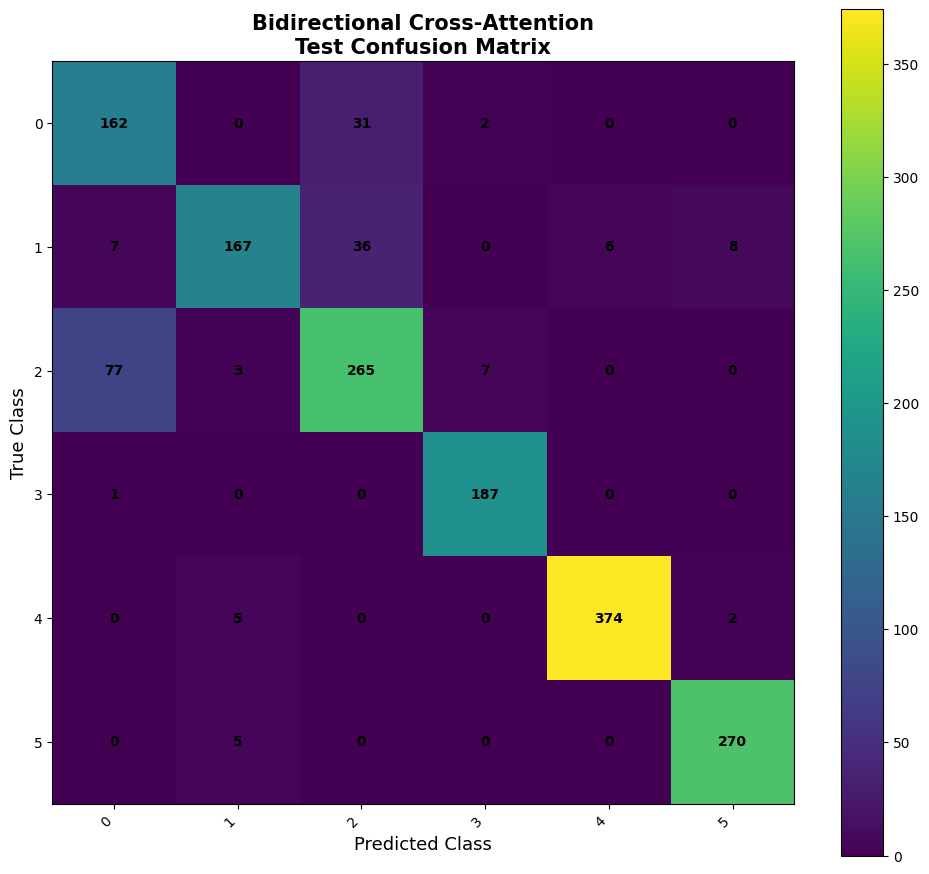



PER-CLASS F1-SCORE


,Standard Self-Attention,Bidirectional Cross-Attention
0,0.7360,0.7330
1,0.8193,0.8267
2,0.7809,0.7749
3,0.9815,0.9740
4,0.9896,0.9829
5,0.9686,0.9730


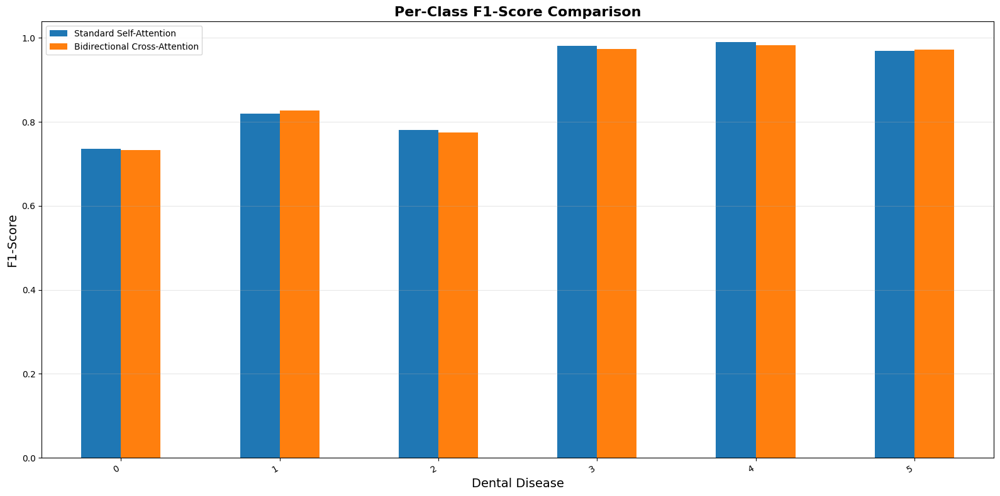



TWO-MODEL ABLATION EXPERIMENT COMPLETED

Models evaluated:
1. MobileNetV2 + ViT-B/16 — Standard Self-Attention
2. MobileNetV2 + ViT-B/16 — Bidirectional Cross-Attention

Training policy:
Minimum epochs          : 10
Maximum epochs          : 50
Early stopping patience : 5

Best-performing model:
Standard Self-Attention
Test Accuracy: 0.8836

Generated files:
✓ Reviewer2_TwoModel_Ablation_Results.csv
✓ Reviewer2_TwoModel_Per_Class_F1.csv
✓ Reviewer2_TwoModel_Ablation_Complete.xlsx
✓ Reviewer2_TwoModel_Accuracy.png
✓ Reviewer2_TwoModel_F1.png
✓ Reviewer2_TwoModel_AUC.png
✓ Individual Accuracy curves
✓ Individual Loss curves
✓ Individual confusion matrices
✓ Reviewer2_TwoModel_Per_Class_F1.png



In [36]:
# ============================================================
# ============================================================
# REVIEWER 2
# TWO-MODEL ABLATION STUDY
# DENTAL DISEASE CLASSIFICATION
#
# ============================================================
#
# MODELS
#
# 1. MobileNetV2 + ViT-B/16
#    Standard Self-Attention
#
# 2. MobileNetV2 + ViT-B/16
#    Bidirectional Cross-Attention
#
# ============================================================
#
# IMPORTANT
#
# This experiment MUST use the SAME:
#
#   TRAINING SET
#   VALIDATION SET
#   INDEPENDENT TEST SET
#   PREPROCESSING
#   AUGMENTATION
#   BATCH SIZE
#   OPTIMIZER
#   LEARNING RATE
#   WEIGHT DECAY
#   CLASS WEIGHTS
#   MINIMUM EPOCHS
#   MAXIMUM EPOCHS
#   EARLY STOPPING POLICY
#   LR SCHEDULING
#
# ============================================================
#
# EARLY STOPPING POLICY
#
# MIN_EPOCHS = 10
# MAX_EPOCHS = 50
# PATIENCE = 5
#
# A model CANNOT stop before epoch 10.
#
# After epoch 10:
#
#   improvement in validation accuracy:
#       continue training
#
#   no improvement for 5 consecutive epochs:
#       stop training
#
# Best validation weights are restored.
#
# ============================================================


# ============================================================
# 0. IMPORTS
# ============================================================

import os
import gc
import random
import warnings

import numpy as np
import pandas as pd
import tensorflow as tf
import matplotlib.pyplot as plt

from sklearn.preprocessing import LabelEncoder

from sklearn.utils.class_weight import compute_class_weight

from sklearn.metrics import (
    accuracy_score,
    precision_score,
    recall_score,
    f1_score,
    roc_auc_score,
    classification_report,
    confusion_matrix
)

import keras_hub


warnings.filterwarnings("ignore")


# ============================================================
# 1. REPRODUCIBILITY
# ============================================================

SEED = 42

os.environ["PYTHONHASHSEED"] = str(SEED)

random.seed(SEED)

np.random.seed(SEED)

tf.random.set_seed(SEED)


print("=" * 100)
print("REVIEWER 2 — TWO-MODEL ABLATION STUDY")
print("=" * 100)

print(
    "\nTensorFlow:",
    tf.__version__
)

print(
    "KerasHub:",
    keras_hub.__version__
)


# ============================================================
# 2. EXPERIMENTAL CONFIGURATION
# ============================================================

MIN_EPOCHS = 10

EPOCHS = 50

PATIENCE = 5

LR_PATIENCE = 2

LEARNING_RATE = 1e-4

WEIGHT_DECAY = 1e-4

MIN_LR = 1e-7

DROPOUT = 0.30

ATTENTION_DROPOUT = 0.10

NUM_HEADS = 8

KEY_DIM = 64

PROJECTION_DIM = 512


print("\n" + "=" * 100)
print("TRAINING CONFIGURATION")
print("=" * 100)

print(
    f"Minimum epochs          : {MIN_EPOCHS}"
)

print(
    f"Maximum epochs          : {EPOCHS}"
)

print(
    f"Early stopping patience : {PATIENCE}"
)

print(
    f"LR patience             : {LR_PATIENCE}"
)

print(
    f"Learning rate           : {LEARNING_RATE}"
)

print(
    f"Weight decay            : {WEIGHT_DECAY}"
)

print(
    f"Minimum learning rate   : {MIN_LR}"
)

print(
    f"Classifier dropout      : {DROPOUT}"
)

print(
    f"Attention dropout       : {ATTENTION_DROPOUT}"
)

print(
    f"Attention heads         : {NUM_HEADS}"
)

print(
    f"Attention key dimension: {KEY_DIM}"
)

print(
    f"Projection dimension   : {PROJECTION_DIM}"
)


# ============================================================
# 3. BASIC CONFIGURATION VALIDATION
# ============================================================

if MIN_EPOCHS < 1:

    raise ValueError(
        "MIN_EPOCHS must be >= 1."
    )


if EPOCHS < MIN_EPOCHS:

    raise ValueError(
        "EPOCHS must be >= MIN_EPOCHS."
    )


if PATIENCE < 1:

    raise ValueError(
        "PATIENCE must be >= 1."
    )


# ============================================================
# 4. VERIFY DATAFRAME AVAILABILITY
# ============================================================
#
# IMPORTANT:
#
# train_df, val_df, and test_df MUST already exist.
#
# They should come from the original dataset split.
#
# DO NOT create a new random split here.
#
# ============================================================

required_dataframes = [

    "train_df",
    "val_df",
    "test_df"

]


missing_dataframes = [

    df_name

    for df_name in required_dataframes

    if df_name not in globals()

]


if missing_dataframes:

    raise NameError(

        "\nThe following required DataFrames "
        "do not exist:\n\n"

        + "\n".join(
            f"  - {x}"
            for x in missing_dataframes
        )

        + "\n\nPlease run the ORIGINAL dataset "
          "preparation/splitting cells first.\n\n"

          "The required objects are:\n"
          "  train_df\n"
          "  val_df\n"
          "  test_df\n"

    )


print("\n✓ train_df found")

print(
    "  Shape:",
    train_df.shape
)

print("\n✓ val_df found")

print(
    "  Shape:",
    val_df.shape
)

print("\n✓ test_df found")

print(
    "  Shape:",
    test_df.shape
)


# ============================================================
# 5. VERIFY DATASET OBJECTS
# ============================================================
#
# The training pipeline also requires:
#
#   train_ds
#   val_ds
#   test_ds
#
# These should be created by your original image
# preprocessing pipeline.
#
# ============================================================

required_datasets = [

    "train_ds",
    "val_ds",
    "test_ds"

]


missing_datasets = [

    ds_name

    for ds_name in required_datasets

    if ds_name not in globals()

]


if missing_datasets:

    raise NameError(

        "\nThe following TensorFlow datasets "
        "do not exist:\n\n"

        + "\n".join(
            f"  - {x}"
            for x in missing_datasets
        )

        + "\n\nPlease run the ORIGINAL image "
          "dataset/preprocessing cells first.\n\n"

          "Required:\n"
          "  train_ds\n"
          "  val_ds\n"
          "  test_ds\n"

    )


print("\n✓ train_ds found")

print("✓ val_ds found")

print("✓ test_ds found")


# ============================================================
# 6. IMAGE SIZE VALIDATION
# ============================================================
#
# ViT-B/16 ImageNet preset requires 224x224 RGB input.
#
# ============================================================

if "IMAGE_SIZE" not in globals():

    IMAGE_SIZE = 224

    print(
        "\nIMAGE_SIZE was not previously defined."
    )

    print(
        "Using IMAGE_SIZE = 224."
    )


if IMAGE_SIZE != 224:

    raise ValueError(

        "\nFor this experiment, IMAGE_SIZE "
        "must be 224.\n\n"

        f"Current IMAGE_SIZE = {IMAGE_SIZE}\n\n"

        "Set:\n"
        "IMAGE_SIZE = 224\n\n"

        "and recreate train_ds, val_ds, and test_ds "
        "using the same preprocessing pipeline."

    )


print(
    f"\n✓ IMAGE_SIZE = {IMAGE_SIZE}"
)


# ============================================================
# 7. DATAFRAME COPIES
# ============================================================

train_df = train_df.copy()

val_df = val_df.copy()

test_df = test_df.copy()


# ============================================================
# 8. LABEL COLUMN DETECTION
# ============================================================

POSSIBLE_LABEL_COLUMNS = [

    "label_encoded",
    "label",
    "class",
    "Class",
    "target",
    "Target",
    "disease",
    "Disease",
    "category",
    "Category",
    "diagnosis",
    "Diagnosis"

]


def find_label_column(
    df,
    df_name
):

    # --------------------------------------------------------
    # Exact match
    # --------------------------------------------------------

    for col in POSSIBLE_LABEL_COLUMNS:

        if col in df.columns:

            return col


    # --------------------------------------------------------
    # Case-insensitive match
    # --------------------------------------------------------

    lower_map = {

        str(col).lower(): col

        for col in df.columns

    }


    for col in POSSIBLE_LABEL_COLUMNS:

        if col.lower() in lower_map:

            return lower_map[
                col.lower()
            ]


    raise ValueError(

        f"\nCould not identify the label column "
        f"in {df_name}.\n\n"

        f"Available columns:\n"
        f"{df.columns.tolist()}\n\n"

        "Please specify the correct label column."

    )


train_label_col = find_label_column(

    train_df,

    "train_df"

)


val_label_col = find_label_column(

    val_df,

    "val_df"

)


test_label_col = find_label_column(

    test_df,

    "test_df"

)


print("\n" + "=" * 100)
print("LABEL COLUMN DETECTION")
print("=" * 100)

print(
    "\nTrain:",
    train_label_col
)

print(
    "Validation:",
    val_label_col
)

print(
    "Test:",
    test_label_col
)


# ============================================================
# 9. LABEL ENCODING
# ============================================================
#
# A SINGLE encoder is fitted ONLY on training labels.
#
# Validation and test labels use exactly the same mapping.
#
# ============================================================

label_encoder = LabelEncoder()


label_encoder.fit(

    train_df[
        train_label_col
    ].astype(str)

)


# ------------------------------------------------------------
# Check validation labels
# ------------------------------------------------------------

unknown_val = (

    set(
        val_df[
            val_label_col
        ].astype(str)
    )

    -

    set(
        label_encoder.classes_
    )

)


# ------------------------------------------------------------
# Check test labels
# ------------------------------------------------------------

unknown_test = (

    set(
        test_df[
            test_label_col
        ].astype(str)
    )

    -

    set(
        label_encoder.classes_
    )

)


if unknown_val:

    raise ValueError(

        "Validation contains classes "
        "not present in training:\n"
        f"{unknown_val}"

    )


if unknown_test:

    raise ValueError(

        "Test contains classes "
        "not present in training:\n"
        f"{unknown_test}"

    )


# ------------------------------------------------------------
# Encode
# ------------------------------------------------------------

train_df[
    "label_encoded"
] = label_encoder.transform(

    train_df[
        train_label_col
    ].astype(str)

)


val_df[
    "label_encoded"
] = label_encoder.transform(

    val_df[
        val_label_col
    ].astype(str)

)


test_df[
    "label_encoded"
] = label_encoder.transform(

    test_df[
        test_label_col
    ].astype(str)

)


# ============================================================
# 10. CLASS INFORMATION
# ============================================================

CLASS_NAMES = [

    str(x)

    for x in label_encoder.classes_

]


NUM_CLASSES = len(
    CLASS_NAMES
)


print("\n" + "=" * 100)
print("CLASS INFORMATION")
print("=" * 100)

print(
    "\nNumber of classes:",
    NUM_CLASSES
)


for idx, class_name in enumerate(
    CLASS_NAMES
):

    print(
        f"{idx:3d} -> {class_name}"
    )


# ============================================================
# 11. VERIFY ENCODED LABELS
# ============================================================

train_classes = set(

    train_df[
        "label_encoded"
    ].unique()

)


val_classes = set(

    val_df[
        "label_encoded"
    ].unique()

)


test_classes = set(

    test_df[
        "label_encoded"
    ].unique()

)


if not val_classes.issubset(
    train_classes
):

    raise ValueError(

        "Validation contains encoded "
        "classes absent from training."

    )


if not test_classes.issubset(
    train_classes
):

    raise ValueError(

        "Test contains encoded "
        "classes absent from training."

    )


print(
    "\n✓ Train/validation/test class consistency verified."
)


# ============================================================
# 12. CLASS DISTRIBUTION
# ============================================================

print("\n" + "=" * 100)
print("CLASS DISTRIBUTION")
print("=" * 100)


distribution_df = pd.DataFrame({

    "Class_ID":
        np.arange(NUM_CLASSES),

    "Class_Name":
        CLASS_NAMES,

    "Train":
        train_df[
            "label_encoded"
        ].value_counts()
        .reindex(
            np.arange(NUM_CLASSES),
            fill_value=0
        )
        .values,

    "Validation":
        val_df[
            "label_encoded"
        ].value_counts()
        .reindex(
            np.arange(NUM_CLASSES),
            fill_value=0
        )
        .values,

    "Test":
        test_df[
            "label_encoded"
        ].value_counts()
        .reindex(
            np.arange(NUM_CLASSES),
            fill_value=0
        )
        .values

})


display(
    distribution_df
)


# ============================================================
# 13. CLASS WEIGHTS
# ============================================================

classes = np.arange(
    NUM_CLASSES
)


class_weights_array = compute_class_weight(

    class_weight="balanced",

    classes=classes,

    y=train_df[
        "label_encoded"
    ].values

)


CLASS_WEIGHTS = {

    int(class_id):
    float(weight)

    for class_id, weight

    in zip(
        classes,
        class_weights_array
    )

}


print("\n" + "=" * 100)
print("CLASS WEIGHTS")
print("=" * 100)


for class_id, weight in CLASS_WEIGHTS.items():

    print(

        f"{class_id:3d} | "
        f"{CLASS_NAMES[class_id]:30s} | "
        f"{weight:.6f}"

    )


# ============================================================
# 14. IMPORTANT DATASET LABEL CHECK
# ============================================================
#
# If train_ds/val_ds/test_ds were created BEFORE the
# label-encoding cell, they may contain the original labels.
#
# The experiment must ensure that the labels inside the
# TensorFlow datasets correspond exactly to:
#
#   train_df["label_encoded"]
#   val_df["label_encoded"]
#   test_df["label_encoded"]
#
# ============================================================

print("\n" + "=" * 100)
print("DATASET OBJECT CHECK")
print("=" * 100)

print(
    "\ntrain_ds:",
    train_ds
)

print(
    "\nval_ds:",
    val_ds
)

print(
    "\ntest_ds:",
    test_ds
)

print(
    "\n✓ Existing TensorFlow datasets will be used."
)

print(
    "✓ No new train/validation/test split will be created."
)


# ============================================================
# 15. COMMON OPTIMIZER
# ============================================================

def get_optimizer():

    return tf.keras.optimizers.AdamW(

        learning_rate=LEARNING_RATE,

        weight_decay=WEIGHT_DECAY

    )


# ============================================================
# 16. MINIMUM-EPOCH EARLY STOPPING
# ============================================================

class MinimumEpochEarlyStopping(
    tf.keras.callbacks.Callback
):

    def __init__(

        self,

        monitor="val_accuracy",

        patience=5,

        min_epochs=10,

        mode="max",

        restore_best_weights=True,

        verbose=1

    ):

        super().__init__()

        self.monitor = monitor

        self.patience = patience

        self.min_epochs = min_epochs

        self.mode = mode

        self.restore_best_weights = (
            restore_best_weights
        )

        self.verbose = verbose

        self.wait = 0

        self.best_weights = None

        self.best_epoch = 0

        self.stopped_epoch = 0


        if mode == "min":

            self.best = np.inf

            self.monitor_op = np.less

        else:

            self.best = -np.inf

            self.monitor_op = np.greater


    def on_train_begin(
        self,
        logs=None
    ):

        self.wait = 0

        self.best_weights = None

        self.best_epoch = 0

        self.stopped_epoch = 0

        if self.mode == "min":

            self.best = np.inf

        else:

            self.best = -np.inf


    def on_epoch_end(

        self,

        epoch,

        logs=None

    ):

        logs = logs or {}

        current = logs.get(
            self.monitor
        )

        current_epoch = epoch + 1


        if current is None:

            return


        # ----------------------------------------------------
        # Improvement
        # ----------------------------------------------------

        if self.monitor_op(

            current,
            self.best

        ):

            self.best = current

            self.best_epoch = current_epoch

            self.wait = 0

            if self.restore_best_weights:

                self.best_weights = (

                    self.model.get_weights()

                )

        else:

            self.wait += 1


        # ----------------------------------------------------
        # NEVER STOP BEFORE MIN_EPOCHS
        # ----------------------------------------------------

        if current_epoch < self.min_epochs:

            if self.verbose:

                print(

                    f"\nMinimum epoch protection: "
                    f"{current_epoch}/{self.min_epochs}"

                )

            return


        # ----------------------------------------------------
        # STOP AFTER PATIENCE
        # ----------------------------------------------------

        if self.wait >= self.patience:

            self.stopped_epoch = current_epoch

            self.model.stop_training = True


            if self.restore_best_weights:

                if self.best_weights is not None:

                    self.model.set_weights(

                        self.best_weights

                    )


            if self.verbose:

                print(

                    f"\nEarly stopping triggered "
                    f"at epoch {current_epoch}."

                )

                print(

                    f"Best {self.monitor}: "
                    f"{self.best:.6f}"

                )

                print(

                    f"Best epoch: "
                    f"{self.best_epoch}"

                )


    def on_train_end(
        self,
        logs=None
    ):

        if self.verbose:

            if self.stopped_epoch > 0:

                print(

                    f"\nTraining stopped at "
                    f"epoch {self.stopped_epoch}."

                )

            else:

                print(

                    "\nTraining reached maximum "
                    f"epochs: {EPOCHS}."

                )

            print(

                f"Best epoch: "
                f"{self.best_epoch}"

            )

            print(

                f"Best {self.monitor}: "
                f"{self.best:.6f}"

            )


# ============================================================
# 17. MINIMUM-EPOCH LR SCHEDULER
# ============================================================

class MinimumEpochReduceLROnPlateau(
    tf.keras.callbacks.ReduceLROnPlateau
):

    def __init__(

        self,

        min_epochs=10,

        **kwargs

    ):

        super().__init__(**kwargs)

        self.min_epochs = min_epochs


    def on_epoch_end(

        self,

        epoch,

        logs=None

    ):

        current_epoch = epoch + 1


        if current_epoch < self.min_epochs:

            return


        super().on_epoch_end(

            epoch,

            logs

        )


# ============================================================
# 18. CALLBACK FACTORY
# ============================================================

def get_callbacks(
    model_name
):

    safe_name = (

        model_name

        .replace(" ", "_")

        .replace("-", "_")

        .replace("/", "_")

    )


    checkpoint_path = (

        f"{safe_name}_best.keras"

    )


    return [

        MinimumEpochEarlyStopping(

            monitor="val_accuracy",

            patience=PATIENCE,

            min_epochs=MIN_EPOCHS,

            mode="max",

            restore_best_weights=True,

            verbose=1

        ),

        MinimumEpochReduceLROnPlateau(

            min_epochs=MIN_EPOCHS,

            monitor="val_loss",

            factor=0.3,

            patience=LR_PATIENCE,

            min_lr=MIN_LR,

            verbose=1

        ),

        tf.keras.callbacks.ModelCheckpoint(

            filepath=checkpoint_path,

            monitor="val_accuracy",

            mode="max",

            save_best_only=True,

            verbose=1

        )

    ]


# ============================================================
# 19. MOBILE NET V2 BACKBONE
# ============================================================

def create_mobilenet():

    backbone = (

        tf.keras.applications.MobileNetV2(

            include_top=False,

            weights="imagenet",

            input_shape=(

                IMAGE_SIZE,

                IMAGE_SIZE,

                3

            ),

            pooling=None

        )

    )


    backbone.trainable = True


    return backbone


# ============================================================
# 20. ViT-B/16 BACKBONE
# ============================================================

def create_vit_backbone():

    vit = (

        keras_hub.models.ViTBackbone
        .from_preset(

            "vit_base_patch16_224_imagenet"

        )

    )


    vit.trainable = True


    return vit


# ============================================================
# 21. MOBILE NET REPRESENTATION
# ============================================================

def get_mobilenet_representation(

    backbone,

    inputs

):

    features = backbone(

        inputs,

        training=True

    )


    features = (

        tf.keras.layers.GlobalAveragePooling2D(

            name="MobileNet_GlobalAveragePooling"

        )(

            features

        )

    )


    return features


# ============================================================
# 22. ViT TOKEN REPRESENTATION
# ============================================================

def get_vit_tokens(

    vit,

    inputs

):

    tokens = vit(

        inputs,

        training=True

    )


    if len(tokens.shape) != 3:

        raise ValueError(

            "Unexpected ViT output shape: "

            f"{tokens.shape}"

    )


    return tokens


# ============================================================
# 23. HYBRID BACKBONES
# ============================================================

def create_hybrid_backbones():

    mobile = create_mobilenet()

    vit = create_vit_backbone()


    mobile.trainable = True

    vit.trainable = True


    return mobile, vit


# ============================================================
# 24. HYBRID REPRESENTATIONS
# ============================================================

def extract_hybrid_representations(

    inputs,

    mobile,

    vit

):

    mobile_features = (

        get_mobilenet_representation(

            mobile,

            inputs

        )

    )


    vit_tokens = get_vit_tokens(

        vit,

        inputs

    )


    vit_cls = tf.keras.layers.Lambda(

        lambda x: x[:, 0, :],

        name="ViT_CLS_Token"

    )(

        vit_tokens

    )


    return (

        mobile_features,

        vit_tokens,

        vit_cls

    )


# ============================================================
# 25. MODEL 1
# STANDARD SELF-ATTENTION
# ============================================================

def build_standard_attention_model():

    inputs = tf.keras.Input(

        shape=(

            IMAGE_SIZE,

            IMAGE_SIZE,

            3

        ),

        name="Image_Input"

    )


    mobile, vit = (
        create_hybrid_backbones()
    )


    (

        mobile_features,

        vit_tokens,

        vit_cls

    ) = extract_hybrid_representations(

        inputs,

        mobile,

        vit

    )


    # --------------------------------------------------------
    # MobileNet projection
    # --------------------------------------------------------

    mobile_features = tf.keras.layers.Dense(

        PROJECTION_DIM,

        activation="relu",

        name="MobileNet_Projection"

    )(

        mobile_features

    )


    # --------------------------------------------------------
    # ViT CLS projection
    # --------------------------------------------------------

    vit_cls = tf.keras.layers.Dense(

        PROJECTION_DIM,

        activation="relu",

        name="ViT_Projection"

    )(

        vit_cls

    )


    # --------------------------------------------------------
    # Convert modality representations into tokens
    # --------------------------------------------------------

    mobile_token = tf.keras.layers.Reshape(

        (1, PROJECTION_DIM),

        name="MobileNet_Modality_Token"

    )(

        mobile_features

    )


    vit_token = tf.keras.layers.Reshape(

        (1, PROJECTION_DIM),

        name="ViT_Modality_Token"

    )(

        vit_cls

    )


    # --------------------------------------------------------
    # Two-token multimodal sequence
    # --------------------------------------------------------

    modality_tokens = (

        tf.keras.layers.Concatenate(

            axis=1,

            name="Modality_Token_Sequence"

        )([

            mobile_token,

            vit_token

        ])

    )


    # --------------------------------------------------------
    # STANDARD SELF-ATTENTION
    # --------------------------------------------------------

    attention_output = (

        tf.keras.layers.MultiHeadAttention(

            num_heads=NUM_HEADS,

            key_dim=KEY_DIM,

            dropout=ATTENTION_DROPOUT,

            name="Standard_Self_Attention"

        )(

            query=modality_tokens,

            key=modality_tokens,

            value=modality_tokens

        )

    )


    # --------------------------------------------------------
    # Residual connection
    # --------------------------------------------------------

    x = tf.keras.layers.Add(

        name="SelfAttention_Residual"

    )([

        modality_tokens,

        attention_output

    ])


    # --------------------------------------------------------
    # Layer normalization
    # --------------------------------------------------------

    x = tf.keras.layers.LayerNormalization(

        name="SelfAttention_Norm"

    )(

        x

    )


    # --------------------------------------------------------
    # Feed-forward network
    # --------------------------------------------------------

    ff = tf.keras.layers.Dense(

        PROJECTION_DIM,

        activation="gelu",

        name="SelfAttention_FFN1"

    )(

        x

    )


    ff = tf.keras.layers.Dropout(

        ATTENTION_DROPOUT,

        name="SelfAttention_FFN_Dropout"

    )(

        ff

    )


    ff = tf.keras.layers.Dense(

        PROJECTION_DIM,

        name="SelfAttention_FFN2"

    )(

        ff

    )


    # --------------------------------------------------------
    # FFN residual
    # --------------------------------------------------------

    x = tf.keras.layers.Add(

        name="FFN_Residual"

    )([

        x,

        ff

    ])


    x = tf.keras.layers.LayerNormalization(

        name="FFN_Norm"

    )(

        x

    )


    # --------------------------------------------------------
    # Global pooling
    # --------------------------------------------------------

    x = tf.keras.layers.GlobalAveragePooling1D(

        name="Attention_GlobalPooling"

    )(

        x

    )


    # --------------------------------------------------------
    # Classifier
    # --------------------------------------------------------

    x = tf.keras.layers.Dense(

        PROJECTION_DIM,

        activation="relu",

        name="Classifier_Dense"

    )(

        x

    )


    x = tf.keras.layers.Dropout(

        DROPOUT,

        name="Classifier_Dropout"

    )(

        x

    )


    outputs = tf.keras.layers.Dense(

        NUM_CLASSES,

        activation="softmax",

        name="Classifier"

    )(

        x

    )


    model = tf.keras.Model(

        inputs=inputs,

        outputs=outputs,

        name="MobileNetV2_ViT_StandardAttention"

    )


    model.compile(

        optimizer=get_optimizer(),

        loss="sparse_categorical_crossentropy",

        metrics=[

            "accuracy"

        ]

    )


    return model


# ============================================================
# 26. MODEL 2
# BIDIRECTIONAL CROSS-ATTENTION
# ============================================================

def build_cross_attention_model():

    inputs = tf.keras.Input(

        shape=(

            IMAGE_SIZE,

            IMAGE_SIZE,

            3

        ),

        name="Image_Input"

    )


    mobile, vit = (
        create_hybrid_backbones()
    )


    (

        mobile_features,

        vit_tokens,

        vit_cls

    ) = extract_hybrid_representations(

        inputs,

        mobile,

        vit

    )


    # ========================================================
    # MOBILE NET PROJECTION
    # ========================================================

    mobile_features = tf.keras.layers.Dense(

        PROJECTION_DIM,

        activation="relu",

        name="MobileNet_Projection"

    )(

        mobile_features

    )


    mobile_token = tf.keras.layers.Reshape(

        (1, PROJECTION_DIM),

        name="MobileNet_Query_Token"

    )(

        mobile_features

    )


    # ========================================================
    # ViT TOKEN PROJECTION
    # ========================================================

    vit_tokens = tf.keras.layers.Dense(

        PROJECTION_DIM,

        activation="relu",

        name="ViT_Token_Projection"

    )(

        vit_tokens

    )


    # ========================================================
    # CNN → ViT
    #
    # MobileNet representation queries the complete
    # ViT token sequence.
    # ========================================================

    mobile_to_vit_attention = (

        tf.keras.layers.MultiHeadAttention(

            num_heads=NUM_HEADS,

            key_dim=KEY_DIM,

            dropout=ATTENTION_DROPOUT,

            name="CNN_to_ViT_CrossAttention"

        )(

            query=mobile_token,

            key=vit_tokens,

            value=vit_tokens

        )

    )


    mobile_fused = tf.keras.layers.Add(

        name="CNN_CrossAttention_Residual"

    )([

        mobile_token,

        mobile_to_vit_attention

    ])


    mobile_fused = (

        tf.keras.layers.LayerNormalization(

            name="CNN_CrossAttention_Norm"

        )(

            mobile_fused

        )

    )


    # ========================================================
    # ViT CLS PROJECTION
    # ========================================================

    vit_cls = tf.keras.layers.Dense(

        PROJECTION_DIM,

        activation="relu",

        name="ViT_CLS_Projection"

    )(

        vit_cls

    )


    vit_query = tf.keras.layers.Reshape(

        (1, PROJECTION_DIM),

        name="ViT_Query_Token"

    )(

        vit_cls

    )


    # ========================================================
    # ViT → CNN
    #
    # ViT CLS representation queries the CNN representation.
    # ========================================================

    vit_to_mobile_attention = (

        tf.keras.layers.MultiHeadAttention(

            num_heads=NUM_HEADS,

            key_dim=KEY_DIM,

            dropout=ATTENTION_DROPOUT,

            name="ViT_to_CNN_CrossAttention"

        )(

            query=vit_query,

            key=mobile_token,

            value=mobile_token

        )

    )


    vit_fused = tf.keras.layers.Add(

        name="ViT_CrossAttention_Residual"

    )([

        vit_query,

        vit_to_mobile_attention

    ])


    vit_fused = (

        tf.keras.layers.LayerNormalization(

            name="ViT_CrossAttention_Norm"

        )(

            vit_fused

        )

    )


    # ========================================================
    # BIDIRECTIONAL FUSION
    # ========================================================

    fused_tokens = (

        tf.keras.layers.Concatenate(

            axis=1,

            name="Bidirectional_CrossAttention_Fusion"

        )([

            mobile_fused,

            vit_fused

        ])

    )


    # ========================================================
    # GLOBAL POOLING
    # ========================================================

    fused = (

        tf.keras.layers.GlobalAveragePooling1D(

            name="CrossAttention_GlobalPooling"

        )(

            fused_tokens

        )

    )


    # ========================================================
    # FUSION CLASSIFIER
    # ========================================================

    fused = tf.keras.layers.Dense(

        PROJECTION_DIM,

        activation="relu",

        name="CrossAttention_Fusion_Dense"

    )(

        fused

    )


    fused = (

        tf.keras.layers.BatchNormalization(

            name="CrossAttention_Fusion_BN"

        )(

            fused

        )

    )


    fused = tf.keras.layers.Dropout(

        DROPOUT,

        name="CrossAttention_Fusion_Dropout"

    )(

        fused

    )


    outputs = tf.keras.layers.Dense(

        NUM_CLASSES,

        activation="softmax",

        name="Classifier"

    )(

        fused

    )


    model = tf.keras.Model(

        inputs=inputs,

        outputs=outputs,

        name="MobileNetV2_ViT_BidirectionalCrossAttention"

    )


    model.compile(

        optimizer=get_optimizer(),

        loss="sparse_categorical_crossentropy",

        metrics=[

            "accuracy"

        ]

    )


    return model


# ============================================================
# 27. MODEL FACTORY
# ============================================================

MODEL_BUILDERS = {

    "Standard Self-Attention":
        build_standard_attention_model,

    "Bidirectional Cross-Attention":
        build_cross_attention_model

}


print("\n" + "=" * 100)
print("ABLATION MODELS")
print("=" * 100)

for model_name in MODEL_BUILDERS:

    print(
        "✓",
        model_name
    )


# ============================================================
# 28. STORAGE
# ============================================================

histories = {}

results = {}

predictions = {}

probabilities = {}

model_parameters = {}

training_epochs = {}

best_epochs = {}


# ============================================================
# 29. TRAINING FUNCTION
# ============================================================

def train_model(

    model_name,

    build_function

):

    print("\n")

    print("=" * 100)

    print(
        f"TRAINING: {model_name}"
    )

    print("=" * 100)


    # --------------------------------------------------------
    # Clear previous graph
    # --------------------------------------------------------

    tf.keras.backend.clear_session()

    gc.collect()


    # --------------------------------------------------------
    # Build
    # --------------------------------------------------------

    model = build_function()


    # --------------------------------------------------------
    # Parameters
    # --------------------------------------------------------

    total_params = model.count_params()


    model_parameters[
        model_name
    ] = total_params


    print(
        "\nTotal parameters:",
        f"{total_params:,}"
    )


    # --------------------------------------------------------
    # Model summary
    # --------------------------------------------------------

    model.summary()


    # --------------------------------------------------------
    # Train
    # --------------------------------------------------------

    history = model.fit(

        train_ds,

        validation_data=val_ds,

        epochs=EPOCHS,

        class_weight=CLASS_WEIGHTS,

        callbacks=get_callbacks(
            model_name
        ),

        verbose=1

    )


    # --------------------------------------------------------
    # Store history
    # --------------------------------------------------------

    histories[
        model_name
    ] = history.history


    # --------------------------------------------------------
    # Number of epochs
    # --------------------------------------------------------

    actual_epochs = len(

        history.history[
            "loss"
        ]

    )


    training_epochs[
        model_name
    ] = actual_epochs


    # --------------------------------------------------------
    # Best validation epoch
    # --------------------------------------------------------

    val_accuracy = history.history.get(

        "val_accuracy",

        []

    )


    if len(val_accuracy) > 0:

        best_epoch = (

            int(
                np.argmax(
                    val_accuracy
                )
            )

            + 1

        )

        best_val_accuracy = max(
            val_accuracy
        )

    else:

        best_epoch = np.nan

        best_val_accuracy = np.nan


    best_epochs[
        model_name
    ] = best_epoch


    print("\n" + "-" * 80)

    print(
        f"{model_name} completed."
    )

    print(
        f"Actual epochs       : {actual_epochs}"
    )

    print(
        f"Best epoch          : {best_epoch}"
    )

    print(
        f"Best validation acc.: "
        f"{best_val_accuracy:.6f}"
    )

    print("-" * 80)


    return model


# ============================================================
# 30. EVALUATION FUNCTION
# ============================================================

def evaluate_model(

    model,

    model_name

):

    print("\n")

    print("=" * 100)

    print(
        f"TEST EVALUATION: {model_name}"
    )

    print("=" * 100)


    # --------------------------------------------------------
    # Ground truth
    # --------------------------------------------------------

    y_true = (

        test_df[
            "label_encoded"
        ]

        .values

    )


    # --------------------------------------------------------
    # Prediction
    # --------------------------------------------------------

    y_prob = model.predict(

        test_ds,

        verbose=1

    )


    y_prob = np.asarray(
        y_prob
    )


    # --------------------------------------------------------
    # Check dimensions
    # --------------------------------------------------------

    if y_prob.ndim != 2:

        raise ValueError(

            f"Invalid prediction shape "
            f"for {model_name}: "
            f"{y_prob.shape}"

        )


    if y_prob.shape[1] != NUM_CLASSES:

        raise ValueError(

            f"{model_name} produced "
            f"{y_prob.shape[1]} outputs, "
            f"but expected {NUM_CLASSES}."

        )


    # --------------------------------------------------------
    # Predicted class
    # --------------------------------------------------------

    y_pred = np.argmax(

        y_prob,

        axis=1

    )


    # ========================================================
    # METRICS
    # ========================================================

    accuracy = accuracy_score(

        y_true,

        y_pred

    )


    precision = precision_score(

        y_true,

        y_pred,

        average="weighted",

        zero_division=0

    )


    recall = recall_score(

        y_true,

        y_pred,

        average="weighted",

        zero_division=0

    )


    weighted_f1 = f1_score(

        y_true,

        y_pred,

        average="weighted",

        zero_division=0

    )


    macro_f1 = f1_score(

        y_true,

        y_pred,

        average="macro",

        zero_division=0

    )


    # ========================================================
    # ROC-AUC
    # ========================================================

    try:

        auc = roc_auc_score(

            y_true,

            y_prob,

            multi_class="ovr",

            average="weighted"

        )

    except Exception as error:

        print(

            "\nROC-AUC unavailable:",
            error

        )

        auc = np.nan


    # ========================================================
    # STORE
    # ========================================================

    results[
        model_name
    ] = {

        "Accuracy":
            accuracy,

        "Precision":
            precision,

        "Recall":
            recall,

        "F1-Score":
            weighted_f1,

        "Macro-F1":
            macro_f1,

        "ROC-AUC":
            auc,

        "Parameters":
            model_parameters[
                model_name
            ],

        "Epochs":
            training_epochs[
                model_name
            ],

        "Best Epoch":
            best_epochs[
                model_name
            ]

    }


    predictions[
        model_name
    ] = y_pred


    probabilities[
        model_name
    ] = y_prob


    # ========================================================
    # CLASSIFICATION REPORT
    # ========================================================

    print(
        "\nClassification Report:\n"
    )


    print(

        classification_report(

            y_true,

            y_pred,

            target_names=CLASS_NAMES,

            digits=4,

            zero_division=0

        )

    )


    return (

        y_true,

        y_pred,

        y_prob

    )


# ============================================================
# 31. TRAIN BOTH ABLATION MODELS
# ============================================================

print("\n")

print("=" * 100)

print(
    "STARTING TWO-MODEL ABLATION EXPERIMENT"
)

print("=" * 100)

print(
    f"\nMinimum epochs = {MIN_EPOCHS}"
)

print(
    f"Maximum epochs = {EPOCHS}"
)

print(
    f"Early stopping patience = {PATIENCE}"
)


for model_name, builder in MODEL_BUILDERS.items():

    model = train_model(

        model_name,

        builder

    )


    evaluate_model(

        model,

        model_name

    )


    # --------------------------------------------------------
    # Release memory
    # --------------------------------------------------------

    del model

    tf.keras.backend.clear_session()

    gc.collect()


# ============================================================
# 32. FINAL RESULTS TABLE
# ============================================================

results_df = pd.DataFrame(
    results
).T


results_df = results_df.sort_values(

    "Accuracy",

    ascending=False

)


print("\n")

print("=" * 120)

print(
    "FINAL TWO-MODEL ABLATION RESULTS"
)

print("=" * 120)


display(

    results_df.style.format({

        "Accuracy":
            "{:.4f}",

        "Precision":
            "{:.4f}",

        "Recall":
            "{:.4f}",

        "F1-Score":
            "{:.4f}",

        "Macro-F1":
            "{:.4f}",

        "ROC-AUC":
            "{:.4f}",

        "Parameters":
            "{:,.0f}",

        "Epochs":
            "{:.0f}",

        "Best Epoch":
            "{:.0f}"

    })

)


# ============================================================
# 33. SAVE RESULTS CSV
# ============================================================

results_df.to_csv(

    "Reviewer2_TwoModel_Ablation_Results.csv"

)


print(
    "\n✓ Saved:"
)

print(
    "Reviewer2_TwoModel_Ablation_Results.csv"
)


# ============================================================
# 34. ACCURACY COMPARISON
# ============================================================

plt.figure(

    figsize=(11, 7)

)


plt.bar(

    results_df.index,

    results_df[
        "Accuracy"
    ]

)


plt.ylabel(

    "Test Accuracy",

    fontsize=14

)


plt.xlabel(

    "Ablation Model",

    fontsize=14

)


plt.title(

    "Comparison of Attention-Based Fusion Strategies",

    fontsize=16,

    fontweight="bold"

)


plt.xticks(

    rotation=15,

    ha="right",

    fontsize=11

)


plt.yticks(

    fontsize=11

)


plt.grid(

    axis="y",

    alpha=0.3

)


plt.tight_layout()


plt.savefig(

    "Reviewer2_TwoModel_Accuracy.png",

    dpi=600,

    bbox_inches="tight"

)


plt.show()


# ============================================================
# 35. F1 COMPARISON
# ============================================================

plt.figure(

    figsize=(11, 7)

)


plt.bar(

    results_df.index,

    results_df[
        "F1-Score"
    ]

)


plt.ylabel(

    "Weighted F1-Score",

    fontsize=14

)


plt.xlabel(

    "Ablation Model",

    fontsize=14

)


plt.title(

    "Weighted F1-Score Comparison",

    fontsize=16,

    fontweight="bold"

)


plt.xticks(

    rotation=15,

    ha="right"

)


plt.grid(

    axis="y",

    alpha=0.3

)


plt.tight_layout()


plt.savefig(

    "Reviewer2_TwoModel_F1.png",

    dpi=600,

    bbox_inches="tight"

)


plt.show()


# ============================================================
# 36. ROC-AUC COMPARISON
# ============================================================

plt.figure(

    figsize=(11, 7)

)


plt.bar(

    results_df.index,

    results_df[
        "ROC-AUC"
    ]

)


plt.ylabel(

    "Weighted ROC-AUC",

    fontsize=14

)


plt.xlabel(

    "Ablation Model",

    fontsize=14

)


plt.title(

    "Weighted ROC-AUC Comparison",

    fontsize=16,

    fontweight="bold"

)


plt.xticks(

    rotation=15,

    ha="right"

)


plt.grid(

    axis="y",

    alpha=0.3

)


plt.tight_layout()


plt.savefig(

    "Reviewer2_TwoModel_AUC.png",

    dpi=600,

    bbox_inches="tight"

)


plt.show()


# ============================================================
# 37. TRAINING / VALIDATION ACCURACY CURVES
# ============================================================

for model_name, history in histories.items():

    plt.figure(

        figsize=(10, 6)

    )


    epochs_axis = np.arange(

        1,

        len(
            history[
                "accuracy"
            ]
        ) + 1

    )


    plt.plot(

        epochs_axis,

        history[
            "accuracy"
        ],

        linewidth=2,

        label="Training Accuracy"

    )


    plt.plot(

        epochs_axis,

        history[
            "val_accuracy"
        ],

        linewidth=2,

        label="Validation Accuracy"

    )


    plt.axvline(

        MIN_EPOCHS,

        linestyle="--",

        linewidth=1.5,

        label=f"Minimum Epochs ({MIN_EPOCHS})"

    )


    plt.xlabel(

        "Epoch",

        fontsize=14

    )


    plt.ylabel(

        "Accuracy",

        fontsize=14

    )


    plt.title(

        f"{model_name}: Training and Validation Accuracy",

        fontsize=15,

        fontweight="bold"

    )


    plt.legend(

        fontsize=10

    )


    plt.grid(

        alpha=0.3

    )


    plt.tight_layout()


    safe_name = (

        model_name

        .replace(" ", "_")

        .replace("-", "_")

        .replace("/", "_")

    )


    plt.savefig(

        f"{safe_name}_Accuracy_Curve.png",

        dpi=600,

        bbox_inches="tight"

    )


    plt.show()


# ============================================================
# 38. TRAINING / VALIDATION LOSS CURVES
# ============================================================

for model_name, history in histories.items():

    plt.figure(

        figsize=(10, 6)

    )


    epochs_axis = np.arange(

        1,

        len(
            history[
                "loss"
            ]
        ) + 1

    )


    plt.plot(

        epochs_axis,

        history[
            "loss"
        ],

        linewidth=2,

        label="Training Loss"

    )


    plt.plot(

        epochs_axis,

        history[
            "val_loss"
        ],

        linewidth=2,

        label="Validation Loss"

    )


    plt.axvline(

        MIN_EPOCHS,

        linestyle="--",

        linewidth=1.5,

        label=f"Minimum Epochs ({MIN_EPOCHS})"

    )


    plt.xlabel(

        "Epoch",

        fontsize=14

    )


    plt.ylabel(

        "Loss",

        fontsize=14

    )


    plt.title(

        f"{model_name}: Training and Validation Loss",

        fontsize=15,

        fontweight="bold"

    )


    plt.legend(

        fontsize=10

    )


    plt.grid(

        alpha=0.3

    )


    plt.tight_layout()


    safe_name = (

        model_name

        .replace(" ", "_")

        .replace("-", "_")

        .replace("/", "_")

    )


    plt.savefig(

        f"{safe_name}_Loss_Curve.png",

        dpi=600,

        bbox_inches="tight"

    )


    plt.show()


# ============================================================
# 39. CONFUSION MATRICES
# ============================================================

y_true = (

    test_df[
        "label_encoded"
    ]

    .values

)


for model_name, y_pred in predictions.items():

    cm = confusion_matrix(

        y_true,

        y_pred,

        labels=np.arange(
            NUM_CLASSES
        )

    )


    plt.figure(

        figsize=(10, 9)

    )


    plt.imshow(

        cm,

        interpolation="nearest"

    )


    plt.title(

        f"{model_name}\nTest Confusion Matrix",

        fontsize=15,

        fontweight="bold"

    )


    plt.colorbar()


    tick_marks = np.arange(

        NUM_CLASSES

    )


    plt.xticks(

        tick_marks,

        CLASS_NAMES,

        rotation=45,

        ha="right",

        fontsize=10

    )


    plt.yticks(

        tick_marks,

        CLASS_NAMES,

        fontsize=10

    )


    for i in range(
        cm.shape[0]
    ):

        for j in range(
            cm.shape[1]
        ):

            plt.text(

                j,

                i,

                str(
                    cm[i, j]
                ),

                ha="center",

                va="center",

                fontsize=10,

                fontweight="bold"

            )


    plt.ylabel(

        "True Class",

        fontsize=13

    )


    plt.xlabel(

        "Predicted Class",

        fontsize=13

    )


    plt.tight_layout()


    safe_name = (

        model_name

        .replace(" ", "_")

        .replace("-", "_")

        .replace("/", "_")

    )


    plt.savefig(

        f"{safe_name}_Confusion_Matrix.png",

        dpi=600,

        bbox_inches="tight"

    )


    plt.show()


# ============================================================
# 40. PER-CLASS F1
# ============================================================

per_class_results = {}


for model_name, y_pred in predictions.items():

    report = classification_report(

        y_true,

        y_pred,

        target_names=CLASS_NAMES,

        output_dict=True,

        zero_division=0

    )


    for class_name in CLASS_NAMES:

        if class_name not in per_class_results:

            per_class_results[
                class_name
            ] = {}


        per_class_results[
            class_name
        ][
            model_name
        ] = report[
            class_name
        ][
            "f1-score"
        ]


per_class_df = pd.DataFrame(

    per_class_results

).T


print("\n")

print("=" * 100)

print(
    "PER-CLASS F1-SCORE"
)

print("=" * 100)


display(

    per_class_df.style.format(
        "{:.4f}"
    )

)


per_class_df.to_csv(

    "Reviewer2_TwoModel_Per_Class_F1.csv"

)


# ============================================================
# 41. PER-CLASS F1 COMPARISON
# ============================================================

ax = per_class_df.plot(

    kind="bar",

    figsize=(16, 8)

)


plt.ylabel(

    "F1-Score",

    fontsize=14

)


plt.xlabel(

    "Dental Disease",

    fontsize=14

)


plt.title(

    "Per-Class F1-Score Comparison",

    fontsize=16,

    fontweight="bold"

)


plt.xticks(

    rotation=30,

    ha="right",

    fontsize=10

)


plt.legend(

    fontsize=10

)


plt.grid(

    axis="y",

    alpha=0.3

)


plt.tight_layout()


plt.savefig(

    "Reviewer2_TwoModel_Per_Class_F1.png",

    dpi=600,

    bbox_inches="tight"

)


plt.show()


# ============================================================
# 42. SAVE COMPLETE EXCEL RESULTS
# ============================================================

with pd.ExcelWriter(

    "Reviewer2_TwoModel_Ablation_Complete.xlsx",

    engine="openpyxl"

) as writer:

    results_df.to_excel(

        writer,

        sheet_name="Overall_Metrics"

    )


    per_class_df.to_excel(

        writer,

        sheet_name="Per_Class_F1"

    )


    distribution_df.to_excel(

        writer,

        sheet_name="Class_Distribution",

        index=False

    )


    pd.DataFrame({

        "Class_ID":
            np.arange(NUM_CLASSES),

        "Class_Name":
            CLASS_NAMES,

        "Class_Weight":
            [

                CLASS_WEIGHTS[i]

                for i in range(NUM_CLASSES)

            ]

    }).to_excel(

        writer,

        sheet_name="Class_Weights",

        index=False

    )


# ============================================================
# 43. FINAL SUMMARY
# ============================================================

print("\n")

print("=" * 100)

print(
    "TWO-MODEL ABLATION EXPERIMENT COMPLETED"
)

print("=" * 100)


print(
    "\nModels evaluated:"
)

print(
    "1. MobileNetV2 + ViT-B/16 — Standard Self-Attention"
)

print(
    "2. MobileNetV2 + ViT-B/16 — Bidirectional Cross-Attention"
)


print(
    "\nTraining policy:"
)

print(
    f"Minimum epochs          : {MIN_EPOCHS}"
)

print(
    f"Maximum epochs          : {EPOCHS}"
)

print(
    f"Early stopping patience : {PATIENCE}"
)


print(
    "\nBest-performing model:"
)

if len(results_df) > 0:

    best_model = results_df.index[0]

    best_accuracy = results_df.iloc[0][
        "Accuracy"
    ]

    print(
        f"{best_model}"
    )

    print(
        f"Test Accuracy: "
        f"{best_accuracy:.4f}"
    )


print(
    "\nGenerated files:"
)

print(
    "✓ Reviewer2_TwoModel_Ablation_Results.csv"
)

print(
    "✓ Reviewer2_TwoModel_Per_Class_F1.csv"
)

print(
    "✓ Reviewer2_TwoModel_Ablation_Complete.xlsx"
)

print(
    "✓ Reviewer2_TwoModel_Accuracy.png"
)

print(
    "✓ Reviewer2_TwoModel_F1.png"
)

print(
    "✓ Reviewer2_TwoModel_AUC.png"
)

print(
    "✓ Individual Accuracy curves"
)

print(
    "✓ Individual Loss curves"
)

print(
    "✓ Individual confusion matrices"
)

print(
    "✓ Reviewer2_TwoModel_Per_Class_F1.png"
)

print("\n" + "=" * 100)